In [1]:
import pandas as pd
import numpy as np
import sys

from utils2 import *


pd.set_option('display.max_columns', None)

# target='race_category'

df= pd.read_csv('./dataset/stage_aggregated.csv',index_col=0)
df['month_sine'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cosine'] = np.cos(2 * np.pi * df['month'] / 12)
df = df.drop('month',axis=1)
df["race_name"].value_counts().shape

(26,)

In [2]:
import random
from pycaret.clustering import *
from sklearn.metrics import silhouette_score
import pandas as pd
columns = [
        'is_tarmac', 'points', 'length', 'startlist_quality', 'year',
       'total_stages', 'total_racers', 'aug_profile', 'cyclist_age_mean',
       'cyclist_age_var', 'cyclist_age_skew', 'delta_mean', 'delta_var',
       'delta_skew', 'BSA_mean', 'BSA_var', 'BSA_skew',
    # '_url',
    # 'race_name',
       # 'race_category',
    'month_sine', 'month_cosine'
]

### Kmeans

In [34]:
import optuna
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
from sklearn.preprocessing import StandardScaler

# Define your dataset and feature columns
X = df[columns]  # Replace with your preprocessed dataset

selected_cols=['is_tarmac', 'total_stages', 'startlist_quality']
def objective(trial):
    # Get the remaining features (excluding selected_cols)
    remaining_features = [col for col in columns if col not in selected_cols]
    
    # Select True/False for each remaining feature
    selected_features = [trial.suggest_categorical(name, [True, False]) for name in remaining_features]
    
    # Get the actual feature names that are selected
    selected_feature_names = [name for name, selected in zip(remaining_features, selected_features) if selected] + selected_cols

    # Ensure at least 2 features are selected
    if len(selected_feature_names) < 4:
        return -1  # Penalize configurations with too few features

    # Ensure month_sine and month_cosine are selected together
    if 'month_sine' in selected_feature_names and 'month_cosine' not in selected_feature_names:
        selected_feature_names.append('month_cosine')
    if 'month_cosine' in selected_feature_names and 'month_sine' not in selected_feature_names:
        selected_feature_names.append('month_sine')

    # Prepare data for clustering
    X_filtered = remove_outliers_zscore(df[selected_feature_names])

    # Normalize the data
    scaler = StandardScaler()
    X_normalized = scaler.fit_transform(X_filtered)

    # Choose the number of clusters
    n_clusters = trial.suggest_int("n_clusters", 3, 7)

    # Define hyperparameters for K-Means
    init = trial.suggest_categorical('init', ['k-means++', 'random'])
    max_iter = trial.suggest_int('max_iter', 100, 500)

    # Train K-Means
    model = KMeans(n_clusters=n_clusters, init=init, max_iter=max_iter, random_state=42)
    model.fit(X_normalized)

    # Check if the biggest cluster is not bigger than 91% of the data
    cluster_sizes = pd.Series(model.labels_).value_counts(normalize=True)
    if cluster_sizes.max() > 0.91:
        print(f"Cluster with size {cluster_sizes.max()} exceeds 91% of data, skipping.")
        return -1  # Invalid configuration

    # Evaluate clustering using silhouette score
    score = silhouette_score(X_normalized, model.labels_)
    return score

# Create Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000)

# Display best results
print("Best Parameters:", study.best_params)
print("Best Silhouette Score:", study.best_value)


[I 2025-01-04 21:59:02,744] A new study created in memory with name: no-name-04459536-f9af-4340-a350-f5886d5fd593
[I 2025-01-04 21:59:02,882] Trial 0 finished with value: 0.2379663026452552 and parameters: {'points': True, 'length': True, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': True, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': True, 'BSA_mean': False, 'BSA_var': True, 'BSA_skew': True, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'init': 'random', 'max_iter': 341}. Best is trial 0 with value: 0.2379663026452552.
[I 2025-01-04 21:59:02,983] Trial 1 finished with value: 0.2533545258629228 and parameters: {'points': True, 'length': False, 'year': False, 'total_racers': False, 'aug_profile': True, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': True, 'BSA_mean': False, 'BSA_var': False, 'B

Best Parameters: {'points': False, 'length': False, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'init': 'random', 'max_iter': 253}
Best Silhouette Score: 0.6857045757218154


In [ ]:
study.best_params

In [13]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Define columns and data
data = df[['is_tarmac', 'total_stages', 'startlist_quality', 'month_sine', 'month_cosine',]]



data_cleaned = remove_outliers_zscore(data)

# Normalize the data
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data_cleaned)

# Define KMeans parameters
kmeans_params = {
    'n_clusters': 6,
    'init': 'random',
    'max_iter': 253,
    'random_state': 42
}

# Train KMeans
kmeans = KMeans(**kmeans_params)
kmeans.fit(data_normalized)

# Calculate Silhouette Score
sil_score = silhouette_score(data_normalized, kmeans.labels_)

# Print Results
print(f"Silhouette Score: {sil_score}")
print(f"Cluster Centers:\n{kmeans.cluster_centers_}")


Silhouette Score: 0.685704575707304
Cluster Centers:
[[ 0.23892298  0.71321794 -0.60659897  0.70843947 -0.80103887]
 [ 0.23892298 -1.12657184 -0.699446    0.15383559 -1.02954936]
 [-4.18544927 -2.04893444 -0.74458576  0.38865289  0.73547816]
 [ 0.23892298 -1.25564766 -0.48126307  1.35096461  0.98121801]
 [ 0.23892298  0.69229111 -0.21577894 -1.25683023  0.98056943]
 [ 0.23892298  0.68150157  1.57255456 -0.61814736 -0.80819721]]


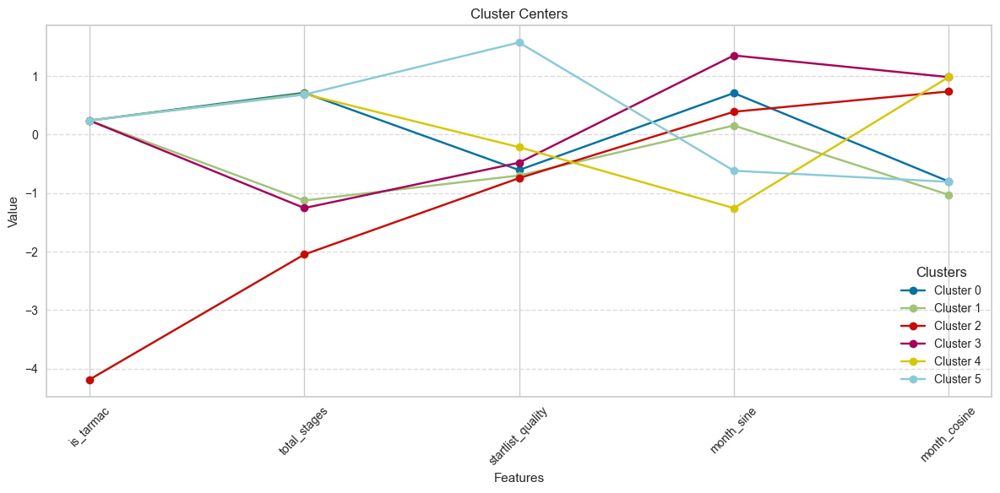

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Denormalize the cluster centers to make them interpretable
cluster_centers = kmeans.cluster_centers_

# Create a DataFrame for the cluster centers
cluster_centers_df = pd.DataFrame(cluster_centers, columns=data_cleaned.columns)
cluster_centers_df['Cluster'] = [f'Cluster {i}' for i in range(len(cluster_centers))]

# Plot a line for each cluster center
plt.figure(figsize=(12, 6))
for idx, row in cluster_centers_df.iterrows():
    plt.plot(data_cleaned.columns, row[:-1], label=row['Cluster'], marker='o')

# Add labels and legend
plt.title('Cluster Centers')
plt.xlabel('Features')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(title='Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

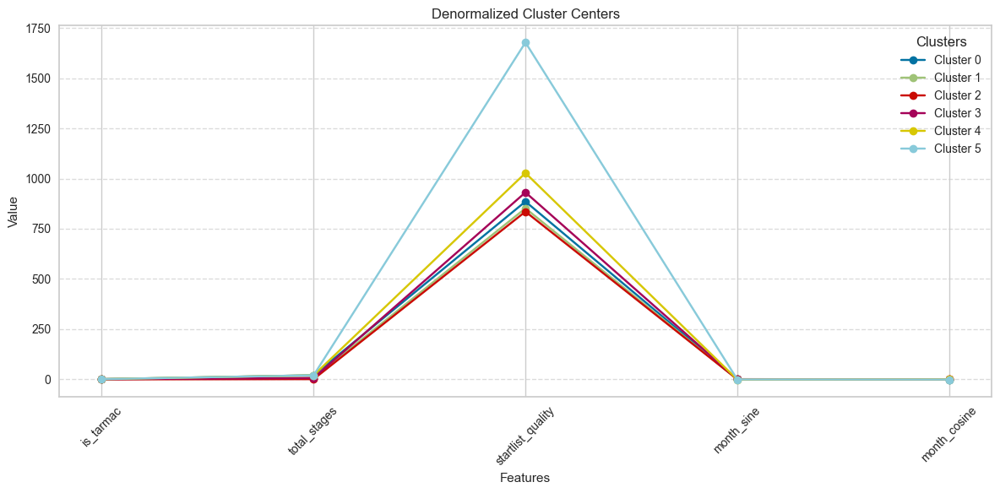

In [14]:
denormalized_centers = scaler.inverse_transform(kmeans.cluster_centers_)

# Create a DataFrame for the denormalized cluster centers
cluster_centers_df = pd.DataFrame(denormalized_centers, columns=data_cleaned.columns)
cluster_centers_df['Cluster'] = [f'Cluster {i}' for i in range(len(denormalized_centers))]

# Plot a line for each cluster center
plt.figure(figsize=(12, 6))
for idx, row in cluster_centers_df.iterrows():
    plt.plot(data_cleaned.columns, row[:-1], label=row['Cluster'], marker='o')

# Add labels and legend
plt.title('Denormalized Cluster Centers')
plt.xlabel('Features')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend(title='Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [39]:
import numpy as np
import pandas as pd

# Suppose 'avg' is your DataFrame of cluster means, with columns:
#   "month_sine", "month_cosine" and index: "Cluster".
# Something like:
# avg = data_cleaned.groupby('Cluster').mean()

results = []
for cluster_id, row in avg.iterrows():
    mu_sin = row['month_sine']
    mu_cos = row['month_cosine']
    angle = np.arctan2(mu_sin, mu_cos)  # in radians
    angle_2pi = angle % (2*np.pi)
    approx_month = 1 + (angle_2pi / (2*np.pi) * 12)

    results.append({
        "Cluster": cluster_id,
        "mean_month_sine": mu_sin,
        "mean_month_cosine": mu_cos,
        "approx_month": approx_month
    })

df_months = pd.DataFrame(results)


   Cluster  mean_month_sine  mean_month_cosine  approx_month
0        0         0.484567          -0.864886      6.024650
1        1         0.076071          -0.965092      6.849771
2        2         0.249027          -0.191095      5.250047
3        3         0.957823          -0.083333      4.165746
4        4        -0.962963          -0.083618      9.834575
5        5        -0.492537          -0.868025      7.985719


In [40]:
d =  df.iloc[data_cleaned.index]
data_cleaned["Cluster"] = kmeans.labels_
avg=data_cleaned.groupby('Cluster').mean()
avg['month'] = df_months['approx_month']# Use mean as an example
avg

,is_tarmac,total_stages,startlist_quality,month_sine,month_cosine,month
Cluster,,,,,,
0,1.0,20.358268,885.549213,0.484567,-0.864886,6.024650
1,1.0,7.464286,851.797619,0.076071,-0.965092,6.849771
2,0.0,1.000000,835.388489,0.249027,-0.191095,5.250047
3,1.0,6.559671,931.111111,0.957823,-0.083333,4.165746
4,1.0,20.211604,1027.619454,-0.962963,-0.083618,9.834575
5,1.0,20.135987,1677.711443,-0.492537,-0.868025,7.985719


In [15]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


In [38]:
pd.crosstab(data_cleaned["Cluster"],d['race_name'])

race_name,amstel-gold-race,dauphine,dwars-door-vlaanderen,e3-harelbeke,giro-d-italia,gp-montreal,gp-quebec,gran-camino,il-lombardia,itzulia-basque-country,la-fleche-wallone,liege-bastogne-liege,omloop-het-nieuwsblad,paris-nice,paris-roubaix,ronde-van-vlaanderen,san-sebastian,strade-bianche,tirreno-adriatico,tour-de-france,tour-de-romandie,tour-de-suisse,uae-tour,volta-a-catalunya,vuelta-a-espana,world-championship
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,477,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31,0
1,0,97,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,92,0,46,0,0
2,10,0,14,11,0,10,11,0,1,0,21,4,16,0,2,2,24,10,0,0,0,0,0,0,0,3
3,0,0,0,0,0,0,0,7,0,72,0,0,0,132,0,0,0,0,123,0,45,0,31,76,0,0
4,0,0,0,0,21,0,0,0,0,0,0,0,0,0,0,0,0,0,8,0,0,0,0,6,551,0
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,602,0,0,0,0,0,0


### H Clustering

In [6]:
import optuna
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
from sklearn.preprocessing import StandardScaler

# Define your dataset and feature columns
X = df[columns]  # Replace with your preprocessed dataset

selected_cols=['is_tarmac', 'total_stages', 'startlist_quality']
def objective(trial):
    # Get the remaining features (excluding selected_cols)
    remaining_features = [col for col in columns if col not in selected_cols]
    
    # Select True/False for each remaining feature
    selected_features = [trial.suggest_categorical(name, [True, False]) for name in remaining_features]
    
    # Get the actual feature names that are selected
    selected_feature_names = [name for name, selected in zip(remaining_features, selected_features) if selected] + selected_cols

    # Ensure at least 2 features are selected
    if len(selected_feature_names) < 4:
        return -1  # Penalize configurations with too few features

    # Ensure month_sine and month_cosine are selected together
    if 'month_sine' in selected_feature_names and 'month_cosine' not in selected_feature_names:
        selected_feature_names.append('month_cosine')
    if 'month_cosine' in selected_feature_names and 'month_sine' not in selected_feature_names:
        selected_feature_names.append('month_sine')

    # Prepare data for clustering
    X_filtered = remove_outliers_zscore(df[selected_feature_names])

    # Normalize the data
    scaler = StandardScaler()
    X_normalized = scaler.fit_transform(X_filtered)

    # Choose the number of clusters
    n_clusters = trial.suggest_int("n_clusters", 3, 7)

    # Define hyperparameters for Agglomerative Clustering
    linkage = trial.suggest_categorical('linkage', ['ward', 'complete', 'average', 'single'])
    affinity = 'euclidean' if linkage == 'ward' else trial.suggest_categorical('affinity', ['euclidean', 'manhattan', 'cosine'])

    # Train Agglomerative Clustering
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage, metric=affinity)
    model.fit(X_normalized)

    # Check if the biggest cluster is not bigger than 91% of the data
    cluster_sizes = pd.Series(model.labels_).value_counts(normalize=True)
    if cluster_sizes.max() > 0.91:
        print(f"Cluster with size {cluster_sizes.max()} exceeds 91% of data, skipping.")
        return -1  # Invalid configuration

    # Evaluate clustering using silhouette score
    score = silhouette_score(X_normalized, model.labels_)
    return score

# Create Optuna study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=500)

# Display best results
print("Best Parameters:", study.best_params)
print("Best Silhouette Score:", study.best_value)

[I 2025-01-03 01:07:40,422] A new study created in memory with name: no-name-4ee1a447-df6d-4506-8956-81251cf8193f
[I 2025-01-03 01:07:40,623] Trial 0 finished with value: 0.18658561298592577 and parameters: {'points': False, 'length': False, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': True, 'delta_var': True, 'delta_skew': True, 'BSA_mean': True, 'BSA_var': True, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 4, 'linkage': 'ward'}. Best is trial 0 with value: 0.18658561298592577.
[I 2025-01-03 01:07:40,707] Trial 1 finished with value: -1.0 and parameters: {'points': True, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': True, 'cyclist_age_mean': True, 'cyclist_age_var': False, 'cyclist_age_skew': True, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': False, 'month_sine':

Cluster with size 0.9636657246669358 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:41,091] Trial 3 finished with value: 0.18834331523491946 and parameters: {'points': False, 'length': True, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': True, 'cyclist_age_var': True, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 6, 'linkage': 'complete', 'affinity': 'cosine'}. Best is trial 2 with value: 0.20935607572311524.
[I 2025-01-03 01:07:41,277] Trial 4 finished with value: 0.1910025631099058 and parameters: {'points': True, 'length': True, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': True, 'delta_mean': False, 'delta_var': True, 'delta_skew': True, 'BSA_mean': False, 'BSA_var': True, 'BSA_skew': False, 'month_sine': True, 'month_cosine': True, 'n_clusters': 7, 'linkage': 'ward'}. Best i

Cluster with size 0.9325931800158604 exceeds 91% of data, skipping.
Cluster with size 0.9983566146261298 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:42,375] Trial 11 finished with value: 0.25015382098307243 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': True, 'cyclist_age_mean': False, 'cyclist_age_var': True, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': True, 'month_sine': False, 'month_cosine': True, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 8 with value: 0.36988179834915347.
[I 2025-01-03 01:07:42,596] Trial 12 finished with value: 0.3222663941418414 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': True, 'cyclist_age_mean': False, 'cyclist_age_var': True, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 7, 'linkage': 'ward'}. Best is trial 8 with value:

Cluster with size 0.9541101356743815 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:43,910] Trial 19 finished with value: 0.3487348902871631 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 5, 'linkage': 'ward'}. Best is trial 8 with value: 0.36988179834915347.
[I 2025-01-03 01:07:44,116] Trial 20 finished with value: 0.36988179834915347 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 8 with val

Cluster with size 0.952689041649818 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:45,588] Trial 28 finished with value: 0.27073231100652606 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 6, 'linkage': 'complete', 'affinity': 'manhattan'}. Best is trial 8 with value: 0.36988179834915347.
[I 2025-01-03 01:07:45,778] Trial 29 finished with value: 0.20787595436256354 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': True, 'delta_var': True, 'delta_skew': True, 'BSA_mean': True, 'BSA_var': True, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 3, 'linkage': 'war

Cluster with size 0.9323017408123792 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:48,162] Trial 41 finished with value: 0.38884780890347304 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 7, 'linkage': 'ward'}. Best is trial 33 with value: 0.39145917912892014.
[I 2025-01-03 01:07:48,387] Trial 42 finished with value: 0.38884780890347304 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 7, 'linkage': 'ward'}. Best is trial 33 wit

Cluster with size 0.9337442218798151 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:49,118] Trial 46 finished with value: 0.34913118400005844 and parameters: {'points': True, 'length': True, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 7, 'linkage': 'ward'}. Best is trial 33 with value: 0.39145917912892014.
[I 2025-01-03 01:07:49,341] Trial 47 finished with value: 0.25302654644230005 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': True, 'BSA_mean': False, 'BSA_var': True, 'BSA_skew': False, 'month_sine': False, 'month_cosine': True, 'n_clusters': 7, 'linkage': 'ward'}. Best is trial 33 with v

Cluster with size 0.9281598155973876 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:56,705] Trial 82 finished with value: 0.4398258544453512 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'cosine'}. Best is trial 66 with value: 0.4398258544453512.
[I 2025-01-03 01:07:56,910] Trial 83 finished with value: 0.4398258544453512 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'aver

Cluster with size 0.9307904050334251 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:57,865] Trial 88 finished with value: 0.22878348903511544 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': True, 'delta_mean': True, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:07:58,076] Trial 89 finished with value: 0.3408655752642172 and parameters: {'points': False, 'length': True, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'aver

Cluster with size 0.9281598155973876 exceeds 91% of data, skipping.


[I 2025-01-03 01:07:59,357] Trial 96 finished with value: 0.3823721612815658 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 5, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:07:59,553] Trial 97 finished with value: 0.494798468162937 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ave

Cluster with size 0.9307904050334251 exceeds 91% of data, skipping.


[I 2025-01-03 01:08:01,697] Trial 108 finished with value: 0.20066902099199074 and parameters: {'points': False, 'length': True, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': True, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:08:01,884] Trial 109 finished with value: 0.3829521257093267 and parameters: {'points': True, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'co

Cluster with size 0.9341801385681293 exceeds 91% of data, skipping.


[I 2025-01-03 01:08:07,989] Trial 140 finished with value: 0.36171455768181027 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': True, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:08:08,194] Trial 141 finished with value: 0.494798468162937 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'a

Cluster with size 0.9251101321585903 exceeds 91% of data, skipping.


[I 2025-01-03 01:08:09,933] Trial 150 finished with value: 0.20066902099199074 and parameters: {'points': False, 'length': True, 'year': True, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': True, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:08:10,134] Trial 151 finished with value: 0.494798468162937 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'av

Cluster with size 0.9314593762033115 exceeds 91% of data, skipping.


[I 2025-01-03 01:08:13,553] Trial 168 finished with value: 0.28208632820920204 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': True, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:08:13,770] Trial 169 finished with value: 0.40439354314467485 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': '

Cluster with size 0.9281598155973876 exceeds 91% of data, skipping.


[I 2025-01-03 01:08:20,110] Trial 199 finished with value: 0.40439354314467485 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:08:20,300] Trial 200 finished with value: 0.24567649490318563 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': True, 'BSA_mean': True, 'BSA_var': True, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'a

Cluster with size 0.9514483884128927 exceeds 91% of data, skipping.


[I 2025-01-03 01:08:28,073] Trial 237 finished with value: 0.494798468162937 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': True, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'average', 'affinity': 'manhattan'}. Best is trial 84 with value: 0.494798468162937.
[I 2025-01-03 01:08:28,287] Trial 238 finished with value: 0.46261910820831365 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 

Cluster with size 0.9358081979891725 exceeds 91% of data, skipping.


[I 2025-01-03 01:09:04,787] Trial 404 finished with value: 0.38558423257918684 and parameters: {'points': False, 'length': False, 'year': False, 'total_racers': True, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': True, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 262 with value: 0.562491596494746.
[I 2025-01-03 01:09:05,004] Trial 405 finished with value: 0.562491596494746 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 262 

Cluster with size 0.9329411764705883 exceeds 91% of data, skipping.


[I 2025-01-03 01:09:09,954] Trial 427 finished with value: 0.562491596494746 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 262 with value: 0.562491596494746.
[I 2025-01-03 01:09:10,196] Trial 428 finished with value: 0.33686431992814847 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': True, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 3, 'linkage': 'ward'}. Best is trial 262 

Cluster with size 0.9327698809066461 exceeds 91% of data, skipping.


[I 2025-01-03 01:09:14,926] Trial 451 finished with value: 0.45191909217129794 and parameters: {'points': True, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 262 with value: 0.562491596494746.
[I 2025-01-03 01:09:15,141] Trial 452 finished with value: 0.562491596494746 and parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ward'}. Best is trial 262 

Best Parameters: {'points': False, 'length': True, 'year': False, 'total_racers': False, 'aug_profile': False, 'cyclist_age_mean': False, 'cyclist_age_var': False, 'cyclist_age_skew': False, 'delta_mean': False, 'delta_var': False, 'delta_skew': False, 'BSA_mean': False, 'BSA_var': False, 'BSA_skew': False, 'month_sine': False, 'month_cosine': False, 'n_clusters': 6, 'linkage': 'ward'}
Best Silhouette Score: 0.562491596494746


In [7]:
# Plotting Optimization History
import optuna.visualization as vis

optimization_history_plot = vis.plot_optimization_history(study)
optimization_history_plot.show()

In [ ]:


# Prepare results storage
best_score = -1
best_model = None
best_features = None
best_res = None

# DataFrame to store all experiments
experiment_results = []

# Iterate over random feature sets and models
for iteration in range(10):  # Number of iterations to try
    # Randomly select between 4 and 12 features
    selected_features = random.sample(columns, k=random.randint(4, min(12, len(columns))))

    # Ensure month_sine and month_cosine are selected together
    if 'month_sine' in selected_features and 'month_cosine' not in selected_features:
        selected_features.append('month_cosine')
    if 'month_cosine' in selected_features and 'month_sine' not in selected_features:
        selected_features.append('month_sine')

    # Prepare data for clustering
    X = remove_outliers_zscore(df[selected_features])

    print(selected_features)

    try:
        # Use the c_models function
        results_df, clusterings, fit_models = c_models(X)

        # Loop through the results from c_models
        for i, row in results_df.iterrows():
            num_assigned_clusters = len(set(clusterings[i]))

            # Validate if number of clusters is as expected
            if not (3 <= num_assigned_clusters <= 6):
                print(f"Model {row['algorithm']} produced {num_assigned_clusters} clusters, skipping.")
                continue

            # Check if the biggest cluster is not bigger than 80% of the data
            cluster_sizes = pd.Series(clusterings[i]).value_counts(normalize=True)
            if cluster_sizes.max() > 0.91:
                print(f"Model {row['algorithm']} has a cluster covering more than 91% of the data, skipping.")
                continue

            # Extract silhouette score
            score = row['silhouette']

            experiment_results.append({
            'iteration': iteration,
            **row,
            'features': selected_features,
            'silhouette_score': score
            })

            # Update best results if score is higher
            if score > best_score:
                best_model_name = row['algorithm']
                best_score = score
                best_model = fit_models[i]
                best_features = selected_features
                best_res = clusterings[i]

    except Exception as e:
        # Catch and print errors (if any model fails)
        print(f"Error with selected features: {selected_features}, Error: {e}")

# Create a DataFrame of all experiments
experiments_df = pd.DataFrame(experiment_results)

# Display the best results
print(f"Best Silhouette Score: {best_score}")
print(f"Best Model: {best_model_name}")
print(f"Best Features: {best_features}")

# Display the experiment results DataFrame
experiments_df


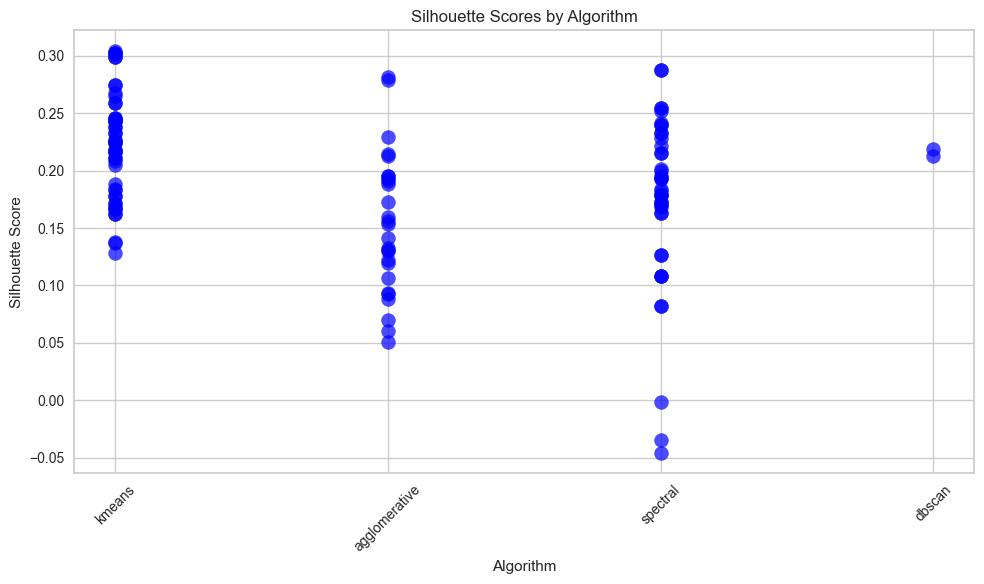

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(experiments_df['algorithm'], experiments_df['silhouette_score'], color='blue', alpha=0.7, s=100)
plt.xlabel('Algorithm')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores by Algorithm')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [9]:


mods = ['kmeans', 
        # 'ap',
        'meanshift',
        # 'sc',
        'hclust', 
        'dbscan', 
        # 'optics',
        'birch'
       ]


# Prepare results storage
best_score = -1
best_model = None
best_features = None
best_res = None

# DataFrame to store all experiments
experiment_results = []

# Iterate over random feature sets and models
for iteration in range(400):  # Number of iterations to try
    # Randomly select between 4 and 12 features
    selected_features = random.sample(columns, k=random.randint(4, min(12, len(columns))))

    # Ensure month_sine and month_cosine are selected together
    if 'month_sine' in selected_features and 'month_cosine' not in selected_features:
        selected_features.append('month_cosine')
    if 'month_cosine' in selected_features and 'month_sine' not in selected_features:
        selected_features.append('month_sine')

    # Prepare data for clustering
    X = remove_outliers_zscore(df[selected_features])
    # Randomly choose the number of clusters between 3 and 6
    num_clusters = random.randint(3, 6)

    print(selected_features, num_clusters)

    # Setup PyCaret
    s = setup(X, 
              session_id=13, 
              normalize=True, 
              verbose=False)
    X_t = get_config("X_transformed")

    # Loop through models
    for model_name in mods:
        try:
            # Create model with random number of clusters
            model = create_model(model_name, num_clusters=num_clusters)
            
            # Assign clusters
            res = assign_model(model)

            # Validate if number of clusters is as expected
            num_assigned_clusters = res['Cluster'].nunique()
            if not (3 <= num_assigned_clusters <= 6):
                print(f"Model {model_name} produced {num_assigned_clusters} clusters, skipping.")
                continue

            # Check if the biggest cluster is not bigger than 80% of the data
            cluster_sizes = res['Cluster'].value_counts(normalize=True)
            if cluster_sizes.max() > 0.91:
                print(f"Model {model_name} has a cluster covering more than 80% of the data, skipping.")
                continue

            # Calculate silhouette score
            score = silhouette_score(X_t, res['Cluster'])
            
            # Store experiment results
            experiment_results.append({
                'iteration': iteration,
                'model': model_name,
                'num_clusters': num_clusters,
                'features': selected_features,
                'silhouette_score': score
            })
            
            # Update best results if score is higher
            if score > best_score:
                best_model_name = model_name
                best_score = score
                best_model = model
                best_features = selected_features
                best_res = res

        except Exception as e:
            # Catch and print errors (if any model fails)
            print(f"Error with model {model_name}: {e}")

# Create a DataFrame of all experiments
experiments_df = pd.DataFrame(experiment_results)

# Display the best results
print(f"Best Silhouette Score: {best_score}")
print(f"Best Model: {best_model}")
print(f"Best Features: {best_features}")

# Display the resulting DataFrame with clusters
best_res

# Display the experiment results DataFrame
experiments_df


['startlist_quality', 'month_cosine', 'delta_mean', 'is_tarmac', 'month_sine', 'delta_skew'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3731,1013.1307,0.9431,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4499,552.1239,0.8390,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3664,931.0051,0.9629,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0740,163.6630,1.6355,0,0,0


Model dbscan produced 23 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2739,707.1089,1.1585,0,0,0


['total_racers', 'startlist_quality', 'month_sine', 'points', 'BSA_var', 'delta_var', 'length', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2762,508.8906,1.3351,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4092,34.4467,0.5728,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2638,474.8702,1.2482,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3617,11.5067,1.3765,0,0,0


Model dbscan produced 53 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2702,483.7803,1.2097,0,0,0


['cyclist_age_var', 'BSA_skew', 'BSA_mean', 'total_racers', 'points', 'delta_mean', 'total_stages', 'startlist_quality', 'delta_skew'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2127,504.3070,1.6270,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2860,65.2295,1.4051,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1834,465.7166,1.7551,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4381,3.9465,1.4786,0,0,0


Model dbscan produced 20 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2086,452.3110,1.5832,0,0,0


['points', 'month_cosine', 'BSA_skew', 'startlist_quality', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4037,1327.4536,1.0196,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2557,30.7337,1.5885,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3961,1295.5132,1.0292,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0995,199.5591,1.4910,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3169,609.4928,1.2129,0,0,0


['startlist_quality', 'delta_mean', 'month_cosine', 'total_racers', 'BSA_skew', 'delta_var', 'total_stages', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2700,675.6652,1.2953,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4020,44.4675,0.5588,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2582,611.7978,1.2787,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2781,25.8835,1.2640,0,0,0


Model dbscan produced 41 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2343,469.2571,1.3596,0,0,0


['aug_profile', 'startlist_quality', 'delta_mean', 'month_sine', 'cyclist_age_skew', 'BSA_skew', 'points', 'total_racers', 'delta_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1866,421.3858,1.6954,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1748,372.4571,1.7818,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1768,376.0443,1.7674,0,0,0


['is_tarmac', 'month_cosine', 'aug_profile', 'delta_var', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3516,861.2950,1.1165,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4744,253.0196,0.5164,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3354,971.6898,1.1675,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1401,226.6380,1.4498,0,0,0


Model dbscan produced 19 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2810,577.5272,0.8174,0,0,0


['is_tarmac', 'cyclist_age_mean', 'cyclist_age_var', 'month_sine', 'month_cosine', 'BSA_var', 'length', 'aug_profile', 'total_racers', 'year'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2739,651.5332,1.2839,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3870,381.1064,1.0049,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2807,575.3055,1.2562,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4043,4.0047,1.4845,0,0,0


Model dbscan produced 15 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2747,562.0472,1.2692,0,0,0


['delta_skew', 'total_stages', 'length', 'aug_profile', 'cyclist_age_var', 'BSA_skew', 'BSA_var', 'points', 'is_tarmac', 'delta_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2240,502.9268,1.6453,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5676,315.6611,0.5759,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1853,469.2108,1.4202,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2272,546.4164,1.3598,0,0,0


['BSA_mean', 'total_racers', 'delta_var', 'month_cosine', 'BSA_skew', 'aug_profile', 'year', 'points', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1931,399.8535,1.6695,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3230,34.8802,0.6339,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1609,340.1225,1.9033,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3550,6.6913,1.2104,0,0,0


Model dbscan produced 47 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1680,312.9443,1.5994,0,0,0


['cyclist_age_var', 'length', 'is_tarmac', 'BSA_skew', 'aug_profile', 'year', 'month_sine', 'total_stages', 'delta_skew', 'points', 'total_racers', 'delta_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1811,477.4700,1.9478,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2950,112.3798,0.7807,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2016,408.0861,1.5019,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2042,412.4418,1.5087,0,0,0


['aug_profile', 'is_tarmac', 'total_stages', 'BSA_var', 'BSA_skew', 'startlist_quality', 'points', 'cyclist_age_skew', 'month_sine', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2710,668.8781,1.2780,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5946,341.5121,0.5699,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2707,666.2361,1.2784,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2359,9.3365,1.2403,0,0,0


Model dbscan produced 104 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2701,637.5297,1.3768,0,0,0


['length', 'startlist_quality', 'BSA_skew', 'cyclist_age_mean', 'delta_skew', 'total_stages', 'month_cosine', 'delta_var', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2371,467.6569,1.7160,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3802,31.6462,0.5721,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2321,464.2493,1.5844,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4798,4.1496,1.5158,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1841,367.9397,1.7747,0,0,0


['aug_profile', 'month_sine', 'cyclist_age_mean', 'delta_var', 'delta_skew', 'year', 'BSA_mean', 'cyclist_age_skew', 'length', 'total_stages', 'BSA_var', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1506,384.2795,1.8988,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2931,37.7916,0.8724,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1432,294.2122,2.0688,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1417,308.3500,2.0008,0,0,0


['month_sine', 'delta_var', 'BSA_var', 'aug_profile', 'is_tarmac', 'BSA_skew', 'cyclist_age_mean', 'cyclist_age_skew', 'points', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1723,385.1198,1.7501,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3368,106.7725,0.6183,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1836,417.4933,1.5693,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3380,6.8296,1.3006,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1772,392.0748,1.5495,0,0,0


['total_racers', 'month_sine', 'cyclist_age_mean', 'total_stages', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3485,1094.6522,1.1796,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3330,1016.0688,1.1310,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0578,239.4312,1.3309,0,0,0


Model dbscan produced 31 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3448,832.3664,1.1708,0,0,0


['is_tarmac', 'cyclist_age_skew', 'cyclist_age_mean', 'year', 'cyclist_age_var', 'month_cosine', 'length', 'total_racers', 'month_sine', 'total_stages', 'startlist_quality'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1835,564.7642,1.7877,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4004,400.4167,1.0075,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1893,485.3516,1.7321,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2462,8.4240,1.2922,0,0,0


Model dbscan produced 93 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2072,529.2409,1.5372,0,0,0


['BSA_skew', 'points', 'startlist_quality', 'cyclist_age_var', 'total_racers', 'total_stages', 'year', 'BSA_var', 'length', 'aug_profile', 'is_tarmac'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1914,534.2859,1.6367,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5899,314.9269,0.5291,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2156,588.9561,1.3540,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3606,3.1322,1.6951,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2185,593.3436,1.3379,0,0,0


['total_stages', 'cyclist_age_mean', 'length', 'BSA_skew', 'BSA_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2470,635.7901,1.4707,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2280,584.0022,1.5514,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2149,32.7099,1.3841,0,0,0


Model dbscan produced 41 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2070,507.4639,1.6195,0,0,0


['total_racers', 'month_sine', 'delta_skew', 'is_tarmac', 'length', 'BSA_var', 'total_stages', 'cyclist_age_skew', 'year', 'cyclist_age_mean', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2004,453.7791,1.5744,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3999,402.2491,0.9950,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1767,400.8477,1.6580,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3268,3.9816,1.4323,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1820,401.4655,1.6325,0,0,0


['length', 'is_tarmac', 'cyclist_age_mean', 'total_stages', 'aug_profile', 'cyclist_age_var', 'delta_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2679,793.2724,1.1954,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4121,203.2914,0.4802,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2809,741.9550,1.1845,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3511,28.5594,1.3847,0,0,0


Model dbscan produced 35 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2427,541.4431,1.0479,0,0,0


['total_racers', 'delta_mean', 'aug_profile', 'delta_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3620,1518.9199,0.8150,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4979,152.3876,0.3323,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2719,1384.9836,1.0741,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2215,128.1609,2.1359,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3358,1166.1501,0.9249,0,0,0


['BSA_var', 'total_stages', 'cyclist_age_mean', 'is_tarmac', 'delta_var', 'month_sine', 'BSA_skew', 'BSA_mean', 'points', 'cyclist_age_var', 'total_racers', 'delta_skew', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1082,298.7666,1.9383,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2756,80.6094,0.7467,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1814,467.4428,1.8961,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3787,3.5156,1.3282,0,0,0


Model dbscan produced 15 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2309,457.5404,1.2897,0,0,0


['aug_profile', 'total_racers', 'points', 'BSA_var', 'delta_var', 'length', 'cyclist_age_var', 'year', 'is_tarmac', 'delta_skew', 'month_sine', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1879,464.1492,1.4727,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3314,89.1223,0.6559,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1847,390.4463,1.5017,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0742,3.6420,1.2025,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1768,387.7127,1.5142,0,0,0


['BSA_skew', 'month_cosine', 'cyclist_age_var', 'delta_mean', 'delta_var', 'month_sine', 'points', 'BSA_var', 'year'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2231,675.8621,1.6831,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3680,39.1256,0.5938,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1986,595.0815,1.5802,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1997,12.0588,1.2326,0,0,0


Model dbscan produced 94 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2051,455.6275,1.5261,0,0,0


['aug_profile', 'is_tarmac', 'month_sine', 'startlist_quality', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3995,973.7955,1.1865,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4995,701.2675,0.7761,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4173,1286.4025,0.9488,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2050,406.9051,1.5000,0,0,0


Model dbscan produced 19 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3347,992.9671,1.0686,0,0,0


['delta_mean', 'cyclist_age_skew', 'month_cosine', 'total_racers', 'total_stages', 'delta_var', 'cyclist_age_mean', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2316,606.7085,1.6003,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3984,44.8077,0.5455,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2264,580.6258,1.6078,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2823,13.8161,1.2540,0,0,0


Model dbscan produced 64 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2171,540.2613,1.5887,0,0,0


['BSA_mean', 'BSA_skew', 'points', 'cyclist_age_skew'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2661,670.1865,1.1338,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3533,6.4992,0.8997,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2360,558.2865,1.3453,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0010,84.0489,1.4713,0,0,0


Model dbscan produced 34 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2329,484.7289,1.2172,0,0,0


['BSA_var', 'cyclist_age_var', 'BSA_mean', 'month_cosine', 'is_tarmac', 'total_racers', 'points', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2369,600.3731,1.5605,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7021,207.7291,0.3709,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2420,637.5795,1.2731,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1175,46.6138,1.2855,0,0,0


Model dbscan produced 104 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2427,583.2880,1.2433,0,0,0


['BSA_var', 'BSA_skew', 'cyclist_age_skew', 'cyclist_age_mean', 'total_stages', 'points', 'startlist_quality', 'length', 'year', 'total_racers', 'month_sine', 'delta_skew', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2034,391.7424,1.6252,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1714,330.6436,1.7499,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2156,5.8296,1.1612,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1547,334.2337,1.7707,0,0,0


['delta_mean', 'cyclist_age_var', 'year', 'cyclist_age_mean', 'delta_skew', 'total_stages', 'cyclist_age_skew', 'points', 'month_sine', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2075,493.3466,1.6522,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1914,455.5815,1.6639,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4058,6.4150,1.3722,0,0,0


Model dbscan produced 57 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1837,456.6171,1.7082,0,0,0


['total_stages', 'delta_var', 'BSA_skew', 'points', 'aug_profile', 'cyclist_age_skew', 'delta_skew', 'cyclist_age_mean', 'is_tarmac', 'month_sine', 'length', 'BSA_var', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1692,367.4703,1.5539,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3027,108.8869,0.8015,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1730,348.6241,1.6453,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1664,328.5776,1.5991,0,0,0


['delta_mean', 'delta_var', 'year', 'length', 'is_tarmac', 'BSA_skew', 'month_cosine', 'BSA_mean', 'delta_skew', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1892,397.4263,1.6359,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3409,104.5934,0.6786,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1813,363.5326,1.6330,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3681,3.6757,1.5429,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1875,371.4643,1.6040,0,0,0


['length', 'cyclist_age_skew', 'total_racers', 'points', 'delta_mean', 'delta_skew', 'cyclist_age_var', 'BSA_skew', 'month_sine', 'month_cosine', 'delta_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1594,300.1173,1.5494,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3337,29.4700,0.6055,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1532,296.5783,1.9401,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1466,287.0738,1.8584,0,0,0


['cyclist_age_var', 'BSA_mean', 'BSA_var', 'month_sine', 'length', 'cyclist_age_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2721,683.0010,1.2613,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2483,578.0568,1.4217,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0427,34.1123,1.3582,0,0,0


Model dbscan produced 82 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2287,514.9565,1.4885,0,0,0


['BSA_skew', 'total_stages', 'startlist_quality', 'delta_skew', 'cyclist_age_var', 'BSA_mean', 'month_sine', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2784,671.4790,1.4820,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2595,631.8977,1.5094,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0800,23.8236,1.2690,0,0,0


Model dbscan produced 83 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2164,504.9962,1.7776,0,0,0


['delta_var', 'BSA_mean', 'delta_skew', 'BSA_skew', 'points'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1889,481.3819,1.7214,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2786,46.5329,0.5465,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1809,422.0674,1.8249,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2205,29.7931,1.6168,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2089,238.3927,1.0854,0,0,0


['is_tarmac', 'startlist_quality', 'BSA_var', 'month_cosine', 'cyclist_age_mean', 'points', 'delta_var', 'cyclist_age_skew', 'BSA_skew', 'cyclist_age_var', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2185,464.2049,1.7441,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3407,95.3549,0.6165,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2296,508.1168,1.3889,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0805,11.1069,1.3012,0,0,0


Model dbscan produced 120 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2380,521.0960,1.4088,0,0,0


['month_sine', 'year', 'cyclist_age_var', 'month_cosine', 'delta_mean', 'is_tarmac', 'cyclist_age_skew', 'BSA_skew'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2100,542.2213,1.4243,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4094,382.8933,1.0800,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2025,510.2472,1.4270,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1449,9.9837,1.4091,0,0,0


Model dbscan produced 118 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1878,485.1151,1.6094,0,0,0


['total_racers', 'is_tarmac', 'month_cosine', 'cyclist_age_var', 'aug_profile', 'BSA_var', 'delta_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2509,719.5356,1.2630,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4223,467.3031,0.9078,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2104,596.6965,1.3579,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3474,9.5482,1.3525,0,0,0


Model dbscan produced 61 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2086,535.2798,1.4846,0,0,0


['delta_mean', 'cyclist_age_mean', 'month_sine', 'cyclist_age_var', 'BSA_skew', 'cyclist_age_skew', 'length', 'total_racers', 'total_stages', 'delta_skew', 'BSA_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1630,426.4393,1.9878,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1392,350.4012,2.2329,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1273,344.5732,2.3042,0,0,0


['aug_profile', 'total_stages', 'length', 'year', 'month_sine', 'total_racers', 'delta_skew', 'cyclist_age_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1894,473.4630,1.6149,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1842,449.4475,1.5216,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3392,4.6787,1.3853,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1898,442.7823,1.5971,0,0,0


['BSA_mean', 'cyclist_age_skew', 'BSA_skew', 'month_sine', 'delta_var', 'month_cosine', 'delta_skew', 'startlist_quality', 'year', 'points', 'aug_profile', 'total_racers'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1632,331.3938,1.8795,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2637,37.6249,0.9249,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1570,293.3829,2.0227,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1370,282.6665,2.0888,0,0,0


['month_sine', 'BSA_var', 'startlist_quality', 'BSA_mean', 'year', 'points', 'delta_mean', 'total_stages', 'BSA_skew', 'length', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2285,516.6696,1.5142,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2048,465.9054,1.5848,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3366,6.0294,1.2806,0,0,0


Model dbscan produced 39 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1900,441.4733,1.6830,0,0,0


['year', 'delta_skew', 'delta_var', 'is_tarmac', 'month_cosine', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3056,731.8889,1.1284,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4289,188.2288,0.5907,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2848,666.2237,1.2028,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0475,104.8003,1.6709,0,0,0


Model dbscan produced 26 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2921,641.6045,0.9644,0,0,0


['month_cosine', 'cyclist_age_mean', 'delta_var', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3772,1134.2993,0.9198,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5276,79.1021,0.4998,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3387,1022.5379,1.0785,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1727,397.7361,1.5256,0,0,0


Model dbscan produced 11 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3498,678.7595,0.7938,0,0,0


['year', 'BSA_var', 'delta_var', 'total_racers', 'BSA_mean', 'cyclist_age_var', 'aug_profile', 'points', 'cyclist_age_mean', 'startlist_quality', 'delta_skew'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1702,406.6568,1.8588,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2616,36.7667,0.9612,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1616,368.6193,1.6448,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1337,337.8095,1.8802,0,0,0


['BSA_var', 'BSA_mean', 'cyclist_age_skew', 'total_racers', 'delta_skew', 'month_sine', 'startlist_quality', 'cyclist_age_mean', 'total_stages', 'cyclist_age_var', 'BSA_skew', 'delta_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1696,353.4732,1.8926,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7401,53.6182,0.2999,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1459,310.5945,2.1136,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2979,4.1447,1.2190,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1787,324.2023,1.8496,0,0,0


['length', 'cyclist_age_var', 'delta_mean', 'BSA_skew', 'month_sine', 'aug_profile', 'year', 'points', 'is_tarmac', 'total_stages', 'BSA_var', 'BSA_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2049,569.9550,1.7216,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5944,119.4816,0.5005,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1811,496.8980,1.8634,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2578,5.7975,1.1893,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2039,423.4139,1.4471,0,0,0


['aug_profile', 'BSA_var', 'BSA_mean', 'month_sine', 'total_racers', 'cyclist_age_var', 'delta_var', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2272,486.1714,1.3457,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3612,40.4320,0.6052,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1979,418.4940,1.4548,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3438,8.4767,1.2365,0,0,0


Model dbscan produced 54 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2046,370.0558,1.2924,0,0,0


['BSA_mean', 'delta_var', 'year', 'cyclist_age_skew', 'is_tarmac', 'cyclist_age_var', 'cyclist_age_mean', 'total_stages'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2335,700.8592,1.4515,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3858,156.8020,0.5701,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2066,627.8068,1.5259,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0159,18.2081,1.3465,0,0,0


Model dbscan produced 103 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2653,513.4515,0.9844,0,0,0


['cyclist_age_var', 'is_tarmac', 'startlist_quality', 'total_stages', 'BSA_skew', 'month_sine', 'aug_profile', 'BSA_var', 'delta_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1990,572.3625,1.6237,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3852,401.4668,0.9880,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2220,581.7048,1.5339,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3701,8.0891,1.2389,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2198,576.9000,1.5393,0,0,0


['BSA_var', 'month_cosine', 'is_tarmac', 'cyclist_age_mean', 'BSA_mean', 'length', 'cyclist_age_var', 'total_stages', 'points', 'aug_profile', 'BSA_skew', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1961,547.2871,1.7392,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6117,130.4528,0.5200,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1512,420.2937,1.9597,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4122,4.9345,1.3501,0,0,0


Model dbscan produced 31 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2091,419.2062,1.3527,0,0,0


['BSA_mean', 'total_stages', 'BSA_skew', 'is_tarmac', 'aug_profile', 'cyclist_age_skew', 'points', 'delta_mean', 'delta_skew', 'month_sine', 'BSA_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1674,413.8470,2.0031,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6323,248.2988,0.5447,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2206,450.8809,1.3417,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2083,3.4994,1.4803,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2195,447.9564,1.3406,0,0,0


['is_tarmac', 'BSA_skew', 'points', 'cyclist_age_mean', 'cyclist_age_skew', 'delta_mean', 'month_cosine', 'month_sine', 'length', 'delta_skew', 'cyclist_age_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1687,369.8887,1.6066,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5530,267.2194,0.6663,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1571,335.4482,1.6626,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2479,3.0703,1.8785,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1711,320.0606,1.5777,0,0,0


['BSA_var', 'delta_mean', 'is_tarmac', 'total_stages', 'cyclist_age_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2870,1023.9488,1.0873,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5542,925.1925,0.5875,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2832,951.1728,1.1597,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1045,245.1108,1.4770,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2801,947.5207,1.0639,0,0,0


['is_tarmac', 'cyclist_age_skew', 'BSA_skew', 'length', 'cyclist_age_var', 'month_cosine', 'aug_profile', 'cyclist_age_mean', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1736,386.1497,1.7745,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2701,185.9747,1.2600,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1728,372.2725,1.6570,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4275,3.9502,1.4893,0,0,0


Model dbscan produced 28 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1706,382.2702,1.6859,0,0,0


['total_stages', 'month_cosine', 'length', 'cyclist_age_mean', 'delta_mean', 'month_sine', 'total_racers', 'cyclist_age_var'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2111,644.2785,1.7048,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1961,524.8018,1.9507,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4080,10.2815,1.4108,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2333,510.2229,1.5920,0,0,0


['BSA_var', 'BSA_mean', 'delta_skew', 'year', 'total_racers', 'month_sine', 'cyclist_age_var', 'BSA_skew', 'startlist_quality', 'aug_profile', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1331,398.6381,2.1424,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1321,366.4670,1.7708,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3037,3.3941,1.4050,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1492,394.7400,1.7620,0,0,0


['month_cosine', 'BSA_var', 'aug_profile', 'cyclist_age_skew', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2410,590.8402,1.3166,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2013,505.7175,1.4028,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1607,56.1155,1.4778,0,0,0


Model dbscan produced 45 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1825,429.3254,1.4416,0,0,0


['BSA_mean', 'cyclist_age_var', 'delta_skew', 'cyclist_age_mean', 'startlist_quality', 'month_cosine', 'cyclist_age_skew', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2749,532.6823,1.3677,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2577,482.0552,1.3945,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1032,16.9989,1.3189,0,0,0


Model dbscan produced 99 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2414,460.7233,1.4964,0,0,0


['year', 'month_sine', 'month_cosine', 'BSA_mean', 'delta_mean', 'length', 'delta_skew', 'total_racers', 'total_stages'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1777,517.2180,1.8765,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2067,416.4323,1.7355,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3761,4.5359,1.3351,0,0,0


Model dbscan produced 15 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2064,415.9866,1.7376,0,0,0


['month_cosine', 'month_sine', 'BSA_var', 'cyclist_age_var', 'year', 'BSA_mean', 'delta_skew', 'delta_var'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1650,576.2644,2.1496,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3824,36.0830,0.6246,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1692,545.2740,1.9157,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3415,9.2063,1.4586,0,0,0


Model dbscan produced 75 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2623,400.6722,1.0112,0,0,0


['cyclist_age_mean', 'month_sine', 'cyclist_age_skew', 'total_racers', 'cyclist_age_var', 'year', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2204,606.7091,1.4437,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1882,517.9822,1.5380,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1629,49.9091,1.0837,0,0,0


Model dbscan produced 136 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1969,492.7509,1.8628,0,0,0


['delta_mean', 'BSA_mean', 'aug_profile', 'BSA_skew', 'cyclist_age_skew', 'is_tarmac', 'cyclist_age_mean', 'total_stages', 'startlist_quality', 'month_sine', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1916,463.8616,1.7823,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4135,322.0027,1.0535,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1833,447.8152,1.7713,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4054,5.0014,1.3150,0,0,0


Model dbscan produced 43 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1766,412.3347,1.8404,0,0,0


['month_cosine', 'BSA_var', 'length', 'BSA_mean', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2296,633.3159,1.6525,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2490,567.3703,1.4045,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0065,105.3513,1.3154,0,0,0


Model dbscan produced 39 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1973,523.5723,1.7386,0,0,0


['cyclist_age_mean', 'cyclist_age_skew', 'is_tarmac', 'year', 'aug_profile', 'month_cosine', 'BSA_mean', 'total_racers', 'delta_skew', 'month_sine', 'points', 'cyclist_age_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1495,331.3837,1.9597,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6353,125.8508,0.4918,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1541,375.8037,1.6437,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2655,4.4409,1.2592,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1567,381.8452,1.6298,0,0,0


['total_racers', 'BSA_skew', 'total_stages', 'delta_skew', 'length'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2973,692.8630,1.3230,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2814,105.5673,1.7439,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2970,687.3558,1.3208,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2085,41.3223,1.4055,0,0,0


Model dbscan produced 26 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1720,533.4330,1.8926,0,0,0


['cyclist_age_mean', 'delta_var', 'total_racers', 'cyclist_age_var', 'month_sine', 'BSA_var', 'startlist_quality', 'BSA_skew', 'is_tarmac', 'delta_mean', 'month_cosine', 'aug_profile'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1742,436.7430,1.6777,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2973,108.0584,0.7223,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1522,376.9260,1.8006,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3094,6.0922,1.1371,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1538,382.9202,1.7739,0,0,0


['total_racers', 'aug_profile', 'year', 'cyclist_age_mean', 'cyclist_age_var', 'length', 'BSA_skew', 'cyclist_age_skew', 'points', 'month_sine', 'is_tarmac', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1467,331.8340,2.0181,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5695,264.2891,0.6198,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1331,327.6553,1.5812,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3019,3.7830,1.3358,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1601,313.9006,1.5835,0,0,0


['total_stages', 'total_racers', 'aug_profile', 'cyclist_age_skew', 'year', 'length', 'month_cosine', 'points', 'cyclist_age_mean', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2238,621.7308,1.7206,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1963,509.1461,2.0302,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4010,3.7640,1.4684,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1950,554.5056,2.0124,0,0,0


['BSA_var', 'BSA_mean', 'total_stages', 'cyclist_age_skew', 'total_racers', 'year', 'cyclist_age_mean', 'month_sine', 'BSA_skew', 'is_tarmac', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2132,479.4048,1.4592,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4494,358.4804,1.0214,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1777,439.2818,1.6204,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2445,17.8747,1.1785,0,0,0


Model dbscan produced 191 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1851,398.8830,1.5238,0,0,0


['startlist_quality', 'month_sine', 'BSA_skew', 'points', 'total_racers', 'month_cosine', 'delta_var', 'BSA_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2459,473.5380,1.5736,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3755,35.5543,0.6496,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2235,443.0661,1.4496,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1841,11.8513,1.2095,0,0,0


Model dbscan produced 103 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2553,415.6451,1.2075,0,0,0


['delta_skew', 'BSA_mean', 'cyclist_age_skew', 'length', 'cyclist_age_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2273,643.4910,1.2916,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2129,554.2630,1.3083,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4305,10.2526,1.6391,0,0,0


Model dbscan produced 35 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1626,470.7666,1.4245,0,0,0


['startlist_quality', 'BSA_var', 'year', 'aug_profile', 'delta_skew', 'total_racers', 'month_cosine', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1863,466.6728,1.6591,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1490,405.9342,1.9037,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4249,5.8211,1.2801,0,0,0


Model dbscan produced 37 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1893,409.6009,1.6799,0,0,0


['is_tarmac', 'month_cosine', 'length', 'delta_skew', 'year', 'cyclist_age_var', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2569,662.5611,1.3281,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4129,461.4735,0.9222,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2535,626.7966,1.4024,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1073,36.3633,1.4323,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2621,553.6668,1.2026,0,0,0


['year', 'points', 'BSA_var', 'month_sine', 'cyclist_age_var', 'BSA_skew', 'delta_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2106,550.4498,1.5622,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2197,715.4661,1.4966,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0754,19.4142,1.2441,0,0,0


Model dbscan produced 106 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2144,696.2832,1.5138,0,0,0


['cyclist_age_var', 'delta_var', 'year', 'points'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3554,1296.8566,1.1326,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5057,79.7688,0.3985,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3367,1179.7317,1.1554,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0173,148.8478,1.7078,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3363,695.9366,0.8024,0,0,0


['BSA_skew', 'BSA_var', 'total_racers', 'BSA_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2021,613.9798,1.4879,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1796,516.5748,1.4846,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1922,35.2616,1.2468,0,0,0


Model dbscan produced 43 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1689,352.9596,1.5124,0,0,0


['BSA_mean', 'total_racers', 'cyclist_age_skew', 'year', 'delta_var', 'delta_skew', 'aug_profile', 'BSA_var', 'cyclist_age_var', 'startlist_quality', 'length'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1451,452.2996,2.0051,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2973,28.8028,0.6061,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1724,333.0859,1.8700,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1904,360.3893,1.7720,0,0,0


['delta_skew', 'BSA_var', 'month_cosine', 'delta_mean', 'aug_profile', 'cyclist_age_skew', 'total_stages', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2128,549.2009,1.5027,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1698,426.1864,1.7771,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4272,7.4597,1.4157,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1746,471.2392,1.6512,0,0,0


['year', 'length', 'BSA_skew', 'total_stages', 'points'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2801,900.0329,1.3158,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3764,737.4582,0.9953,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2949,928.3910,1.2230,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0269,129.2556,1.4295,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3202,856.6962,1.1653,0,0,0


['BSA_var', 'month_sine', 'aug_profile', 'delta_mean', 'delta_skew', 'cyclist_age_mean', 'BSA_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1867,587.4847,1.7370,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1452,426.1429,1.8686,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4762,6.7396,1.2946,0,0,0


Model dbscan produced 32 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1509,366.1802,2.0102,0,0,0


['delta_mean', 'cyclist_age_mean', 'cyclist_age_var', 'startlist_quality', 'month_cosine', 'total_stages', 'BSA_skew', 'total_racers', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2191,629.1600,1.6770,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2354,625.4489,1.5591,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3319,7.6692,1.2014,0,0,0


Model dbscan produced 84 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1739,560.4710,1.8285,0,0,0


['startlist_quality', 'delta_mean', 'total_stages', 'points', 'cyclist_age_mean', 'BSA_mean', 'delta_var', 'delta_skew', 'length', 'month_cosine', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2462,524.5055,1.4876,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2246,23.6343,0.7533,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2374,460.9366,1.4155,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4068,4.7843,1.4614,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2427,428.5797,1.2730,0,0,0


['points', 'BSA_skew', 'delta_var', 'cyclist_age_skew', 'month_sine', 'delta_mean', 'delta_skew', 'is_tarmac', 'total_racers', 'month_cosine', 'length', 'BSA_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1798,353.4850,1.5155,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3388,91.0204,0.6020,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1291,299.2247,1.7631,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1441,287.0684,1.7120,0,0,0


['is_tarmac', 'total_stages', 'BSA_mean', 'length', 'total_racers', 'month_sine', 'BSA_skew', 'delta_mean', 'delta_skew', 'cyclist_age_mean', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2009,424.6593,1.5438,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4292,353.0394,0.9836,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1735,383.7273,1.5752,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0723,3.8633,1.1787,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1714,376.8197,1.6455,0,0,0


['startlist_quality', 'points', 'delta_var', 'total_racers', 'cyclist_age_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2736,726.5053,1.2313,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4462,62.8574,0.4494,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2452,652.7384,1.3063,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1742,68.2886,1.3974,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2540,483.7326,1.2533,0,0,0


['year', 'total_racers', 'delta_skew', 'startlist_quality', 'points', 'cyclist_age_mean', 'is_tarmac'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2249,680.9456,1.2369,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6633,475.0047,0.4789,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2404,641.0822,1.3263,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2434,29.0959,1.5808,0,0,0


Model dbscan produced 39 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2270,618.9727,1.3677,0,0,0


['delta_mean', 'is_tarmac', 'BSA_skew', 'startlist_quality', 'total_racers', 'aug_profile', 'BSA_var', 'points', 'month_sine', 'delta_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2207,527.8098,1.3230,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3469,109.9374,0.5824,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2105,468.0573,1.3840,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3387,6.0503,1.1639,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2069,463.3200,1.4399,0,0,0


['year', 'delta_mean', 'cyclist_age_var', 'length'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3377,1305.6285,1.0179,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2915,1114.4054,1.1365,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0026,133.4378,1.9296,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3102,1101.4039,1.0572,0,0,0


['month_sine', 'aug_profile', 'BSA_mean', 'points', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2822,852.0316,1.2940,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3334,3.3933,0.5238,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2542,751.8244,1.3807,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0272,171.5785,1.6639,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3008,829.0488,1.2344,0,0,0


['cyclist_age_skew', 'month_cosine', 'total_stages', 'delta_skew', 'points', 'BSA_var', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2785,830.8044,1.4612,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3115,60.5182,1.0848,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2721,807.3260,1.4755,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0228,45.9479,1.3083,0,0,0


Model dbscan produced 61 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2511,669.8405,1.7073,0,0,0


['BSA_mean', 'cyclist_age_skew', 'BSA_var', 'length', 'is_tarmac', 'total_racers', 'cyclist_age_var', 'delta_skew', 'total_stages', 'month_sine', 'cyclist_age_mean', 'startlist_quality', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1801,414.4895,1.8906,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3954,309.1492,1.0503,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1657,384.4056,1.8743,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3001,4.0396,1.3668,0,0,0


Model dbscan produced 11 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1746,407.5809,1.7977,0,0,0


['startlist_quality', 'is_tarmac', 'month_sine', 'BSA_skew', 'BSA_mean', 'cyclist_age_skew', 'delta_var', 'length', 'points', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2520,462.9113,1.6371,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3811,81.1088,0.5427,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2178,499.9577,1.3391,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3650,5.4451,1.3894,0,0,0


Model dbscan produced 59 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2262,484.8795,1.5463,0,0,0


['total_stages', 'cyclist_age_skew', 'BSA_var', 'BSA_skew', 'delta_skew', 'delta_mean', 'year', 'month_cosine', 'delta_var', 'startlist_quality', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1596,403.7919,1.8568,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3298,31.9470,0.6251,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1458,347.2925,1.8377,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3564,3.9728,1.4126,0,0,0


Model dbscan produced 16 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1566,343.8587,1.8497,0,0,0


['delta_mean', 'length', 'cyclist_age_mean', 'delta_skew'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2844,1054.5672,1.1391,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2393,842.0613,1.2313,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0403,124.3707,3.9133,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1672,545.5231,1.5590,0,0,0


['delta_skew', 'month_cosine', 'delta_var', 'startlist_quality', 'cyclist_age_var', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2511,610.0669,1.5448,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4568,48.7017,0.5163,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2851,697.9426,1.3414,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0368,73.2117,1.4833,0,0,0


Model dbscan produced 31 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1759,323.1425,1.1202,0,0,0


['delta_mean', 'cyclist_age_skew', 'points', 'total_racers', 'month_cosine', 'total_stages', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2882,925.6316,1.3912,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2161,156.0962,1.0618,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2786,915.8950,1.4552,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1606,38.5100,1.3534,0,0,0


Model dbscan produced 58 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2763,909.4385,1.4662,0,0,0


['cyclist_age_skew', 'is_tarmac', 'month_sine', 'cyclist_age_mean', 'delta_var', 'startlist_quality', 'total_racers', 'aug_profile', 'delta_mean', 'total_stages', 'length', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2098,511.7268,1.4941,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3120,122.3210,0.6712,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1737,420.1279,1.5240,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2690,4.1202,1.3736,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2046,408.1016,1.6018,0,0,0


['month_sine', 'is_tarmac', 'cyclist_age_mean', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4119,1104.3404,0.9860,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5563,517.6862,0.7845,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4649,1703.8311,0.7060,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3471,869.1114,1.2464,0,0,0


Model dbscan produced 16 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3965,871.3014,1.1321,0,0,0


['points', 'BSA_var', 'aug_profile', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3297,1392.6110,0.9065,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7161,460.5612,0.4932,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2884,1211.4548,1.0008,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0331,178.6343,1.7156,0,0,0


Model dbscan produced 13 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2755,1079.7039,0.9706,0,0,0


['length', 'cyclist_age_mean', 'aug_profile', 'is_tarmac', 'total_stages', 'BSA_mean', 'BSA_skew', 'delta_var', 'delta_skew', 'month_sine', 'delta_mean', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1575,362.6766,1.8295,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3069,102.3850,0.6781,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1879,375.3585,1.5041,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1781,392.3545,1.5077,0,0,0


['delta_skew', 'delta_var', 'BSA_skew', 'BSA_mean', 'delta_mean', 'aug_profile', 'year', 'BSA_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1844,566.8070,1.5601,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3631,56.0566,0.4833,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1118,449.3082,1.9776,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3251,4.9396,1.5783,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1749,427.3617,1.3987,0,0,0


['startlist_quality', 'cyclist_age_skew', 'year', 'BSA_skew', 'BSA_var', 'delta_skew', 'is_tarmac'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1991,540.0253,1.5361,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4500,457.6573,0.9452,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1916,475.1943,1.5288,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0826,13.1188,1.4821,0,0,0


Model dbscan produced 97 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1890,495.7905,1.6089,0,0,0


['points', 'startlist_quality', 'delta_skew', 'is_tarmac', 'BSA_mean', 'total_stages', 'delta_var', 'BSA_var', 'length', 'cyclist_age_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2438,450.8811,1.5370,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3237,106.7294,0.5496,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2386,442.2939,1.2913,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4096,3.4370,1.8486,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2174,484.4753,1.4704,0,0,0


['cyclist_age_skew', 'aug_profile', 'delta_var', 'BSA_mean', 'delta_mean', 'startlist_quality', 'delta_skew', 'month_cosine', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1961,513.8637,1.8043,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3602,44.0993,0.5422,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1918,456.9522,1.5883,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4238,5.4452,1.4092,0,0,0


Model dbscan produced 15 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1829,475.2285,1.6363,0,0,0


['points', 'month_sine', 'cyclist_age_skew', 'BSA_var', 'is_tarmac', 'month_cosine', 'BSA_mean', 'cyclist_age_var', 'BSA_skew', 'total_racers', 'startlist_quality', 'total_stages'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2152,533.2603,1.5735,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6598,136.0813,0.4488,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2317,578.4750,1.3936,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2342,18.4175,1.1637,0,0,0


Model dbscan produced 187 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2236,565.6244,1.4403,0,0,0


['cyclist_age_mean', 'month_cosine', 'delta_var', 'total_racers', 'year', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2407,640.2895,1.5480,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4475,49.8404,0.5786,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2465,614.7816,1.5000,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1529,42.2967,1.2499,0,0,0


Model dbscan produced 56 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1822,312.9362,1.3141,0,0,0


['aug_profile', 'total_racers', 'total_stages', 'delta_skew', 'month_cosine', 'year', 'is_tarmac', 'points', 'delta_var', 'delta_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2553,660.6092,1.2399,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3459,110.3356,0.5485,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2328,613.3827,1.3180,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4983,4.7818,1.2647,0,0,0


Model dbscan produced 23 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2013,580.4480,1.6232,0,0,0


['total_racers', 'points', 'year', 'aug_profile', 'startlist_quality', 'total_stages', 'delta_mean', 'BSA_mean', 'month_cosine', 'cyclist_age_mean', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2425,629.5761,1.5271,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3047,21.8752,1.0399,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2445,623.7989,1.5433,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3626,7.2407,1.1299,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2205,596.0716,1.5024,0,0,0


['total_stages', 'cyclist_age_skew', 'startlist_quality', 'month_sine', 'length', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3437,805.8983,1.3224,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3798,925.3739,1.1409,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0431,132.4332,1.4139,0,0,0


Model dbscan produced 37 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3005,745.6271,1.3350,0,0,0


['startlist_quality', 'delta_var', 'BSA_var', 'aug_profile', 'month_cosine', 'delta_skew', 'points', 'is_tarmac', 'delta_mean', 'total_stages', 'length', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2258,612.3404,1.5847,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3319,101.4105,0.5742,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2040,529.3810,1.7101,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4061,5.8166,1.3440,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2012,546.1376,1.7113,0,0,0


['aug_profile', 'points', 'cyclist_age_mean', 'cyclist_age_skew', 'month_cosine', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2449,657.9927,1.5501,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2145,597.4018,1.7187,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0913,47.5107,1.4294,0,0,0


Model dbscan produced 67 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2113,602.3784,1.5608,0,0,0


['BSA_skew', 'BSA_mean', 'is_tarmac', 'startlist_quality', 'cyclist_age_skew', 'delta_mean', 'BSA_var', 'aug_profile', 'month_cosine', 'length', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1466,313.9131,2.0369,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3841,284.4608,1.1169,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1501,333.0400,1.8696,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1997,3.9947,1.2621,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1662,330.5605,1.7073,0,0,0


['aug_profile', 'month_cosine', 'cyclist_age_mean', 'total_stages', 'delta_skew', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2441,748.5623,1.6037,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2620,733.1606,1.4535,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1544,84.4741,1.5808,0,0,0


Model dbscan produced 26 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2064,630.2044,1.7841,0,0,0


['delta_var', 'startlist_quality', 'length', 'BSA_var', 'cyclist_age_mean', 'delta_skew', 'month_cosine', 'total_racers', 'year', 'cyclist_age_var', 'month_sine', 'total_stages'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1771,478.6310,1.7162,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3012,23.9834,0.6526,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1477,413.4319,1.8935,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0569,4.5449,1.1007,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1824,416.2520,1.7207,0,0,0


['month_cosine', 'delta_var', 'aug_profile', 'points', 'year', 'is_tarmac', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2404,593.1041,1.4921,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4219,132.8537,0.5042,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2494,595.6662,0.9862,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0902,99.7913,1.3055,0,0,0


Model dbscan produced 40 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6278,301.2969,0.3921,0,0,0


Model birch has a cluster covering more than 80% of the data, skipping.
['length', 'cyclist_age_var', 'total_racers', 'aug_profile', 'BSA_var', 'total_stages', 'delta_mean', 'cyclist_age_mean', 'month_cosine', 'delta_var', 'startlist_quality', 'delta_skew', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1806,497.4951,1.8267,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3050,28.8147,0.6336,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1393,359.6722,2.1564,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1589,426.8643,1.9374,0,0,0


['month_sine', 'cyclist_age_var', 'delta_skew', 'BSA_skew', 'aug_profile', 'year', 'delta_var', 'cyclist_age_mean', 'cyclist_age_skew', 'delta_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1853,534.3769,1.7498,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3336,35.7307,0.5950,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1469,368.9237,1.9760,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1473,427.5404,1.9703,0,0,0


['aug_profile', 'startlist_quality', 'total_stages', 'total_racers'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3284,1158.7045,1.1123,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3121,1099.8943,1.1826,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0596,186.6998,1.7103,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2765,999.2832,1.2815,0,0,0


['length', 'cyclist_age_mean', 'year', 'BSA_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2936,924.4121,1.1880,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2380,821.0197,1.2206,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2524,33.0460,1.4722,0,0,0


Model dbscan produced 18 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2556,767.0328,1.1834,0,0,0


['points', 'BSA_mean', 'startlist_quality', 'month_cosine', 'aug_profile', 'total_racers', 'year', 'is_tarmac', 'delta_skew', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2275,410.8717,1.5788,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6561,158.2527,0.3975,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2463,542.2126,1.4218,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3994,6.1146,1.2691,0,0,0


Model dbscan produced 34 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2267,498.9992,1.4846,0,0,0


['total_stages', 'cyclist_age_var', 'delta_var', 'year', 'cyclist_age_skew', 'month_sine', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2651,736.9561,1.3392,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4151,42.6778,0.5478,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2254,663.5754,1.4140,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0254,43.2876,1.3081,0,0,0


Model dbscan produced 75 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2461,607.0888,1.1990,0,0,0


['delta_mean', 'total_stages', 'BSA_mean', 'delta_var', 'aug_profile', 'month_sine', 'is_tarmac', 'points', 'length', 'startlist_quality', 'delta_skew', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2242,609.5991,1.5770,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3289,93.4947,0.5631,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1992,522.5519,1.6881,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3765,6.9064,1.2925,0,0,0


Model dbscan produced 11 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2049,409.9887,1.3283,0,0,0


['year', 'delta_skew', 'BSA_var', 'cyclist_age_var', 'length'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2517,985.9664,1.2077,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3616,19.6374,1.2564,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2215,844.9059,1.2992,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3067,41.2631,1.6187,0,0,0


Model dbscan produced 17 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2375,787.8499,1.3877,0,0,0


['delta_var', 'month_cosine', 'BSA_var', 'delta_mean', 'cyclist_age_skew', 'startlist_quality', 'delta_skew', 'year', 'points', 'total_racers', 'cyclist_age_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1630,361.3169,1.6993,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3041,28.3779,0.6685,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1662,336.3831,1.8792,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2510,4.5358,1.2154,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1496,314.6302,1.8506,0,0,0


['year', 'total_racers', 'month_cosine', 'cyclist_age_mean', 'cyclist_age_var', 'BSA_var', 'startlist_quality', 'delta_skew', 'length', 'cyclist_age_skew', 'BSA_skew', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1713,346.8485,1.9363,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1442,304.5361,1.9647,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2271,4.4047,1.1980,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1401,278.1855,2.0660,0,0,0


['cyclist_age_mean', 'delta_mean', 'BSA_mean', 'length', 'BSA_var', 'startlist_quality', 'total_stages', 'year', 'BSA_skew', 'total_racers', 'aug_profile', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1696,422.9763,1.5795,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4156,337.9481,0.9553,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1786,377.4678,1.6613,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0534,6.6279,0.8831,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1545,350.0390,1.7167,0,0,0


['month_cosine', 'delta_var', 'points', 'cyclist_age_mean', 'cyclist_age_skew', 'cyclist_age_var', 'total_stages', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2758,838.8858,1.4662,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3789,36.4459,0.5978,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2399,753.0565,1.6057,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0054,34.8404,1.2356,0,0,0


Model dbscan produced 86 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3019,553.2252,0.9937,0,0,0


['year', 'total_racers', 'delta_skew', 'aug_profile'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2294,736.8381,1.5114,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1860,565.8689,1.5000,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2347,21.0130,1.5523,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1984,643.5917,1.5452,0,0,0


['BSA_mean', 'delta_skew', 'month_cosine', 'aug_profile', 'delta_var', 'BSA_skew', 'delta_mean', 'is_tarmac', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2177,443.8284,1.6034,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3411,120.9894,0.6456,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2166,477.5373,1.4806,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4511,5.3664,1.4409,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2118,480.8526,1.5266,0,0,0


['total_racers', 'BSA_var', 'BSA_skew', 'is_tarmac', 'aug_profile', 'points', 'delta_skew', 'delta_var', 'cyclist_age_skew', 'delta_mean', 'cyclist_age_var', 'startlist_quality'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1869,405.5767,1.4847,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5723,110.0583,0.3901,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1314,333.8634,1.7995,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1083,332.9572,1.8409,0,0,0


['length', 'delta_mean', 'cyclist_age_skew', 'total_racers', 'BSA_var', 'year', 'delta_skew', 'aug_profile'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1943,564.6338,1.7141,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2817,51.8758,1.4166,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1339,425.2449,2.0847,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1939,481.5901,1.7087,0,0,0


['is_tarmac', 'total_racers', 'aug_profile', 'BSA_var', 'total_stages', 'cyclist_age_var', 'cyclist_age_mean', 'delta_mean', 'points', 'year'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2743,761.4654,1.4338,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6027,341.7454,0.5366,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2499,680.8881,1.4916,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4322,6.2301,1.2305,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2532,591.6277,1.1673,0,0,0


['startlist_quality', 'delta_var', 'month_sine', 'delta_mean', 'cyclist_age_mean', 'BSA_mean', 'cyclist_age_var', 'BSA_var', 'total_stages', 'year', 'aug_profile', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2022,606.0879,1.7443,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3148,33.8623,0.6129,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1696,508.6929,1.9964,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3286,7.7681,1.1742,0,0,0


Model dbscan produced 43 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1919,511.8949,1.7965,0,0,0


['cyclist_age_var', 'points', 'aug_profile', 'year', 'month_sine', 'delta_var', 'is_tarmac', 'delta_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2280,598.9286,1.2944,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3624,118.7259,0.5884,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1938,508.0502,1.4760,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3000,11.5038,1.4434,0,0,0


Model dbscan produced 69 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1903,419.2882,1.2526,0,0,0


['BSA_skew', 'BSA_mean', 'delta_var', 'cyclist_age_mean', 'delta_skew', 'total_stages', 'month_cosine', 'aug_profile', 'BSA_var', 'startlist_quality', 'length', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1783,374.4770,1.9970,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3057,24.9262,0.6758,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1792,339.6491,1.8204,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1701,320.7245,1.8773,0,0,0


['aug_profile', 'total_stages', 'length', 'cyclist_age_mean', 'BSA_var', 'points', 'startlist_quality'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2490,730.5573,1.6418,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2394,648.6387,1.5894,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3133,13.5453,1.5113,0,0,0


Model dbscan produced 63 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2806,658.3689,1.3681,0,0,0


['delta_mean', 'length', 'delta_var', 'month_cosine', 'delta_skew', 'BSA_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2415,550.2667,1.4070,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4443,48.8444,0.4853,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2555,526.8651,1.3585,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2400,33.9484,1.5523,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1954,402.4707,1.4832,0,0,0


['cyclist_age_var', 'aug_profile', 'is_tarmac', 'year', 'BSA_skew', 'cyclist_age_mean', 'BSA_mean', 'total_racers', 'cyclist_age_skew', 'total_stages', 'BSA_var', 'month_sine', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1450,344.8244,1.8544,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4073,297.5006,1.0910,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1684,415.7698,1.7094,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3371,5.6671,1.2403,0,0,0


Model dbscan produced 41 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1667,389.5966,1.8766,0,0,0


['startlist_quality', 'month_sine', 'BSA_skew', 'length', 'delta_mean', 'cyclist_age_mean', 'total_racers', 'BSA_mean', 'is_tarmac', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2472,491.8935,1.4675,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4304,343.6065,1.0214,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2226,449.8325,1.5083,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3469,4.2935,1.3392,0,0,0


Model dbscan produced 13 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2241,450.1069,1.5014,0,0,0


['total_stages', 'month_sine', 'cyclist_age_mean', 'points', 'BSA_var', 'length', 'month_cosine', 'startlist_quality', 'aug_profile'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2802,640.0139,1.2942,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2739,622.6728,1.3070,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3469,10.1931,1.3842,0,0,0


Model dbscan produced 71 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2637,616.2723,1.3139,0,0,0


['points', 'delta_mean', 'cyclist_age_var', 'month_sine', 'length', 'cyclist_age_mean', 'BSA_skew', 'is_tarmac', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1723,392.0202,1.9125,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5831,343.6797,0.5825,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1830,440.8639,1.6223,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3974,5.8519,1.4043,0,0,0


Model dbscan produced 52 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1997,405.7066,1.3562,0,0,0


['length', 'year', 'total_racers', 'cyclist_age_var', 'delta_skew', 'startlist_quality', 'cyclist_age_mean', 'BSA_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2004,471.5493,1.6138,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2757,18.4261,1.3707,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1590,394.4022,1.7908,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4038,5.0030,1.5813,0,0,0


Model dbscan produced 17 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1647,362.1898,1.8117,0,0,0


['delta_var', 'is_tarmac', 'aug_profile', 'total_stages', 'month_cosine', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3809,934.2512,0.9583,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4509,244.5000,0.5250,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3764,1127.1571,0.9476,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0505,208.1120,1.1728,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3187,759.9638,0.8687,0,0,0


['month_sine', 'cyclist_age_var', 'aug_profile', 'points', 'BSA_skew', 'cyclist_age_skew', 'is_tarmac', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1866,451.2044,1.7538,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6199,388.1450,0.5570,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2185,502.6349,1.1856,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1976,11.9457,1.3453,0,0,0


Model dbscan produced 94 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2162,501.6350,1.2062,0,0,0


['BSA_skew', 'BSA_mean', 'cyclist_age_mean', 'total_stages', 'BSA_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2247,694.4523,1.2779,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2296,686.2456,1.3093,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0805,78.8521,1.3216,0,0,0


Model dbscan produced 78 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1852,472.1943,1.6411,0,0,0


['aug_profile', 'month_sine', 'cyclist_age_var', 'year', 'points', 'delta_mean', 'delta_var', 'BSA_mean', 'total_stages', 'cyclist_age_skew', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2059,510.6137,1.6074,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1902,27.8288,0.5991,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1854,448.5737,1.5487,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3588,7.6637,1.2538,0,0,0


Model dbscan produced 43 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1790,417.5807,1.5894,0,0,0


['month_cosine', 'points', 'startlist_quality', 'length', 'cyclist_age_skew', 'delta_var', 'BSA_mean', 'year', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1860,444.7528,1.6077,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3639,31.4064,0.5998,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2357,495.1222,1.5569,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3041,8.5668,1.3865,0,0,0


Model dbscan produced 76 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2353,493.9801,1.5547,0,0,0


['total_stages', 'month_sine', 'BSA_var', 'cyclist_age_skew', 'total_racers', 'delta_mean', 'BSA_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1858,442.9455,1.7384,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1530,407.4980,1.8200,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3240,6.8492,1.2462,0,0,0


Model dbscan produced 76 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1448,384.1017,1.8012,0,0,0


['points', 'delta_var', 'month_sine', 'BSA_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3268,795.1424,1.2520,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4795,58.6806,0.5281,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3098,737.7627,1.2879,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0283,147.6822,1.4180,0,0,0


Model dbscan produced 36 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2472,483.4102,1.1345,0,0,0


['startlist_quality', 'cyclist_age_skew', 'BSA_skew', 'delta_mean', 'year', 'month_cosine', 'is_tarmac', 'total_racers', 'delta_skew', 'points', 'delta_var', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1965,403.1122,1.4733,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3254,92.1570,0.6308,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1783,352.7925,1.5628,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2262,4.2910,1.1563,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1750,349.5400,1.6274,0,0,0


['BSA_var', 'points', 'total_stages', 'delta_skew', 'year', 'delta_mean', 'cyclist_age_mean', 'aug_profile', 'cyclist_age_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2613,813.5774,1.2921,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2281,714.5479,1.3533,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4015,5.7342,1.3816,0,0,0


Model dbscan produced 18 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2177,657.7221,1.3837,0,0,0


['startlist_quality', 'month_sine', 'cyclist_age_skew', 'length', 'is_tarmac', 'BSA_skew', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1876,414.0860,1.6333,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4527,477.3584,0.9869,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2578,604.9310,1.5421,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0867,29.8112,1.4981,0,0,0


Model dbscan produced 64 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2477,560.4597,1.4459,0,0,0


['year', 'month_sine', 'points', 'delta_mean', 'total_racers', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2597,654.2066,1.4000,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2532,139.0912,1.4451,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2447,608.7770,1.4493,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0686,85.7688,1.3125,0,0,0


Model dbscan produced 40 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2404,496.7992,1.3107,0,0,0


['month_sine', 'length', 'month_cosine', 'BSA_skew'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3601,1038.4365,1.0254,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3319,903.0629,1.1031,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1600,281.1795,1.9284,0,0,0


Model dbscan produced 18 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2221,615.5523,1.4426,0,0,0


['delta_mean', 'cyclist_age_skew', 'total_racers', 'delta_skew', 'month_sine', 'cyclist_age_mean', 'startlist_quality', 'year', 'is_tarmac', 'total_stages', 'delta_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2044,463.5138,1.5463,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3051,115.8201,0.7070,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1938,414.4709,1.6653,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3107,4.2213,1.2794,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1937,409.6044,1.6406,0,0,0


['startlist_quality', 'is_tarmac', 'delta_skew', 'cyclist_age_var', 'year', 'aug_profile'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2014,597.2718,1.6039,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4411,525.3186,0.7690,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2666,728.8643,1.2550,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2754,32.4924,1.4636,0,0,0


Model dbscan produced 32 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2568,638.6402,1.2440,0,0,0


['BSA_var', 'cyclist_age_var', 'points', 'BSA_skew', 'delta_var', 'year', 'total_racers'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1881,654.4368,1.5853,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3738,43.2307,0.5437,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1579,581.8410,1.6639,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1749,12.3969,1.2455,0,0,0


Model dbscan produced 99 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2291,562.6995,1.2435,0,0,0


['total_racers', 'BSA_mean', 'delta_var', 'cyclist_age_var', 'delta_skew', 'length', 'cyclist_age_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1600,376.2778,1.9378,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2112,35.8586,0.9694,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1399,288.1171,1.9995,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3680,2.0641,2.5154,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1540,314.3595,1.7699,0,0,0


['length', 'BSA_var', 'total_stages', 'is_tarmac', 'delta_var', 'delta_skew', 'startlist_quality'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2834,683.2716,1.2270,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4200,205.6941,0.4618,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2670,613.1114,1.3394,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1877,50.2215,1.4911,0,0,0


Model dbscan produced 28 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2612,562.6261,1.0573,0,0,0


['delta_var', 'total_stages', 'delta_skew', 'cyclist_age_mean', 'total_racers'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2474,642.6287,1.2834,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4438,62.7129,0.3920,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2183,535.8791,1.4220,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1440,63.6296,1.7938,0,0,0


Model dbscan produced 13 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2146,483.0297,1.1420,0,0,0


['delta_skew', 'total_racers', 'month_cosine', 'BSA_mean', 'is_tarmac', 'total_stages', 'BSA_var', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2186,542.3412,1.7287,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4920,517.8318,0.8319,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2584,641.6432,1.4054,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1723,30.9630,1.4205,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2575,639.3484,1.4044,0,0,0


['cyclist_age_skew', 'length', 'is_tarmac', 'points', 'cyclist_age_mean', 'year'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2616,720.2057,1.1669,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6682,518.7879,0.5167,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2456,673.0603,1.2082,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0764,50.4485,1.4325,0,0,0


Model dbscan produced 42 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2102,518.4335,1.2432,0,0,0


['delta_mean', 'cyclist_age_mean', 'delta_var', 'month_sine', 'startlist_quality', 'year', 'is_tarmac', 'points', 'BSA_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2461,483.5935,1.4982,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3754,112.5975,0.5926,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2395,516.8943,1.3052,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1951,10.6158,1.2740,0,0,0


Model dbscan produced 96 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2406,431.4307,1.1526,0,0,0


['startlist_quality', 'is_tarmac', 'cyclist_age_var', 'cyclist_age_mean', 'BSA_var', 'total_stages', 'year', 'delta_skew', 'length', 'month_cosine', 'delta_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1912,518.7369,1.6845,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3397,344.8927,1.0385,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1791,475.8315,1.5803,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3320,4.1950,1.4666,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1780,461.7816,1.6103,0,0,0


['points', 'month_sine', 'startlist_quality', 'length', 'delta_var', 'BSA_var', 'is_tarmac', 'cyclist_age_mean', 'total_stages', 'aug_profile', 'BSA_skew', 'delta_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2037,528.6157,1.7209,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3256,91.3734,0.6132,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1719,439.5812,1.8668,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2054,5.6242,1.0892,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1822,390.8336,1.3861,0,0,0


['total_stages', 'cyclist_age_var', 'BSA_mean', 'cyclist_age_mean', 'month_cosine', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3543,979.5444,1.1109,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3408,908.1709,1.1687,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2320,212.7816,1.2185,0,0,0


Model dbscan produced 51 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3074,715.0880,1.2000,0,0,0


['startlist_quality', 'month_sine', 'BSA_mean', 'delta_skew', 'cyclist_age_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3553,808.9579,1.0973,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3413,772.9744,1.0995,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0024,74.0379,1.4035,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3190,732.7273,1.2199,0,0,0


['aug_profile', 'is_tarmac', 'delta_skew', 'delta_var', 'total_racers', 'points', 'BSA_skew', 'startlist_quality', 'month_sine', 'total_stages', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2473,515.2061,1.4367,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3096,106.5000,0.6177,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2373,507.4591,1.3656,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2706,3.1979,1.4178,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2181,449.9231,1.2658,0,0,0


['BSA_skew', 'delta_var', 'startlist_quality', 'delta_skew', 'month_sine', 'total_racers', 'aug_profile', 'cyclist_age_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1959,427.6586,1.6202,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3354,35.3668,0.6342,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1908,368.6873,1.7211,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2881,3.7678,1.3887,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1669,366.4564,1.7399,0,0,0


['delta_var', 'is_tarmac', 'total_racers', 'month_sine', 'aug_profile', 'startlist_quality', 'total_stages', 'points', 'cyclist_age_var', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2148,584.4815,1.4942,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3466,122.6436,0.5903,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2652,695.4769,1.3273,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3186,13.7855,1.3838,0,0,0


Model dbscan produced 58 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3015,542.9500,0.8293,0,0,0


['month_cosine', 'delta_var', 'is_tarmac', 'BSA_skew', 'BSA_var', 'cyclist_age_var', 'points', 'cyclist_age_mean', 'delta_skew', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2046,481.3933,1.3814,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3471,103.2712,0.6367,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2041,460.8706,1.3547,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3642,5.0651,1.3945,0,0,0


Model dbscan produced 52 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1823,359.3792,1.3316,0,0,0


['delta_mean', 'delta_var', 'BSA_skew', 'is_tarmac', 'cyclist_age_skew', 'points', 'startlist_quality', 'delta_skew', 'BSA_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1767,399.7504,1.7486,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6679,62.1719,0.4779,0,0,0


Model meanshift produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2126,443.2644,1.2091,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4329,3.4587,1.8884,0,0,0


Model dbscan produced 28 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2007,448.9923,1.2621,0,0,0


['delta_mean', 'delta_skew', 'month_cosine', 'BSA_var', 'year', 'cyclist_age_mean', 'length', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2046,494.3204,1.5092,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1900,413.1149,1.6012,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4681,4.9486,1.4224,0,0,0


Model dbscan produced 36 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1670,398.1925,1.7736,0,0,0


['BSA_skew', 'points', 'startlist_quality', 'cyclist_age_mean', 'BSA_mean', 'length', 'is_tarmac', 'delta_var', 'month_cosine', 'delta_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2528,503.0940,1.3540,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3617,77.3168,0.5494,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2182,468.3263,1.3252,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3887,5.0729,1.3339,0,0,0


Model dbscan produced 36 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2234,439.7741,1.3813,0,0,0


['delta_skew', 'points', 'cyclist_age_mean', 'length', 'year', 'month_cosine', 'BSA_skew', 'startlist_quality', 'cyclist_age_var', 'delta_mean', 'delta_var', 'aug_profile', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1845,409.7344,1.9613,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2974,28.9574,0.6372,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1589,331.4270,2.2318,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1536,331.9294,2.2313,0,0,0


['month_cosine', 'is_tarmac', 'points', 'delta_skew', 'length', 'year', 'total_stages', 'delta_var', 'cyclist_age_skew', 'cyclist_age_var', 'BSA_skew', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1841,496.5776,1.9151,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3166,86.9126,0.6310,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2358,496.9658,1.2592,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2253,3.9780,1.6982,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2358,496.9658,1.2592,0,0,0


['is_tarmac', 'cyclist_age_skew', 'length', 'year', 'month_cosine', 'delta_skew', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2378,525.1174,1.3973,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4244,457.4712,0.9591,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2353,499.3907,1.2743,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1890,18.4500,1.4625,0,0,0


Model dbscan produced 56 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2440,516.6065,1.2907,0,0,0


['is_tarmac', 'cyclist_age_var', 'month_cosine', 'cyclist_age_mean', 'BSA_var', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3129,975.7238,1.0620,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4806,589.0640,0.8740,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2902,939.6631,1.3287,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0836,154.3758,0.9952,0,0,0


Model dbscan produced 53 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3377,628.2170,1.1511,0,0,0


['is_tarmac', 'points', 'total_racers', 'BSA_skew', 'aug_profile', 'delta_skew', 'BSA_mean', 'cyclist_age_var', 'startlist_quality', 'delta_mean', 'month_cosine', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1917,376.1208,1.9136,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6311,127.8492,0.4489,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2049,435.5664,1.4731,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0007,5.1391,1.0144,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2050,435.4107,1.4696,0,0,0


['is_tarmac', 'cyclist_age_mean', 'BSA_var', 'BSA_mean', 'cyclist_age_var', 'startlist_quality', 'points', 'cyclist_age_skew', 'total_stages', 'aug_profile', 'delta_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2134,510.4910,1.7421,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6220,56.8301,0.5274,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1981,477.9655,1.8442,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3450,3.6655,1.5802,0,0,0


Model dbscan produced 24 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2187,468.1888,1.3143,0,0,0


['cyclist_age_var', 'BSA_var', 'delta_var', 'year', 'aug_profile', 'month_sine', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2487,863.8379,1.4814,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4076,47.4520,0.5783,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2141,680.6750,1.6631,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2351,28.9351,1.2978,0,0,0


Model dbscan produced 63 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2752,532.2752,1.0220,0,0,0


['startlist_quality', 'BSA_skew', 'total_stages', 'cyclist_age_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3180,1025.7209,1.1566,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3107,955.8905,1.2488,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0764,200.7050,1.2683,0,0,0


Model dbscan produced 23 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1846,476.8326,1.3267,0,0,0


['delta_skew', 'cyclist_age_skew', 'year', 'BSA_var', 'month_sine', 'BSA_skew', 'is_tarmac', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2424,537.6216,1.5399,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4180,395.2318,1.0662,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1611,437.0108,1.8883,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0617,11.3949,1.4239,0,0,0


Model dbscan produced 114 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2494,459.0747,1.4966,0,0,0


['total_stages', 'startlist_quality', 'BSA_skew', 'total_racers', 'length', 'year', 'delta_skew', 'cyclist_age_var'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1974,614.9786,1.7126,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1774,536.0405,1.8473,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3264,5.5697,1.4209,0,0,0


Model dbscan produced 19 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1732,498.1592,1.8410,0,0,0


['cyclist_age_mean', 'month_sine', 'BSA_mean', 'aug_profile', 'is_tarmac', 'month_cosine', 'length', 'cyclist_age_var', 'delta_skew', 'cyclist_age_skew'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1624,364.7497,1.7626,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3875,299.8689,1.1004,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1598,336.7724,1.8049,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3316,2.9005,1.6756,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1612,336.7289,1.8884,0,0,0


['month_cosine', 'cyclist_age_var', 'startlist_quality', 'total_racers', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3677,1051.7892,1.1383,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3726,1009.4121,1.0755,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1068,232.9868,1.2101,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3426,976.5051,1.2426,0,0,0


['total_stages', 'year', 'month_sine', 'delta_mean', 'is_tarmac', 'total_racers', 'cyclist_age_var', 'length', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2209,563.6477,1.5241,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4257,492.9797,0.8648,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1882,552.6924,1.6623,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3906,8.9889,1.4077,0,0,0


Model dbscan produced 53 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2425,558.1562,1.3808,0,0,0


['cyclist_age_var', 'total_racers', 'BSA_mean', 'length', 'month_sine', 'points', 'cyclist_age_skew', 'aug_profile', 'total_stages', 'year', 'delta_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1717,386.4082,2.0052,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2833,15.5052,1.0935,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1525,345.4854,1.8532,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0925,3.3012,1.3228,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1658,351.8779,1.9824,0,0,0


['cyclist_age_mean', 'cyclist_age_skew', 'BSA_var', 'month_sine', 'BSA_mean', 'delta_mean', 'total_stages', 'length', 'delta_var', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1855,407.8521,1.6796,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3581,35.0437,0.5851,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1875,354.2069,1.6278,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3976,4.6031,1.4082,0,0,0


Model dbscan produced 35 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1767,340.7313,1.6146,0,0,0


['total_racers', 'cyclist_age_skew', 'BSA_mean', 'delta_skew', 'delta_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1936,531.9513,1.3005,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1271,397.6176,1.6638,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3974,13.3143,1.6921,0,0,0


Model dbscan produced 34 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1465,404.7384,1.4518,0,0,0


['delta_skew', 'cyclist_age_mean', 'cyclist_age_var', 'cyclist_age_skew', 'month_cosine', 'BSA_skew', 'points', 'aug_profile', 'is_tarmac', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1651,362.0913,1.9021,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5733,295.3613,0.6485,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1732,384.5087,1.6841,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3566,4.7037,1.3321,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1681,404.4249,1.6817,0,0,0


['total_racers', 'points', 'BSA_mean', 'delta_var', 'BSA_var', 'aug_profile', 'BSA_skew', 'year', 'delta_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1873,532.6440,1.6064,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6839,41.6880,0.5659,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1650,471.1984,1.6754,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3278,6.8642,1.2621,0,0,0


Model dbscan produced 22 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1614,432.4508,1.7905,0,0,0


['delta_mean', 'BSA_var', 'cyclist_age_skew', 'is_tarmac', 'cyclist_age_mean', 'aug_profile'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2283,861.3656,1.2771,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4778,567.7633,0.8143,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2244,694.7530,1.2790,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3600,15.9001,1.4533,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1965,690.1411,1.4072,0,0,0


['total_stages', 'points', 'startlist_quality', 'month_sine', 'BSA_skew', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3768,1218.6528,1.0262,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3393,73.0753,0.8935,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3629,1342.3271,1.2000,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1304,230.5828,1.3127,0,0,0


Model dbscan produced 50 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3827,824.8439,0.9744,0,0,0


['cyclist_age_skew', 'year', 'month_cosine', 'startlist_quality', 'cyclist_age_mean', 'is_tarmac', 'cyclist_age_var', 'total_racers', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2587,621.2869,1.2670,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4161,403.0908,1.0437,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2511,599.3747,1.2935,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2309,32.4698,1.1821,0,0,0


Model dbscan produced 163 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2265,576.1919,1.5477,0,0,0


['BSA_var', 'total_stages', 'length', 'delta_var', 'cyclist_age_mean', 'cyclist_age_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2490,694.9250,1.4003,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4298,53.1828,0.4637,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2776,714.1572,1.2952,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2710,25.0496,1.3975,0,0,0


Model dbscan produced 51 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2269,542.5925,1.2583,0,0,0


['length', 'startlist_quality', 'BSA_var', 'cyclist_age_skew', 'aug_profile', 'delta_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2406,651.2391,1.4378,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2074,536.7898,1.7331,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4045,9.6349,1.4489,0,0,0


Model dbscan produced 48 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2241,586.8141,1.4629,0,0,0


['points', 'delta_var', 'delta_skew', 'month_sine', 'is_tarmac', 'BSA_mean', 'total_racers', 'cyclist_age_skew', 'year', 'startlist_quality', 'cyclist_age_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2300,451.8382,1.4094,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3111,85.1472,0.6924,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2277,444.6820,1.4001,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3716,3.8552,1.4008,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1995,409.6369,1.5911,0,0,0


['total_stages', 'delta_var', 'month_cosine', 'is_tarmac', 'startlist_quality', 'BSA_skew', 'month_sine', 'points', 'BSA_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2770,587.9771,1.3516,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3878,96.9643,0.5149,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3522,887.6162,1.0099,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0519,30.9320,1.3238,0,0,0


Model dbscan produced 85 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3012,682.3574,0.9496,0,0,0


['delta_mean', 'delta_var', 'BSA_skew', 'BSA_mean', 'is_tarmac', 'points', 'BSA_var', 'total_racers'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2083,549.1831,1.2929,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3954,117.8475,0.6174,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1804,471.7706,1.4288,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2999,7.3121,1.2653,0,0,0


Model dbscan produced 56 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1697,415.4056,1.4227,0,0,0


['total_stages', 'cyclist_age_skew', 'BSA_var', 'total_racers', 'BSA_mean', 'month_cosine', 'BSA_skew', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2112,464.1031,1.6637,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1629,408.1341,1.8022,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1879,25.4131,1.1385,0,0,0


Model dbscan produced 169 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1847,401.6741,1.7710,0,0,0


['month_cosine', 'BSA_var', 'is_tarmac', 'cyclist_age_mean', 'BSA_skew', 'length', 'startlist_quality', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2890,622.3460,1.2743,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4285,444.9857,0.9866,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2505,562.0538,1.3465,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0338,22.0508,1.4342,0,0,0


Model dbscan produced 91 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2775,569.7151,1.2872,0,0,0


['BSA_skew', 'aug_profile', 'BSA_mean', 'startlist_quality', 'length', 'delta_mean', 'month_cosine', 'cyclist_age_skew', 'is_tarmac', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1955,364.6888,1.9311,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3996,302.2843,1.0945,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1797,376.2618,1.8838,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3362,4.1011,1.4756,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1780,368.8578,1.6018,0,0,0


['delta_skew', 'total_racers', 'month_cosine', 'month_sine', 'aug_profile', 'BSA_var', 'points', 'length', 'is_tarmac', 'startlist_quality', 'BSA_skew', 'cyclist_age_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2030,413.1426,1.6253,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5631,274.8638,0.6007,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1957,366.2492,1.4947,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2086,385.8482,1.5019,0,0,0


['delta_var', 'cyclist_age_var', 'month_sine', 'points', 'cyclist_age_skew', 'is_tarmac', 'BSA_var', 'startlist_quality', 'total_racers', 'cyclist_age_mean', 'BSA_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2251,498.3661,1.7135,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3169,87.4202,0.6894,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2235,496.4568,1.6991,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2339,7.8320,1.1880,0,0,0


Model dbscan produced 98 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1958,429.6410,1.4950,0,0,0


['BSA_skew', 'cyclist_age_mean', 'BSA_mean', 'aug_profile', 'year', 'total_stages', 'is_tarmac', 'total_racers'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1910,510.6671,1.6942,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5028,498.5152,0.8407,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2059,535.0815,1.5892,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3354,6.8738,1.3102,0,0,0


Model dbscan produced 66 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2059,535.0815,1.5892,0,0,0


['delta_mean', 'month_cosine', 'year', 'is_tarmac', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2274,544.1913,1.6117,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4939,681.3082,0.7778,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2712,764.4156,1.4702,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0592,266.1339,1.4348,0,0,0


Model dbscan produced 18 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2255,688.1133,1.6157,0,0,0


['delta_var', 'total_stages', 'BSA_skew', 'BSA_mean', 'cyclist_age_skew', 'month_cosine', 'points', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2523,741.5860,1.4791,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2879,28.1087,0.6899,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2488,732.2165,1.5168,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1093,19.7187,1.2530,0,0,0


Model dbscan produced 98 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3014,516.6990,1.0444,0,0,0


['month_sine', 'points', 'cyclist_age_mean', 'total_stages', 'aug_profile', 'BSA_mean', 'delta_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2762,805.0416,1.3925,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2849,31.6411,0.7135,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2729,775.2587,1.3494,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2039,32.3531,1.2521,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3033,520.5855,1.0465,0,0,0


['month_sine', 'delta_mean', 'cyclist_age_var', 'total_stages', 'month_cosine', 'cyclist_age_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2776,934.4552,1.4275,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2766,874.7164,1.3981,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0392,107.3507,1.4068,0,0,0


Model dbscan produced 32 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2751,868.0569,1.4020,0,0,0


['total_stages', 'cyclist_age_mean', 'BSA_skew', 'cyclist_age_skew', 'month_cosine', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2583,716.8114,1.4449,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2467,640.0606,1.5088,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0951,76.9915,1.2491,0,0,0


Model dbscan produced 85 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2420,572.4708,1.6589,0,0,0


['delta_var', 'is_tarmac', 'total_racers', 'month_cosine', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3617,1033.8625,0.9907,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5203,277.0244,0.5344,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3607,1003.7625,0.9405,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1801,315.8506,1.3591,0,0,0


Model dbscan produced 15 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3129,727.7745,1.0411,0,0,0


['is_tarmac', 'year', 'delta_var', 'delta_skew', 'startlist_quality', 'total_stages', 'cyclist_age_mean', 'BSA_var', 'total_racers'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1892,497.4391,1.5817,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4429,204.4283,0.4696,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2181,596.2143,1.4628,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4428,3.9456,1.5360,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2186,588.0114,1.4319,0,0,0


['total_stages', 'delta_mean', 'startlist_quality', 'cyclist_age_mean', 'BSA_skew', 'delta_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2422,624.0756,1.3830,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4329,69.5309,0.4386,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2150,567.1468,1.2714,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2443,34.5133,1.2740,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2297,577.5241,1.2918,0,0,0


['delta_var', 'delta_mean', 'total_stages', 'cyclist_age_var', 'year', 'BSA_var', 'cyclist_age_skew', 'length', 'BSA_skew', 'points', 'cyclist_age_mean', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2064,501.8988,1.4380,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3245,93.1364,0.5832,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1936,440.9814,1.4525,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4005,3.7361,1.4509,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1797,435.8904,1.4564,0,0,0


['delta_skew', 'points', 'year', 'aug_profile', 'month_sine', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2191,571.5336,1.7447,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2446,596.3900,1.4403,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1073,68.3426,1.5060,0,0,0


Model dbscan produced 38 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1950,490.8894,1.7847,0,0,0


['delta_mean', 'cyclist_age_var', 'delta_skew', 'is_tarmac', 'total_stages'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3534,1293.3222,0.9590,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5331,842.1937,0.5565,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3229,1173.4491,0.9795,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1585,321.6759,1.8615,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2090,844.4536,1.2895,0,0,0


['cyclist_age_var', 'delta_var', 'total_stages', 'cyclist_age_skew', 'aug_profile', 'BSA_skew', 'points', 'month_cosine', 'startlist_quality', 'length', 'delta_mean', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1920,525.0451,1.7572,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3158,31.5938,0.6037,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1748,411.6889,1.8709,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1931,4.9281,1.2224,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1798,411.4219,1.8057,0,0,0


['startlist_quality', 'length', 'points', 'delta_var', 'total_racers', 'month_sine', 'cyclist_age_var', 'BSA_skew', 'cyclist_age_mean', 'month_cosine', 'aug_profile', 'total_stages'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2188,516.5053,1.7037,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2932,36.4252,0.8452,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1967,429.6573,1.7643,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1964,4.7361,1.1464,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2042,444.5494,1.7926,0,0,0


['total_stages', 'cyclist_age_mean', 'year', 'delta_skew', 'total_racers', 'points', 'month_cosine', 'cyclist_age_skew', 'month_sine', 'delta_mean', 'cyclist_age_var', 'startlist_quality'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1873,468.7959,1.7886,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2094,470.1060,1.6342,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3712,3.8975,1.3022,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1788,426.5434,1.9315,0,0,0


['month_cosine', 'delta_var', 'delta_mean', 'total_racers', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2977,902.8286,1.1220,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4942,76.0132,0.4634,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2783,740.7040,1.2197,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0173,191.6948,1.6214,0,0,0


Model dbscan produced 16 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2142,479.5183,1.1611,0,0,0


['delta_var', 'cyclist_age_mean', 'startlist_quality', 'BSA_var', 'total_racers', 'BSA_mean', 'delta_mean', 'aug_profile', 'cyclist_age_skew', 'delta_skew', 'year', 'length'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1618,456.9025,1.9299,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2945,34.2424,0.5704,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1351,328.9047,1.9992,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1557,368.2233,1.8870,0,0,0


['cyclist_age_skew', 'year', 'points', 'is_tarmac', 'cyclist_age_mean', 'aug_profile', 'delta_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2110,463.3636,1.5841,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4177,156.2300,0.4751,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1947,515.8584,1.4030,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2245,16.6476,1.4827,0,0,0


Model dbscan produced 68 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1582,351.3989,1.3343,0,0,0


['BSA_var', 'month_sine', 'cyclist_age_skew', 'year', 'aug_profile', 'points', 'cyclist_age_var', 'month_cosine', 'delta_var', 'BSA_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2055,429.2536,1.6373,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3096,31.6783,0.6536,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1921,405.3143,1.6261,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3110,9.3154,1.2187,0,0,0


Model dbscan produced 63 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1877,364.4797,1.4804,0,0,0


['BSA_mean', 'points', 'year', 'month_cosine', 'cyclist_age_mean', 'length', 'BSA_var', 'total_stages', 'is_tarmac', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2516,591.8106,1.6022,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6314,161.8936,0.4964,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2153,566.2151,1.3066,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0181,26.6769,1.2960,0,0,0


Model dbscan produced 98 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2662,713.7036,1.1878,0,0,0


['BSA_mean', 'BSA_skew', 'total_stages', 'points'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3434,1393.2838,1.0240,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4559,644.6292,0.8130,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3433,1262.4286,0.9969,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0109,260.3909,1.6966,0,0,0


Model dbscan produced 13 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2901,965.9828,1.0210,0,0,0


['points', 'delta_var', 'month_sine', 'startlist_quality', 'delta_skew', 'year', 'delta_mean', 'BSA_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2132,582.2777,1.6482,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3604,39.9976,0.5810,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1933,448.8279,2.0048,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3002,11.0475,1.4512,0,0,0


Model dbscan produced 70 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1999,401.3348,1.5783,0,0,0


['month_cosine', 'cyclist_age_var', 'aug_profile', 'delta_var', 'total_stages', 'year', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2426,692.7498,1.4650,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4041,47.7946,0.5611,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2520,637.0337,1.3031,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1419,49.5977,1.2934,0,0,0


Model dbscan produced 58 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2491,629.1562,1.1838,0,0,0


['aug_profile', 'cyclist_age_skew', 'cyclist_age_mean', 'BSA_var', 'total_stages', 'startlist_quality', 'delta_var', 'cyclist_age_var', 'total_racers', 'delta_mean', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2017,552.2423,1.3930,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3991,163.2715,0.5421,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1809,490.5343,1.4565,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3088,5.9637,1.1441,0,0,0


Model dbscan produced 20 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1763,463.4559,1.4598,0,0,0


['cyclist_age_var', 'aug_profile', 'BSA_mean', 'cyclist_age_skew', 'total_racers', 'year', 'startlist_quality', 'BSA_var', 'length', 'BSA_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1781,415.1860,1.9804,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2019,404.2995,1.7163,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3425,3.6057,1.4089,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1786,408.5064,1.7427,0,0,0


['total_stages', 'delta_skew', 'aug_profile', 'delta_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3850,1742.0526,0.8906,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3439,1377.5690,0.9427,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2322,295.2168,1.8663,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3399,1406.0062,1.0992,0,0,0


['total_stages', 'delta_var', 'cyclist_age_skew', 'BSA_var', 'cyclist_age_mean', 'aug_profile', 'total_racers', 'BSA_skew', 'month_cosine', 'startlist_quality', 'points', 'delta_skew', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1849,453.3641,2.0089,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7377,52.7713,0.3021,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1723,436.2405,2.1526,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1794,437.1191,2.0303,0,0,0


['delta_var', 'cyclist_age_var', 'aug_profile', 'BSA_skew', 'total_racers', 'BSA_mean', 'delta_mean', 'month_cosine', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1598,420.5667,1.7990,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3589,44.6931,0.5635,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1815,392.4067,1.5762,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3165,7.3217,1.2476,0,0,0


Model dbscan produced 22 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1807,360.4289,1.6473,0,0,0


['year', 'points', 'cyclist_age_var', 'BSA_var', 'delta_skew', 'length', 'BSA_skew', 'delta_mean', 'month_cosine', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1851,406.6696,1.7570,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1410,354.8010,1.8583,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3211,3.5376,1.5754,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1723,357.6712,1.7344,0,0,0


['startlist_quality', 'delta_var', 'total_stages', 'cyclist_age_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3219,1001.4673,1.1467,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5120,82.9996,0.3788,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3384,1063.4752,0.9047,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0325,295.7897,1.3885,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3380,976.4406,0.9032,0,0,0


['month_cosine', 'cyclist_age_mean', 'points', 'total_stages', 'cyclist_age_var', 'is_tarmac', 'cyclist_age_skew', 'length', 'delta_var', 'aug_profile', 'startlist_quality', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2483,553.4433,1.3816,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3141,93.1588,0.6244,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2165,522.2465,1.3713,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4520,3.9057,1.3705,0,0,0


Model dbscan produced 26 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2297,485.4861,1.4576,0,0,0


['cyclist_age_mean', 'startlist_quality', 'BSA_var', 'total_racers', 'BSA_mean', 'delta_mean', 'cyclist_age_skew', 'delta_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1893,442.7093,1.5179,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3841,46.8019,0.4980,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1322,338.8813,1.6283,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3158,6.8367,1.2221,0,0,0


Model dbscan produced 65 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1461,332.0597,1.5535,0,0,0


['startlist_quality', 'BSA_skew', 'year', 'aug_profile', 'delta_var', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2424,692.6303,1.3085,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4215,197.1396,0.5075,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2054,574.7372,1.1752,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2853,27.6060,1.3342,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1972,557.4039,1.1170,0,0,0


['delta_var', 'delta_skew', 'cyclist_age_skew', 'total_stages', 'startlist_quality', 'length', 'total_racers', 'BSA_skew', 'BSA_mean', 'year'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1709,336.8579,1.9029,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2871,29.5199,0.5542,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1464,294.4051,2.0967,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2000,1.6718,1.7946,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1311,288.9543,2.2266,0,0,0


['cyclist_age_mean', 'startlist_quality', 'BSA_skew', 'total_racers', 'aug_profile', 'BSA_var', 'total_stages', 'delta_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1916,511.8252,1.5786,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7761,45.5126,0.1495,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1869,449.9264,1.6546,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3468,7.3035,1.1475,0,0,0


Model dbscan produced 36 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1966,369.5898,1.4786,0,0,0


['cyclist_age_var', 'BSA_var', 'delta_skew', 'month_sine', 'cyclist_age_mean', 'total_stages', 'length', 'is_tarmac', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2001,564.2160,1.3599,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4114,466.2271,0.9169,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1963,526.7407,1.6266,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3158,10.6955,1.4566,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2055,545.9336,1.4068,0,0,0


['cyclist_age_skew', 'is_tarmac', 'startlist_quality', 'delta_skew', 'cyclist_age_var', 'total_racers', 'month_cosine', 'aug_profile', 'points', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2390,485.4305,1.8548,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6013,325.9696,0.5559,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2233,536.4573,1.3924,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3435,5.9165,1.3695,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2234,536.6780,1.3923,0,0,0


['startlist_quality', 'cyclist_age_var', 'cyclist_age_skew', 'total_racers', 'month_sine', 'points', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3053,681.3559,1.4417,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2762,630.8698,1.6589,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1686,64.7715,1.1531,0,0,0


Model dbscan produced 111 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3050,589.2347,1.3992,0,0,0


['points', 'length', 'delta_mean', 'BSA_skew', 'month_sine', 'is_tarmac', 'delta_skew', 'cyclist_age_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2036,463.3854,1.4914,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5938,334.9195,0.5858,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1953,416.4590,1.5101,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4678,3.7209,1.5561,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1632,392.0130,1.6390,0,0,0


['length', 'month_sine', 'month_cosine', 'total_racers', 'startlist_quality', 'BSA_var', 'total_stages', 'delta_mean', 'delta_var', 'is_tarmac', 'cyclist_age_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2162,529.7103,1.4166,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3345,136.4946,0.6353,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2041,467.1528,1.5071,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4029,5.6207,1.3093,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2266,457.9137,1.5357,0,0,0


['delta_skew', 'BSA_mean', 'cyclist_age_mean', 'is_tarmac'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2917,1250.2804,1.0678,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5841,318.9397,0.8604,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2472,1020.4189,1.0954,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0106,74.4327,1.5108,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3349,966.7450,1.1189,0,0,0


['startlist_quality', 'delta_mean', 'delta_var', 'BSA_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3035,949.0293,1.0331,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5303,109.7219,0.3517,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2731,868.6292,1.1793,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0330,99.5349,1.4517,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1874,472.4066,1.0725,0,0,0


['cyclist_age_skew', 'cyclist_age_var', 'startlist_quality', 'year', 'points', 'month_sine', 'delta_var', 'length', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2372,599.2520,1.6823,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3668,31.5290,0.5939,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2111,504.1451,1.9552,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3039,9.2702,1.3876,0,0,0


Model dbscan produced 86 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2059,456.4656,1.7438,0,0,0


['startlist_quality', 'month_sine', 'year', 'cyclist_age_skew', 'is_tarmac', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3570,964.9570,1.0434,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4694,553.0908,0.9142,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3582,948.1433,1.0253,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1431,128.2998,1.0917,0,0,0


Model dbscan produced 61 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2736,704.9450,1.3467,0,0,0


['total_racers', 'cyclist_age_mean', 'BSA_var', 'cyclist_age_skew', 'aug_profile', 'year', 'total_stages', 'month_cosine', 'is_tarmac', 'BSA_mean', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1876,506.5405,1.8044,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4311,363.5009,0.9904,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1914,472.2750,1.5851,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3510,5.8585,1.2245,0,0,0


Model dbscan produced 57 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1922,447.6809,1.6585,0,0,0


['total_racers', 'delta_mean', 'is_tarmac', 'delta_skew', 'cyclist_age_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2780,993.9613,1.1707,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5406,744.9841,0.7052,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2742,889.7907,1.1533,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0912,38.8472,1.3807,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2490,878.1258,1.2718,0,0,0


['cyclist_age_var', 'points', 'month_cosine', 'startlist_quality', 'delta_skew', 'cyclist_age_mean', 'year', 'BSA_skew', 'cyclist_age_skew', 'total_racers', 'is_tarmac', 'BSA_mean', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2002,344.5216,1.7216,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6341,116.0974,0.5072,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1961,386.8346,1.6196,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2679,5.9315,1.3322,0,0,0


Model dbscan produced 76 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1900,382.7881,1.6985,0,0,0


['total_racers', 'BSA_var', 'cyclist_age_var', 'total_stages', 'month_sine', 'delta_mean', 'delta_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2024,548.8390,1.5206,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1881,487.9302,1.4193,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4038,7.7344,1.3862,0,0,0


Model dbscan produced 56 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1863,476.0754,1.4991,0,0,0


['total_racers', 'year', 'cyclist_age_mean', 'month_sine', 'delta_mean', 'BSA_var', 'delta_skew', 'cyclist_age_skew', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1430,441.9106,2.0372,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1504,377.7317,2.0456,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3456,4.4299,1.2603,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1290,357.3499,2.0630,0,0,0


['month_cosine', 'is_tarmac', 'delta_skew', 'year', 'cyclist_age_var', 'BSA_var', 'cyclist_age_mean', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2419,647.9092,1.5795,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4038,412.3081,1.0003,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2281,695.2020,1.2649,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0685,21.6575,1.4021,0,0,0


Model dbscan produced 94 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2741,610.6583,1.4072,0,0,0


['total_stages', 'aug_profile', 'delta_skew', 'BSA_mean', 'points', 'BSA_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2482,705.7579,1.4020,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2753,56.6236,1.5367,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2121,611.8187,1.3401,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2601,23.2879,1.4091,0,0,0


Model dbscan produced 54 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2328,614.5492,1.3751,0,0,0


['delta_var', 'is_tarmac', 'delta_skew', 'cyclist_age_skew', 'aug_profile', 'month_cosine', 'total_racers', 'cyclist_age_var', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1822,450.8543,1.6089,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3345,130.0250,0.6769,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1683,405.8430,1.6225,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4042,4.1574,1.4183,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1758,397.5189,1.6058,0,0,0


['aug_profile', 'cyclist_age_var', 'total_racers', 'startlist_quality', 'BSA_skew', 'BSA_mean', 'cyclist_age_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1682,412.4801,1.7031,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1500,367.2176,1.8490,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3463,7.7508,1.2560,0,0,0


Model dbscan produced 56 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1408,331.5433,1.8174,0,0,0


['cyclist_age_skew', 'year', 'month_sine', 'total_stages', 'cyclist_age_mean', 'length', 'points', 'total_racers', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2232,487.2583,1.7390,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2243,532.1968,1.5847,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2272,12.6541,1.2613,0,0,0


Model dbscan produced 84 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2351,474.3127,1.5758,0,0,0


['points', 'BSA_skew', 'delta_skew', 'delta_var', 'cyclist_age_skew', 'startlist_quality'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1907,443.1039,1.4286,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3947,51.0263,0.4725,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1470,345.7793,1.4585,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3278,9.3030,1.5715,0,0,0


Model dbscan produced 62 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1123,309.7091,1.6088,0,0,0


['delta_skew', 'startlist_quality', 'cyclist_age_var', 'year', 'BSA_skew', 'aug_profile', 'total_racers', 'cyclist_age_skew', 'month_sine', 'length', 'cyclist_age_mean', 'points', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1570,332.5370,1.9902,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1561,310.1163,1.9860,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1546,308.6382,1.9917,0,0,0


['BSA_mean', 'delta_var', 'BSA_var', 'BSA_skew', 'delta_mean', 'year', 'startlist_quality', 'total_stages'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2006,543.2262,1.4154,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3749,49.8645,0.4981,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1958,464.6221,1.5236,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2287,11.2244,1.2876,0,0,0


Model dbscan produced 88 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1824,384.5805,1.4209,0,0,0


['delta_skew', 'is_tarmac', 'startlist_quality', 'BSA_skew', 'total_stages', 'month_cosine', 'points', 'aug_profile', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2832,707.0529,1.2211,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5979,377.2159,0.5227,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3005,743.9931,1.2300,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3008,14.3255,1.4102,0,0,0


Model dbscan produced 69 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2856,704.6812,1.1576,0,0,0


['points', 'BSA_mean', 'month_sine', 'aug_profile', 'BSA_skew', 'month_cosine', 'delta_mean', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2482,649.5156,1.2099,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6756,191.3806,0.4251,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2491,574.8803,1.1672,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2717,18.4788,1.3551,0,0,0


Model dbscan produced 54 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2239,538.4962,1.2182,0,0,0


['BSA_skew', 'month_sine', 'delta_mean', 'delta_var', 'startlist_quality', 'total_racers', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2524,614.5932,1.3597,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4317,50.8683,0.5451,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2304,539.5186,1.4482,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2813,25.8349,1.2620,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2143,407.5823,1.3099,0,0,0


['cyclist_age_skew', 'is_tarmac', 'BSA_mean', 'month_cosine', 'points', 'cyclist_age_var', 'total_stages', 'total_racers', 'year', 'BSA_skew', 'length', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1905,555.7808,1.7909,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6574,132.9649,0.4409,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2594,542.9197,1.2068,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2844,6.3364,1.2943,0,0,0


Model dbscan produced 78 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2584,538.7215,1.2080,0,0,0


['delta_mean', 'length', 'delta_skew', 'BSA_var', 'cyclist_age_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2225,719.4948,1.5022,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2296,624.7651,1.4882,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2648,30.0553,1.8049,0,0,0


Model dbscan produced 20 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1655,495.4790,1.7880,0,0,0


['cyclist_age_var', 'delta_mean', 'BSA_var', 'aug_profile', 'startlist_quality', 'cyclist_age_skew'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2064,717.5953,1.4958,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1815,614.2622,1.5750,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3559,12.5203,1.3799,0,0,0


Model dbscan produced 65 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1441,475.8636,1.6615,0,0,0


['points', 'length', 'delta_var', 'month_cosine', 'BSA_var', 'delta_mean', 'cyclist_age_var', 'startlist_quality', 'total_racers', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2028,443.5285,1.5293,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3515,33.8171,0.5832,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1813,376.1837,1.6549,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3987,5.4353,1.2707,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2142,366.8040,1.4578,0,0,0


['length', 'startlist_quality', 'BSA_mean', 'BSA_var', 'delta_skew', 'month_sine', 'cyclist_age_skew', 'BSA_skew', 'delta_var', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1947,352.0865,1.8369,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3550,27.7935,0.5956,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1759,321.0488,1.8691,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2201,1.3305,2.2431,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1510,285.1141,2.1182,0,0,0


['year', 'delta_var', 'delta_mean', 'month_cosine', 'aug_profile', 'BSA_var', 'startlist_quality', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2449,659.7232,1.4106,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4024,52.2834,0.5320,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1786,550.1832,1.5717,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2935,21.3396,1.2642,0,0,0


Model dbscan produced 58 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1625,379.4178,1.3290,0,0,0


['aug_profile', 'BSA_var', 'delta_skew', 'delta_var', 'points'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2346,700.3541,1.5508,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4404,65.1972,0.3953,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1787,540.3018,1.6837,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2285,34.6326,2.0269,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2094,351.8725,1.0852,0,0,0


['total_stages', 'length', 'month_sine', 'month_cosine', 'delta_var', 'cyclist_age_var', 'year'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2756,740.9255,1.3413,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4517,41.0131,0.5319,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2490,660.1321,1.4070,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0944,57.3802,1.2875,0,0,0


Model dbscan produced 48 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2531,452.7108,1.1727,0,0,0


['BSA_mean', 'month_sine', 'total_stages', 'BSA_skew', 'is_tarmac', 'delta_var', 'length', 'delta_skew', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1866,456.9592,1.7588,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3960,131.5865,0.6316,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1984,442.0109,1.7982,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4068,7.5865,1.4643,0,0,0


Model dbscan produced 45 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1967,436.4139,1.8118,0,0,0


['delta_var', 'aug_profile', 'points', 'delta_mean', 'BSA_var', 'BSA_mean', 'length', 'is_tarmac', 'month_cosine', 'cyclist_age_skew', 'BSA_skew', 'total_racers', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1692,349.9652,1.5099,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3096,67.3824,0.5609,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1421,303.2843,1.6558,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1331,285.5729,1.7848,0,0,0


['BSA_mean', 'cyclist_age_var', 'total_stages', 'delta_var', 'aug_profile', 'delta_skew', 'length'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2151,530.6615,1.3545,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2110,44.8528,0.7686,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2078,479.6390,1.4069,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4281,10.8096,1.4810,0,0,0


Model dbscan produced 32 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2394,478.7083,1.1983,0,0,0


['delta_mean', 'BSA_skew', 'month_sine', 'aug_profile', 'cyclist_age_skew', 'cyclist_age_var', 'is_tarmac', 'year', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1950,530.9791,1.4892,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3766,334.7541,1.1281,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1566,441.2372,1.5363,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4027,5.8868,1.3660,0,0,0


Model dbscan produced 48 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1426,406.5324,1.7474,0,0,0


['startlist_quality', 'month_cosine', 'BSA_var', 'cyclist_age_skew', 'is_tarmac', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3626,943.4169,1.0574,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4805,585.5763,0.8918,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3541,926.4587,1.0426,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1079,148.5449,1.0328,0,0,0


Model dbscan produced 47 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3193,681.8830,1.3029,0,0,0


['BSA_mean', 'cyclist_age_var', 'cyclist_age_skew', 'total_racers', 'startlist_quality'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2318,578.4530,1.4219,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2084,529.8565,1.4163,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0349,56.1820,1.1457,0,0,0


Model dbscan produced 95 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1593,379.7191,1.5371,0,0,0


['length', 'total_stages', 'total_racers', 'month_sine', 'month_cosine', 'delta_skew', 'BSA_mean', 'aug_profile', 'BSA_var', 'cyclist_age_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1815,373.1082,1.7219,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1481,322.4252,1.7845,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0017,5.5233,1.0116,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1649,331.6773,1.7292,0,0,0


['total_stages', 'BSA_var', 'delta_var', 'cyclist_age_mean', 'is_tarmac', 'delta_mean', 'BSA_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2150,639.4529,1.5136,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4243,208.2614,0.4792,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2136,613.2776,1.4283,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2931,27.3077,1.2772,0,0,0


Model dbscan produced 41 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3064,584.5919,1.0507,0,0,0


['year', 'BSA_mean', 'cyclist_age_skew', 'length', 'delta_var', 'cyclist_age_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2177,509.9364,1.3890,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4391,49.7847,0.4340,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1853,472.5494,1.4566,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3475,11.3957,1.4921,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1537,430.7096,1.4610,0,0,0


['BSA_skew', 'month_sine', 'cyclist_age_var', 'BSA_var', 'total_stages', 'delta_var', 'points', 'startlist_quality', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2560,709.9376,1.5333,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3561,31.3348,0.5848,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2465,761.6132,1.5974,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0002,21.2441,1.2259,0,0,0


Model dbscan produced 123 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2805,519.3046,1.0102,0,0,0


['month_cosine', 'total_racers', 'cyclist_age_var', 'startlist_quality', 'BSA_mean', 'delta_mean', 'is_tarmac', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2454,583.8433,1.3043,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4562,426.2439,0.9297,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3041,684.9617,1.2373,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2166,21.6913,1.2951,0,0,0


Model dbscan produced 61 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2881,670.2109,1.3929,0,0,0


['cyclist_age_skew', 'is_tarmac', 'BSA_mean', 'total_stages', 'cyclist_age_mean', 'delta_skew', 'aug_profile', 'total_racers', 'year', 'points', 'month_sine', 'BSA_skew', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1640,310.1134,2.0018,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6380,119.1239,0.4944,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1636,370.9855,1.7341,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2638,3.1569,1.4318,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1636,368.4743,1.7446,0,0,0


['is_tarmac', 'points', 'cyclist_age_var', 'month_sine', 'cyclist_age_mean', 'startlist_quality', 'month_cosine', 'delta_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3122,774.7702,1.3582,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6038,408.4339,0.5473,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3004,762.4219,1.3842,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0553,46.5456,1.4622,0,0,0


Model dbscan produced 68 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2769,716.2072,1.2355,0,0,0


['cyclist_age_skew', 'BSA_var', 'cyclist_age_mean', 'BSA_skew'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2042,723.3108,1.3756,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1426,524.1124,1.5584,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2022,38.8113,1.2456,0,0,0


Model dbscan produced 45 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1626,463.8645,1.6507,0,0,0


['startlist_quality', 'total_racers', 'delta_skew', 'BSA_mean', 'points', 'cyclist_age_var', 'length', 'cyclist_age_skew', 'month_cosine', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2258,442.0475,1.7819,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2268,5.0490,1.3078,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2298,424.9204,1.6036,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3775,5.1824,1.3814,0,0,0


Model dbscan produced 16 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2263,417.3437,1.6180,0,0,0


['cyclist_age_var', 'aug_profile', 'month_sine', 'is_tarmac', 'points', 'total_stages', 'delta_skew', 'startlist_quality', 'BSA_mean', 'cyclist_age_skew', 'cyclist_age_mean', 'BSA_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2218,503.8116,1.4162,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6117,115.3835,0.5568,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1898,462.8676,1.4611,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3493,4.9639,1.3298,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1802,453.5955,1.4862,0,0,0


['startlist_quality', 'delta_mean', 'cyclist_age_skew', 'aug_profile', 'BSA_var', 'BSA_skew', 'cyclist_age_var', 'length', 'delta_var', 'cyclist_age_mean', 'total_racers', 'month_sine', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1592,415.2102,1.9709,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3103,28.9767,0.6485,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1192,313.7249,2.3045,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0969,275.7250,2.4400,0,0,0


['length', 'cyclist_age_var', 'startlist_quality', 'BSA_skew', 'month_sine', 'cyclist_age_mean', 'BSA_var', 'delta_var', 'year', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1763,449.4164,1.8983,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3669,28.7139,0.5898,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2046,461.9323,1.5286,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3269,8.1462,1.2927,0,0,0


Model dbscan produced 58 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2056,461.6744,1.5254,0,0,0


['length', 'cyclist_age_mean', 'month_cosine', 'is_tarmac', 'delta_skew', 'total_racers', 'year', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1896,432.7256,1.8424,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4285,462.7789,0.9247,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1750,438.4162,1.5326,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3728,7.6506,1.5892,0,0,0


Model dbscan produced 43 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1612,382.0693,1.6474,0,0,0


['total_stages', 'aug_profile', 'BSA_mean', 'total_racers', 'BSA_skew', 'cyclist_age_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1488,481.0478,1.9686,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1604,460.9794,1.8423,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3419,8.7940,1.3598,0,0,0


Model dbscan produced 62 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2022,398.6144,1.7049,0,0,0


['aug_profile', 'total_stages', 'month_sine', 'total_racers', 'cyclist_age_skew', 'delta_var', 'cyclist_age_mean', 'delta_skew', 'BSA_var', 'delta_mean', 'is_tarmac', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2112,508.6829,1.4897,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2939,121.0057,0.6710,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1871,436.0879,1.5788,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0574,5.9060,1.1403,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1741,424.7070,1.5054,0,0,0


['delta_skew', 'year', 'aug_profile', 'BSA_var', 'cyclist_age_skew', 'points', 'total_racers', 'delta_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1785,446.9141,1.6345,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1375,361.0831,1.8004,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3155,3.2297,1.6962,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1397,373.8913,1.7719,0,0,0


['cyclist_age_var', 'aug_profile', 'BSA_var', 'total_stages', 'BSA_skew', 'delta_skew', 'delta_var', 'length', 'year', 'points', 'month_cosine', 'cyclist_age_mean', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1739,416.8091,1.8777,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2712,33.9692,0.9155,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1762,384.7464,1.6767,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1534,357.9089,1.8068,0,0,0


['cyclist_age_skew', 'delta_mean', 'delta_skew', 'startlist_quality', 'year', 'month_cosine', 'BSA_var', 'month_sine', 'aug_profile', 'points', 'total_stages', 'cyclist_age_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1988,520.5287,1.6819,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1763,443.6183,1.8240,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2511,6.1810,1.2447,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1631,420.1289,1.8681,0,0,0


['BSA_skew', 'BSA_var', 'delta_var', 'cyclist_age_skew', 'total_racers', 'delta_skew', 'startlist_quality', 'points', 'BSA_mean', 'total_stages', 'cyclist_age_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1994,440.4355,1.7448,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2263,30.2461,1.0942,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1870,395.4802,1.9207,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3520,3.8745,1.3267,0,0,0


Model dbscan produced 15 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1836,392.5323,1.7839,0,0,0


['startlist_quality', 'month_sine', 'total_racers', 'year', 'delta_skew', 'cyclist_age_skew', 'total_stages', 'delta_mean', 'BSA_var', 'cyclist_age_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1882,470.0482,1.6576,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1497,399.1719,1.7073,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3637,3.5952,1.3288,0,0,0


Model dbscan produced 16 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1629,415.8977,1.8615,0,0,0


['month_sine', 'aug_profile', 'is_tarmac', 'delta_mean', 'BSA_mean', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2858,696.0449,1.3846,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4902,524.6091,0.8498,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2676,729.0439,1.2240,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0945,118.5375,1.6055,0,0,0


Model dbscan produced 23 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2734,631.7981,1.2968,0,0,0


['cyclist_age_var', 'month_cosine', 'is_tarmac', 'year', 'BSA_mean', 'aug_profile', 'cyclist_age_skew', 'month_sine', 'startlist_quality', 'delta_var', 'total_stages', 'points'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2246,522.2208,1.3189,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2901,89.6013,0.6838,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2456,508.0601,1.5085,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3071,8.9445,1.2104,0,0,0


Model dbscan produced 70 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2123,459.0852,1.2057,0,0,0


['total_racers', 'delta_skew', 'BSA_var', 'delta_mean', 'BSA_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2163,640.9675,1.5340,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2911,34.3540,1.3928,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1821,520.1987,1.7143,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3905,10.3755,1.5616,0,0,0


Model dbscan produced 32 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1314,358.4459,1.9502,0,0,0


['delta_skew', 'points', 'delta_mean', 'BSA_skew', 'is_tarmac'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2626,893.9291,1.1121,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6827,325.5722,0.8219,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2257,776.4600,1.1725,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2046,53.8387,2.0184,0,0,0


Model dbscan produced 17 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2165,737.8649,1.2696,0,0,0


['year', 'total_stages', 'BSA_var', 'delta_skew', 'length', 'startlist_quality', 'cyclist_age_mean'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2255,631.7892,1.4319,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1745,511.7765,1.8619,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3096,11.7265,1.5899,0,0,0


Model dbscan produced 53 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1971,570.3030,1.7109,0,0,0


['cyclist_age_var', 'points', 'year', 'delta_mean', 'cyclist_age_skew', 'startlist_quality', 'BSA_mean', 'delta_skew', 'total_stages', 'month_sine', 'total_racers', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1971,573.9989,1.9062,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2929,16.1021,1.0782,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2094,583.4807,1.8375,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3846,4.0852,1.3025,0,0,0


Model dbscan produced 14 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1951,540.4651,1.8928,0,0,0


['startlist_quality', 'total_stages', 'is_tarmac', 'BSA_var', 'cyclist_age_skew', 'delta_var', 'month_sine', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2427,656.8967,1.3438,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4072,170.6292,0.6064,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2613,705.9876,1.4156,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0228,35.8751,1.2888,0,0,0


Model dbscan produced 74 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4500,326.9034,0.6625,0,0,0


Model birch has a cluster covering more than 80% of the data, skipping.
['cyclist_age_mean', 'cyclist_age_skew', 'BSA_mean', 'aug_profile'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2276,822.7871,1.4735,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1807,639.3823,1.7343,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3768,13.4513,2.0374,0,0,0


Model dbscan produced 24 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1459,497.3928,1.6495,0,0,0


['delta_skew', 'month_sine', 'BSA_mean', 'cyclist_age_mean', 'startlist_quality', 'total_stages', 'cyclist_age_var', 'BSA_skew', 'aug_profile', 'points', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2372,612.2707,1.5443,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2369,5.1168,1.3034,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2360,608.2594,1.5378,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3949,5.6804,1.2641,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2364,606.3343,1.5400,0,0,0


['delta_var', 'cyclist_age_mean', 'points', 'total_racers', 'BSA_skew', 'cyclist_age_skew', 'delta_mean', 'aug_profile', 'month_sine', 'BSA_mean', 'year', 'delta_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1422,315.9332,1.9225,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2776,28.9001,0.6453,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1303,278.4213,2.2139,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1470,276.0450,1.8976,0,0,0


['BSA_var', 'cyclist_age_var', 'startlist_quality', 'delta_mean', 'cyclist_age_skew', 'month_cosine', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2416,596.4109,1.4415,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2146,548.9141,1.5668,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1204,19.4395,1.2746,0,0,0


Model dbscan produced 111 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2183,551.8747,1.5723,0,0,0


['BSA_var', 'delta_mean', 'month_sine', 'points', 'year', 'cyclist_age_var', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2678,894.3172,1.4760,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2589,821.5052,1.3966,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0701,53.1342,1.3125,0,0,0


Model dbscan produced 71 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2430,759.9005,1.4011,0,0,0


['BSA_mean', 'points', 'startlist_quality', 'is_tarmac', 'cyclist_age_var', 'BSA_skew'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2996,984.6856,1.1234,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7194,180.3044,0.8394,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2900,933.5948,1.1531,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1942,73.2162,1.5169,0,0,0


Model dbscan produced 77 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2346,828.2048,1.1970,0,0,0


['delta_var', 'points', 'BSA_mean', 'BSA_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3206,822.9304,1.0047,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3826,61.3990,0.5232,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2729,669.3833,1.0966,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0211,132.9905,1.8592,0,0,0


Model dbscan produced 12 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2238,479.2213,1.1088,0,0,0


['year', 'month_cosine', 'delta_mean', 'delta_skew', 'cyclist_age_mean', 'cyclist_age_var', 'BSA_mean', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1787,577.6660,1.8660,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1419,485.0429,2.1930,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3758,8.2075,1.4493,0,0,0


Model dbscan produced 70 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1320,406.1920,2.1511,0,0,0


['points', 'cyclist_age_skew', 'BSA_skew', 'BSA_var', 'aug_profile', 'BSA_mean', 'delta_mean', 'cyclist_age_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1582,447.4074,1.8059,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2279,3.7321,1.1906,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1415,353.9119,1.8590,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4038,5.5205,1.4254,0,0,0


Model dbscan produced 36 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1286,357.9197,1.9466,0,0,0


['points', 'BSA_var', 'cyclist_age_mean', 'length', 'BSA_mean', 'aug_profile'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2325,599.6481,1.3839,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2851,5.6761,1.3869,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2057,516.2196,1.4361,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3789,10.7337,1.5902,0,0,0


Model dbscan produced 54 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1882,463.7354,1.6994,0,0,0


['total_stages', 'cyclist_age_skew', 'startlist_quality', 'month_sine', 'total_racers', 'BSA_skew', 'BSA_mean', 'cyclist_age_mean', 'length', 'BSA_var', 'points', 'delta_mean', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1531,379.6567,1.7274,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3088,13.6099,1.2019,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1527,425.3428,1.8540,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2717,4.7248,1.2332,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1677,455.5404,1.7665,0,0,0


['cyclist_age_mean', 'month_sine', 'points', 'length', 'startlist_quality', 'is_tarmac', 'BSA_skew', 'aug_profile', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2495,583.4559,1.5391,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5889,355.6344,0.5598,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2215,517.6734,1.1556,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3815,7.1231,1.4125,0,0,0


Model dbscan produced 61 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2246,352.5216,1.3536,0,0,0


['BSA_var', 'startlist_quality', 'delta_var', 'BSA_mean', 'aug_profile', 'year', 'points'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2325,641.6507,1.5758,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3832,46.3905,0.4891,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2112,569.2304,1.6313,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2189,21.9346,1.5117,0,0,0


Model dbscan produced 72 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2279,271.6318,1.2623,0,0,0


['cyclist_age_mean', 'cyclist_age_var', 'BSA_mean', 'total_stages', 'month_sine', 'BSA_var', 'delta_mean', 'length', 'year', 'delta_skew', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1875,437.8748,1.6747,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1631,399.2004,1.6388,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3052,4.2550,1.4997,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1937,381.6132,1.5887,0,0,0


['startlist_quality', 'BSA_skew', 'cyclist_age_mean', 'aug_profile'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2350,696.1849,1.2792,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1753,539.8533,1.4751,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2182,51.3064,1.4861,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1469,480.5611,1.4977,0,0,0


['BSA_skew', 'delta_var', 'BSA_mean', 'month_sine', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2543,632.3749,1.5838,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4786,59.6234,0.5092,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2750,601.6540,1.4618,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0666,82.9841,1.4845,0,0,0


Model dbscan produced 33 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2365,401.2097,1.0556,0,0,0


['length', 'startlist_quality', 'delta_skew', 'month_cosine', 'year', 'BSA_mean', 'delta_mean', 'cyclist_age_var', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1937,489.4374,1.7306,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1546,337.4959,2.0789,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4281,6.7271,1.3195,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1690,411.8971,1.7970,0,0,0


['delta_var', 'aug_profile', 'cyclist_age_skew', 'total_stages', 'BSA_skew', 'delta_skew', 'BSA_var', 'month_cosine', 'total_racers', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1659,342.4356,1.7197,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3219,30.1371,0.6095,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1300,295.2706,1.8986,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1200,277.0574,1.7079,0,0,0


['total_racers', 'month_sine', 'cyclist_age_mean', 'startlist_quality', 'month_cosine', 'delta_skew', 'length', 'BSA_mean', 'points', 'year', 'aug_profile'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2025,491.5914,1.7595,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1873,421.7039,2.0972,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1868,421.2810,2.0997,0,0,0


['BSA_skew', 'month_sine', 'cyclist_age_skew', 'total_racers', 'total_stages', 'is_tarmac', 'cyclist_age_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2375,694.1071,1.4503,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4862,546.8994,0.9279,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2154,643.8813,1.4654,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1252,27.0200,1.2179,0,0,0


Model dbscan produced 132 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2365,641.9525,1.4094,0,0,0


['cyclist_age_var', 'delta_mean', 'total_stages', 'delta_skew'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3382,1166.9218,0.9984,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2919,1006.1786,1.1724,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0427,193.5522,1.9281,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2699,950.4408,1.2135,0,0,0


['length', 'points', 'delta_mean', 'delta_skew', 'cyclist_age_skew', 'aug_profile', 'is_tarmac', 'BSA_var', 'month_sine', 'BSA_mean', 'total_racers', 'cyclist_age_var', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1535,280.8440,1.7638,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6219,117.0828,0.4734,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1270,293.1889,1.6722,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1378,284.6413,1.6548,0,0,0


['month_sine', 'BSA_skew', 'cyclist_age_skew', 'total_stages', 'cyclist_age_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2432,669.7137,1.4551,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2322,626.7533,1.5213,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1179,78.4678,1.1930,0,0,0


Model dbscan produced 84 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1592,375.7276,1.6830,0,0,0


['total_stages', 'cyclist_age_mean', 'BSA_mean', 'total_racers', 'year', 'BSA_var', 'is_tarmac', 'delta_var', 'length'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2244,621.7013,1.4980,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3674,154.7854,0.5795,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2027,582.9347,1.5593,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4055,4.4756,1.4890,0,0,0


Model dbscan produced 40 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1896,544.5417,1.6934,0,0,0


['length', 'month_cosine', 'delta_mean', 'BSA_skew', 'cyclist_age_var', 'points', 'delta_skew', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2011,470.0870,1.5865,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1781,402.2425,1.8754,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4484,6.0232,1.5059,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1790,387.5987,1.8002,0,0,0


['points', 'cyclist_age_var', 'BSA_var', 'aug_profile', 'year'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2545,1153.8290,1.5049,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2819,1199.4527,1.3556,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2058,75.5868,1.7070,0,0,0


Model dbscan produced 28 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2848,1201.7519,1.3392,0,0,0


['BSA_var', 'delta_var', 'cyclist_age_mean', 'cyclist_age_var', 'month_cosine', 'cyclist_age_skew', 'BSA_mean', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2056,519.8371,1.6482,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3837,36.9978,0.6125,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1831,430.1632,1.6015,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0602,16.5652,1.2673,0,0,0


Model dbscan produced 114 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1586,366.9159,1.4840,0,0,0


['cyclist_age_mean', 'BSA_skew', 'year', 'month_sine', 'delta_skew', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2229,526.2611,1.4577,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1973,464.0793,1.4888,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1199,31.9134,1.3837,0,0,0


Model dbscan produced 70 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2141,445.9294,1.5838,0,0,0


['delta_mean', 'month_sine', 'aug_profile', 'cyclist_age_skew', 'delta_skew', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2394,742.2415,1.5287,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2149,596.5487,1.4964,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2896,30.5354,1.8079,0,0,0


Model dbscan produced 31 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1423,505.4162,2.0475,0,0,0


['delta_var', 'BSA_skew', 'is_tarmac', 'year', 'total_stages', 'cyclist_age_var', 'cyclist_age_skew', 'length', 'cyclist_age_mean', 'points', 'month_sine', 'delta_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1909,507.2980,1.8537,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3189,85.1566,0.6259,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2202,459.7833,1.3172,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3328,3.4436,1.4004,0,0,0


Model dbscan produced 17 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2205,460.4566,1.3162,0,0,0


['total_stages', 'cyclist_age_skew', 'delta_skew', 'month_cosine', 'delta_var', 'year', 'points', 'delta_mean', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2110,485.5542,1.5047,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3517,39.9831,0.5592,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1849,470.2860,1.6312,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3125,11.7075,1.4137,0,0,0


Model dbscan produced 63 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1589,403.7647,1.4222,0,0,0


['total_racers', 'length', 'BSA_mean', 'month_cosine', 'cyclist_age_mean', 'aug_profile', 'startlist_quality', 'total_stages', 'is_tarmac', 'cyclist_age_skew', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2115,511.2995,1.6454,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4281,364.1268,0.9783,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2012,486.2994,1.5347,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3514,4.4034,1.4922,0,0,0


Model dbscan produced 11 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1977,398.9992,1.6309,0,0,0


['total_stages', 'total_racers', 'cyclist_age_skew', 'BSA_skew', 'delta_skew', 'month_sine', 'month_cosine', 'length', 'is_tarmac', 'delta_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2091,442.4077,1.5129,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3704,133.0494,0.6622,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1898,402.3813,1.5431,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3681,2.3033,1.6809,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1952,398.3584,1.5224,0,0,0


['year', 'is_tarmac', 'cyclist_age_var', 'BSA_var', 'month_sine', 'month_cosine', 'startlist_quality', 'cyclist_age_mean'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2915,792.5395,1.3110,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4140,431.8427,0.9871,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3017,937.2754,1.0319,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4554,92.7882,1.0124,0,0,0


Model dbscan produced 133 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2386,792.8703,1.3232,0,0,0


['total_stages', 'aug_profile', 'length', 'delta_mean', 'delta_var', 'cyclist_age_skew', 'cyclist_age_mean', 'BSA_mean', 'cyclist_age_var', 'BSA_skew'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1603,389.1568,1.6841,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2086,34.3322,0.7906,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1377,327.6733,1.6624,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2092,4.1157,1.2330,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1351,316.2913,1.5550,0,0,0


['cyclist_age_var', 'delta_mean', 'is_tarmac', 'startlist_quality', 'total_stages'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2750,851.6832,1.1769,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5374,886.2625,0.5684,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3208,1231.1115,1.1406,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0854,413.9896,1.6043,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3146,1095.7057,1.0776,0,0,0


['delta_skew', 'BSA_mean', 'startlist_quality', 'aug_profile', 'points', 'total_racers', 'delta_var', 'BSA_var', 'delta_mean', 'cyclist_age_skew', 'year', 'BSA_skew'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1400,334.2425,1.9210,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2521,30.7799,0.9446,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0874,275.0732,2.0167,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0978,266.4875,2.0811,0,0,0


['total_stages', 'delta_mean', 'delta_skew', 'aug_profile', 'delta_var', 'cyclist_age_var', 'month_sine', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2287,643.9692,1.4125,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3869,51.6671,0.5022,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2242,573.4661,1.3902,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2384,24.5384,1.4085,0,0,0


Model dbscan produced 57 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1876,467.5377,1.2588,0,0,0


['cyclist_age_mean', 'cyclist_age_var', 'startlist_quality', 'total_racers', 'delta_skew', 'total_stages', 'points', 'cyclist_age_skew', 'BSA_skew', 'month_sine', 'delta_mean', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2121,518.4996,1.6878,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1997,481.0123,1.7319,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3467,4.2820,1.2379,0,0,0


Model dbscan produced 11 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2007,503.9908,1.7064,0,0,0


['points', 'cyclist_age_mean', 'year', 'cyclist_age_var', 'delta_var', 'cyclist_age_skew', 'BSA_mean', 'BSA_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2279,615.5684,1.4866,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2366,90.8248,0.6378,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2082,560.5633,1.5375,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0017,18.0326,1.3744,0,0,0


Model dbscan produced 116 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1774,461.5268,1.3677,0,0,0


['delta_mean', 'year', 'is_tarmac', 'delta_skew', 'points', 'aug_profile', 'cyclist_age_mean', 'month_cosine', 'BSA_mean', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1955,436.0935,1.6295,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6108,146.3786,0.5239,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1689,411.4381,1.5392,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4603,6.7231,1.3618,0,0,0


Model dbscan produced 34 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1594,388.7756,1.4525,0,0,0


['is_tarmac', 'month_sine', 'cyclist_age_skew', 'BSA_mean', 'cyclist_age_mean', 'delta_mean', 'total_racers', 'delta_skew', 'delta_var', 'BSA_var', 'month_cosine', 'cyclist_age_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1576,360.7679,1.6580,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3154,95.9370,0.7275,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1427,322.4556,1.8010,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2684,3.9925,1.3768,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1386,320.2569,1.7878,0,0,0


['delta_mean', 'aug_profile', 'total_racers', 'cyclist_age_mean', 'cyclist_age_var', 'year', 'startlist_quality', 'cyclist_age_skew', 'BSA_skew', 'length', 'delta_skew'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1447,413.4048,1.9660,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1412,283.6938,2.2179,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0996,316.6298,2.1805,0,0,0


['total_stages', 'length', 'delta_var', 'cyclist_age_mean', 'points', 'delta_mean', 'startlist_quality'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3258,843.5258,1.0890,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4145,54.0409,0.4434,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3059,780.3272,1.1261,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2440,44.1880,1.4034,0,0,0


Model dbscan produced 38 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2836,666.6335,1.0604,0,0,0


['length', 'delta_skew', 'BSA_var', 'aug_profile', 'total_racers', 'delta_mean', 'points', 'cyclist_age_var', 'is_tarmac'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2302,575.3593,1.2132,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6070,352.8704,0.5097,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2121,526.5770,1.2715,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0417,4.9159,1.1396,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2068,524.8129,1.2735,0,0,0


['total_stages', 'cyclist_age_skew', 'BSA_skew', 'delta_skew', 'year', 'cyclist_age_var'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2035,597.9528,1.5731,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2196,597.8880,1.6080,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1615,20.5468,1.3416,0,0,0


Model dbscan produced 73 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2352,602.9268,1.5253,0,0,0


['total_racers', 'BSA_var', 'is_tarmac', 'BSA_skew', 'delta_skew', 'points', 'total_stages', 'cyclist_age_mean', 'length', 'year', 'delta_mean', 'cyclist_age_skew'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1534,387.1166,1.8407,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5760,270.2692,0.6195,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1721,383.1703,1.6350,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1698,399.4602,1.5777,0,0,0


['points', 'length', 'delta_mean', 'is_tarmac', 'delta_skew', 'total_racers', 'cyclist_age_skew', 'month_sine', 'BSA_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1566,363.4068,2.0413,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6006,324.6305,0.5588,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1610,379.4917,1.7179,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2122,3.6135,1.2766,0,0,0


Model dbscan has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1730,386.8918,1.3616,0,0,0


['is_tarmac', 'length', 'delta_mean', 'month_sine', 'cyclist_age_var', 'cyclist_age_skew', 'BSA_var', 'BSA_skew', 'delta_skew', 'month_cosine', 'aug_profile'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1838,407.6981,1.6205,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3365,288.6719,1.1798,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1615,359.2907,1.7060,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1500,332.1349,1.7359,0,0,0


['year', 'is_tarmac', 'cyclist_age_var', 'delta_var', 'BSA_skew', 'cyclist_age_skew', 'BSA_var', 'delta_skew', 'total_racers', 'length', 'month_sine', 'delta_mean', 'month_cosine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1643,361.3396,1.6361,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2881,91.3150,0.7534,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1344,306.3980,1.7421,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1335,301.4844,1.8307,0,0,0


['delta_mean', 'month_sine', 'BSA_var', 'BSA_skew', 'length', 'month_cosine', 'startlist_quality'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2362,502.1132,1.3903,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2392,458.8482,1.4307,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3331,9.5249,1.4065,0,0,0


Model dbscan produced 71 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2287,437.6178,1.4393,0,0,0


['startlist_quality', 'month_sine', 'year', 'total_stages', 'cyclist_age_skew', 'total_racers', 'delta_skew', 'cyclist_age_var', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2199,577.5105,1.7213,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1875,570.3408,1.8674,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2481,10.1575,1.3323,0,0,0


Model dbscan produced 83 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1833,573.1303,1.8464,0,0,0


['aug_profile', 'cyclist_age_mean', 'month_cosine', 'startlist_quality', 'cyclist_age_skew', 'BSA_var', 'length', 'is_tarmac', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2388,539.1222,1.5031,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3878,388.3578,1.0387,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2090,470.7394,1.7425,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4190,5.4136,1.4571,0,0,0


Model dbscan produced 41 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2163,454.4763,1.4978,0,0,0


['length', 'cyclist_age_var', 'startlist_quality', 'points', 'aug_profile', 'BSA_skew', 'total_stages', 'cyclist_age_mean', 'delta_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2192,504.0360,1.4041,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3392,35.9277,0.5373,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1899,456.4720,1.4700,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4292,5.4297,1.3310,0,0,0


Model dbscan produced 23 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2120,432.6674,1.3661,0,0,0


['cyclist_age_skew', 'delta_skew', 'month_sine', 'is_tarmac', 'cyclist_age_mean', 'year', 'delta_var', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2231,480.3192,1.4685,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3734,134.6876,0.6785,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2116,443.0597,1.6947,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2992,8.9971,1.5695,0,0,0


Model dbscan produced 65 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1661,342.0330,1.4913,0,0,0


['total_racers', 'cyclist_age_skew', 'delta_skew', 'is_tarmac', 'delta_var', 'total_stages'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2494,738.9447,1.1846,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4512,251.9486,0.4403,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2341,648.4423,1.1819,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1654,50.9454,1.3429,0,0,0


Model dbscan produced 21 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1895,604.4039,1.2823,0,0,0


['BSA_mean', 'BSA_skew', 'startlist_quality', 'year', 'delta_mean', 'aug_profile', 'total_stages', 'cyclist_age_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2130,530.1362,1.5184,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1852,468.9549,1.4325,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3781,8.0163,1.3188,0,0,0


Model dbscan produced 62 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1732,425.0443,1.7438,0,0,0


['year', 'BSA_skew', 'cyclist_age_var', 'BSA_mean', 'points', 'delta_mean', 'cyclist_age_mean', 'month_cosine', 'cyclist_age_skew', 'BSA_var', 'delta_skew', 'aug_profile', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1521,409.5775,1.9084,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1313,329.8033,1.8867,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1869,1.7694,1.7721,0,0,0


Model dbscan produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1162,296.4393,2.0738,0,0,0


['delta_mean', 'month_cosine', 'startlist_quality', 'total_stages', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4318,1501.8292,0.9166,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4580,1452.4920,0.9868,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0704,310.5780,1.2399,0,0,0


Model dbscan produced 28 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3618,959.3480,1.1781,0,0,0


['aug_profile', 'delta_var', 'cyclist_age_mean', 'BSA_mean'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2477,866.4290,1.1920,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4976,88.1956,0.3570,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2096,780.5957,1.1371,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1926,21.2601,1.7647,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1610,599.2668,1.2399,0,0,0


['month_cosine', 'delta_mean', 'is_tarmac', 'delta_skew', 'length', 'points', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2251,547.9795,1.6629,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6084,228.5994,0.4710,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2352,543.7610,1.3833,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1270,69.1859,1.6340,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1774,475.5773,1.2079,0,0,0


['startlist_quality', 'month_sine', 'BSA_skew', 'delta_var', 'total_stages', 'BSA_var', 'points', 'year', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2435,664.6356,1.6228,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3577,31.3703,0.5898,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2289,729.9488,1.7152,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0306,24.5912,1.2043,0,0,0


Model dbscan produced 120 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2805,516.0317,1.0142,0,0,0


['length', 'startlist_quality', 'delta_mean', 'is_tarmac', 'delta_skew'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2881,720.4119,1.2402,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5035,697.3475,0.5990,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3475,1109.1003,0.9539,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0283,155.4338,2.1774,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2524,860.4409,1.2214,0,0,0


['BSA_mean', 'cyclist_age_var', 'BSA_var', 'cyclist_age_skew', 'length', 'cyclist_age_mean', 'month_sine', 'total_racers', 'month_cosine', 'delta_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1768,377.6766,1.7488,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1316,298.8762,2.0196,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2800,5.1299,1.2380,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1377,304.8424,1.8720,0,0,0


['cyclist_age_mean', 'delta_mean', 'total_stages', 'is_tarmac', 'aug_profile', 'total_racers', 'startlist_quality'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2963,899.5463,1.1620,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4896,655.9369,0.7029,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2791,832.6567,1.1617,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3616,23.2072,1.4225,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2724,813.8184,1.1841,0,0,0


['startlist_quality', 'cyclist_age_skew', 'aug_profile', 'BSA_skew', 'BSA_mean', 'month_cosine', 'total_racers', 'delta_skew', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2007,375.1433,1.6350,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1914,350.5796,1.8487,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3538,4.4051,1.5345,0,0,0


Model dbscan produced 7 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1735,355.2031,1.9165,0,0,0


['cyclist_age_var', 'month_cosine', 'total_stages', 'BSA_mean', 'cyclist_age_skew', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3199,738.1021,1.2373,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2479,650.6758,1.3726,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1392,133.9148,1.1885,0,0,0


Model dbscan produced 58 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1626,365.9671,1.5686,0,0,0


['delta_skew', 'aug_profile', 'delta_var', 'total_stages', 'year', 'is_tarmac'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2964,943.3579,1.1426,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4257,233.9272,0.4293,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2746,773.2746,1.1874,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0161,149.2762,1.8710,0,0,0


Model dbscan produced 10 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1924,326.8079,1.4220,0,0,0


['delta_skew', 'points', 'cyclist_age_skew', 'is_tarmac', 'length'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2648,521.4488,1.2617,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6813,133.6587,0.7288,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2678,747.5129,1.2315,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0300,80.6205,1.9160,0,0,0


Model dbscan produced 18 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1930,621.7289,1.3286,0,0,0


['total_stages', 'delta_skew', 'length', 'BSA_skew', 'month_sine', 'BSA_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2295,598.5126,1.5724,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2368,482.9167,1.6300,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2125,23.9234,1.3471,0,0,0


Model dbscan produced 44 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2409,493.8809,1.6250,0,0,0


['delta_mean', 'is_tarmac', 'cyclist_age_mean', 'cyclist_age_var', 'aug_profile', 'month_sine', 'delta_var', 'startlist_quality', 'points', 'BSA_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2079,529.9081,1.6627,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3446,81.6094,0.5509,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1916,479.8070,1.7442,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3613,8.8577,1.2454,0,0,0


Model dbscan produced 46 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1762,409.0633,1.5329,0,0,0


['BSA_skew', 'cyclist_age_var', 'cyclist_age_skew', 'points', 'month_sine', 'total_racers', 'is_tarmac', 'BSA_var', 'delta_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1843,465.4414,1.4897,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6080,327.1616,0.5663,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1693,446.4725,1.4945,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3512,5.6047,1.2325,0,0,0


Model dbscan produced 64 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1639,437.1891,1.4932,0,0,0


['total_racers', 'delta_mean', 'delta_skew', 'points', 'length', 'BSA_mean', 'startlist_quality', 'cyclist_age_skew', 'cyclist_age_var'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1724,347.7545,1.5815,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2873,22.1756,1.8147,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1494,303.3492,1.8422,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1764,310.0370,1.7025,0,0,0


['startlist_quality', 'BSA_var', 'month_sine', 'BSA_mean', 'month_cosine', 'delta_var', 'delta_skew', 'total_stages', 'total_racers'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2396,529.8235,1.6217,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3554,31.4492,0.5945,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2186,484.8844,1.6996,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4460,6.8826,1.3884,0,0,0


Model dbscan produced 35 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1636,292.7011,1.4960,0,0,0


['delta_skew', 'total_racers', 'aug_profile', 'startlist_quality', 'points', 'month_sine', 'delta_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2495,617.0601,1.3843,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2242,536.5944,1.4853,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3997,10.4791,1.3427,0,0,0


Model dbscan produced 55 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1950,523.6812,1.5240,0,0,0


['total_racers', 'cyclist_age_skew', 'cyclist_age_mean', 'startlist_quality', 'BSA_var', 'total_stages', 'month_cosine', 'points', 'aug_profile', 'delta_skew', 'delta_mean', 'BSA_mean', 'month_sine'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1724,392.7220,1.7300,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2842,15.1673,1.3380,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1904,381.3408,1.8263,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model dbscan produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1900,366.1164,1.8356,0,0,0


['delta_mean', 'is_tarmac', 'BSA_var', 'month_cosine', 'month_sine', 'total_racers', 'delta_var'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2865,751.3971,1.1503,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4212,194.8666,0.5688,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2654,662.3988,1.2055,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1434,47.2559,1.4308,0,0,0


Model dbscan produced 43 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2016,489.5638,1.2610,0,0,0


['cyclist_age_skew', 'total_stages', 'startlist_quality', 'delta_mean', 'cyclist_age_var', 'month_cosine', 'total_racers', 'points', 'month_sine', 'cyclist_age_mean', 'length', 'BSA_mean'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2238,489.3099,1.6130,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2858,15.3702,1.1270,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2092,463.5762,1.5828,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2849,4.8678,1.2198,0,0,0


Model dbscan produced 8 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2056,465.9898,1.6280,0,0,0


['total_stages', 'aug_profile', 'cyclist_age_skew', 'month_cosine', 'BSA_mean', 'BSA_var', 'points', 'delta_mean', 'cyclist_age_var', 'total_racers', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1940,480.0218,1.5024,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3243,21.1953,1.3340,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1716,429.6463,1.6663,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3092,5.6223,1.2067,0,0,0


Model dbscan produced 23 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1671,433.7138,1.9141,0,0,0


['month_sine', 'startlist_quality', 'cyclist_age_mean', 'cyclist_age_var', 'total_racers', 'month_cosine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3395,966.9569,1.2351,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3294,953.4320,1.2658,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0730,111.2377,1.0894,0,0,0


Model dbscan produced 79 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3175,872.4117,1.3072,0,0,0


['cyclist_age_skew', 'month_sine', 'is_tarmac', 'year', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3381,1055.8376,1.0542,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5137,670.5501,0.8497,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2998,924.0439,1.1648,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0907,207.1190,1.2447,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1833,484.6039,1.4442,0,0,0


['cyclist_age_mean', 'delta_skew', 'year', 'startlist_quality', 'aug_profile'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2370,653.5020,1.5201,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2170,487.1034,1.6063,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3160,24.4195,1.6315,0,0,0


Model dbscan produced 38 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2471,501.4726,1.5027,0,0,0


['is_tarmac', 'BSA_var', 'month_sine', 'delta_var', 'total_stages', 'cyclist_age_var', 'year', 'cyclist_age_skew', 'delta_mean', 'cyclist_age_mean', 'points', 'length', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2227,593.4528,1.6609,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3216,87.4304,0.6465,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1858,493.2651,1.8314,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3403,5.0315,1.2870,0,0,0


Model dbscan produced 27 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2196,465.3826,1.3046,0,0,0


['startlist_quality', 'BSA_var', 'year', 'BSA_mean', 'month_sine', 'is_tarmac', 'delta_mean', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2564,644.4006,1.2508,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4292,402.8215,0.9600,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2869,622.6480,1.2560,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0614,30.9257,1.3699,0,0,0


Model dbscan produced 93 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2191,571.3149,1.4252,0,0,0


['delta_var', 'is_tarmac', 'aug_profile', 'points', 'cyclist_age_mean', 'BSA_mean', 'month_cosine', 'month_sine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2500,644.2983,1.1609,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3866,109.5376,0.5255,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2607,599.8226,1.2512,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1787,26.9059,1.3376,0,0,0


Model dbscan produced 56 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2066,442.1039,1.1873,0,0,0


['length', 'points', 'total_stages', 'cyclist_age_var', 'total_racers', 'startlist_quality', 'delta_skew', 'month_cosine', 'BSA_var', 'month_sine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2293,688.7036,1.6947,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


Model meanshift produced 1 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2098,618.8461,1.8447,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4489,5.2957,1.3706,0,0,0


Model dbscan produced 29 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2080,614.3213,1.8491,0,0,0


['aug_profile', 'BSA_mean', 'month_cosine', 'cyclist_age_skew', 'BSA_var', 'is_tarmac', 'points', 'month_sine'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2287,446.3207,1.5851,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6815,193.7466,0.4641,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2063,506.1608,1.3766,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1464,14.9372,1.2588,0,0,0


Model dbscan produced 106 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1845,424.5848,1.4474,0,0,0


['aug_profile', 'points', 'cyclist_age_var', 'total_stages', 'startlist_quality'] 4


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3402,1318.8128,1.1213,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2677,84.4153,1.1414,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3313,1265.3173,1.1337,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0363,255.6401,1.6519,0,0,0


Model dbscan produced 16 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3583,1015.7496,1.1004,0,0,0


['total_stages', 'cyclist_age_var', 'delta_var', 'points', 'length', 'cyclist_age_mean', 'aug_profile'] 6


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2858,666.5686,1.1966,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3923,46.5458,0.4638,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2412,621.2355,1.2889,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.3493,18.9474,1.4279,0,0,0


Model dbscan produced 42 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2323,553.4217,1.2230,0,0,0


['is_tarmac', 'total_stages', 'startlist_quality', 'BSA_var', 'length', 'month_sine', 'year', 'cyclist_age_var', 'aug_profile', 'delta_mean', 'month_cosine'] 3


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2027,619.1229,1.7350,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3500,379.7556,0.9765,0,0,0


Model meanshift produced 2 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2427,568.4772,1.3771,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.4225,6.1730,1.2702,0,0,0


Model dbscan produced 25 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2346,554.7996,1.3949,0,0,0


['delta_var', 'month_sine', 'year', 'is_tarmac', 'BSA_skew', 'aug_profile', 'cyclist_age_skew', 'startlist_quality', 'delta_mean', 'length', 'month_cosine'] 5


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1845,429.8803,1.7286,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2914,105.0020,0.7238,0,0,0


Model meanshift has a cluster covering more than 80% of the data, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1723,400.5668,1.6455,0,0,0


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2569,4.3071,1.2154,0,0,0


Model dbscan produced 9 clusters, skipping.


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1596,364.1476,1.7350,0,0,0


Best Silhouette Score: 0.46494558453559875
Best Model: AgglomerativeClustering(n_clusters=4)
Best Features: ['month_sine', 'is_tarmac', 'cyclist_age_mean', 'month_cosine']


,iteration,model,num_clusters,features,silhouette_score
0,0,kmeans,6,"[startlist_quality, month_cosine, delta_mean, ...",0.373084
1,0,hclust,6,"[startlist_quality, month_cosine, delta_mean, ...",0.366425
2,0,birch,6,"[startlist_quality, month_cosine, delta_mean, ...",0.273940
3,1,kmeans,6,"[total_racers, startlist_quality, month_sine, ...",0.276161
4,1,hclust,6,"[total_racers, startlist_quality, month_sine, ...",0.263839
...,...,...,...,...,...
1198,398,hclust,3,"[is_tarmac, total_stages, startlist_quality, B...",0.242717
1199,398,birch,3,"[is_tarmac, total_stages, startlist_quality, B...",0.234630
1200,399,kmeans,5,"[delta_var, month_sine, year, is_tarmac, BSA_s...",0.184523
1201,399,hclust,5,"[delta_var, month_sine, year, is_tarmac, BSA_s...",0.172339


In [11]:
experiments_df = experiments_df.sort_values(by='silhouette_score',ascending=False)
experiments_df.to_csv("exp2.csv")
experiments_df

,iteration,model,num_clusters,features,silhouette_score
304,100,hclust,4,"[month_sine, is_tarmac, cyclist_age_mean, mont...",0.464946
1105,367,hclust,5,"[delta_mean, month_cosine, startlist_quality, ...",0.458045
687,228,meanshift,6,"[BSA_mean, BSA_skew, total_stages, points]",0.455864
1104,367,kmeans,5,"[delta_mean, month_cosine, startlist_quality, ...",0.431774
76,25,hclust,4,"[aug_profile, is_tarmac, month_sine, startlist...",0.417310
...,...,...,...,...,...
1040,345,birch,5,"[delta_skew, BSA_mean, startlist_quality, aug_...",0.097761
882,292,birch,3,"[startlist_quality, delta_mean, cyclist_age_sk...",0.096880
1039,345,hclust,5,"[delta_skew, BSA_mean, startlist_quality, aug_...",0.087389
273,90,dbscan,4,"[year, delta_mean, cyclist_age_var, length]",-0.002588


In [6]:
best_features

['BSA_std', 'total_stages', 'startlist_quality', 'month_cosine', 'month_sine']

In [38]:
experiments_df.sort_values(by='silhouette_score',ascending=False).iloc[12]['features']

['startlist_quality', 'points', 'is_tarmac', 'delta_var', 'delta_mean']

In [6]:
# Best Silhouette Score: 0.580084407661691
# Best Model: AgglomerativeClustering(n_clusters=5)
# Best Features: ['startlist_quality', 'expanding_delta_variance', 'is_tarmac', 'month_sine', 'month_cosine']

# Best Parameters: {'month_sine': False, 'cyclist_age_var': False, 'delta_skew': False, 'delta_mean': False, 'cyclist_age_skew': False, 'BSA_mean': True, 'BSA_skew': False, 'points': False, 'delta_var': False, 'cyclist_age_mean': False, 'total_racers': False, 'startlist_quality': True, 'month_cosine': False, 'aug_profile': True, 'year': False, 'BSA_var': False, 'length': False, 'n_clusters': 4, 'linkage': 'average', 'affinity': 'cosine'}
# Best Silhouette Score: 0.5129238641433203

In [16]:
best_features = ["startlist_quality","total_stages", "is_tarmac","delta_var"]

In [17]:
X=remove_outliers_zscore(df[best_features])
s = setup(X, 
              session_id=13, 
              normalize=True, 
              # silent=True, 
              verbose=False)

d = df.iloc[X.index]
X_t = get_config('X_transformed')

In [18]:
best_model = create_model('hclust', num_clusters=4, linkage='ward')



,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.5069,1936.5621,0.7380,0,0,0


In [22]:
res = assign_model(best_model)
d["cluster"] = res["Cluster"]
            # Calculate silhouette score
silhouette_score(X_t, res['Cluster'])



0.5069381378237505

In [41]:
from scipy.cluster.hierarchy import dendrogram, linkage
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource
from bokeh.io import output_notebook

import numpy as np

# Ensure Bokeh output works in the desired environment
output_notebook()

# Compute linkage matrix
linkage_matrix = linkage(X_t, method='ward')

# Function to create a dendrogram compatible with Bokeh
def create_bokeh_dendrogram(linkage_matrix, labels=None):
    from scipy.cluster.hierarchy import dendrogram
    dendro = dendrogram(linkage_matrix, labels=labels, no_plot=True)
    icoord = np.array(dendro['icoord'])
    dcoord = np.array(dendro['dcoord'])
    
    # Prepare lines for Bokeh plot
    xs = []
    ys = []
    for xs_coords, ys_coords in zip(icoord, dcoord):
        xs.append(xs_coords)
        ys.append(ys_coords)

    return xs, ys, dendro['leaves']

# Prepare data
labels = d["cluster"].astype(str).values[:X_t.shape[0]]
xs, ys, leaves = create_bokeh_dendrogram(linkage_matrix, labels)

# Create Bokeh plot
p = figure(
    title="Interactive Dendrogram",
    x_axis_label="Samples",
    y_axis_label="Distance",
    height=600,
    width=1000,
)

# Add lines for dendrogram
for x, y in zip(xs, ys):
    p.line(x, y, line_width=2, color="navy")

# Show plot
show(p)


Loading BokehJS ...

In [19]:
evaluate_model(best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [23]:
avg=res.groupby('Cluster').mean()  # Use mean as an example
avg




#Cluster 0: vuelta, giro ditalia
#Cluster 1: tour d france
#Cluster 2: 7
#Cluster 3: single stage

,startlist_quality,total_stages,is_tarmac,delta_var
Cluster,,,,
Cluster 0,965.348540,20.416971,1.0,161386.078125
Cluster 1,1685.513514,20.163851,1.0,148888.609375
Cluster 2,901.559840,6.873670,1.0,114654.625000
Cluster 3,835.388489,1.000000,0.0,51363.019531


In [27]:
avg=res.groupby('Cluster').std()  
avg

,startlist_quality,total_stages,is_tarmac,delta_var
Cluster,,,,
Cluster 0,156.085969,0.768254,0.0,261619.428340
Cluster 1,152.116476,0.795323,0.0,192473.246332
Cluster 2,202.977186,1.092889,0.0,135828.240574
Cluster 3,241.584657,0.000000,0.0,41211.607403


In [28]:
avg.std().sort_values()

is_tarmac                0.000000
total_stages             0.466532
startlist_quality       42.432763
delta_var            93195.704612
dtype: float64

In [40]:
columns_of_interest = list(avg.columns)[:-1]
avg.std().divide(X[columns_of_interest].std()).sort_values()

total_stages         0.070375
startlist_quality    0.122073
delta_var            8.382160
is_tarmac                 NaN
dtype: float64

In [32]:
f = pd.crosstab(res["Cluster"],d['race_name'])
f

race_name,amstel-gold-race,dauphine,dwars-door-vlaanderen,e3-harelbeke,giro-d-italia,gp-montreal,gp-quebec,gran-camino,il-lombardia,itzulia-basque-country,la-fleche-wallone,liege-bastogne-liege,omloop-het-nieuwsblad,paris-nice,paris-roubaix,ronde-van-vlaanderen,san-sebastian,strade-bianche,tirreno-adriatico,tour-de-france,tour-de-romandie,tour-de-suisse,uae-tour,volta-a-catalunya,vuelta-a-espana,world-championship
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,
Cluster 0,0,0,0,0,496,0,0,0,0,0,0,0,0,0,0,0,0,0,0,22,0,0,0,0,578,0
Cluster 1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,580,0,0,0,0,11,0
Cluster 2,0,97,0,0,0,0,0,7,0,72,0,0,0,132,0,0,0,0,131,0,62,92,31,128,0,0
Cluster 3,10,0,14,11,0,10,11,0,1,0,21,4,16,0,2,2,24,10,0,0,0,0,0,0,0,3


In [33]:

# Initialize a dictionary to store results
races_clusters = {}

# Iterate through races and find their associated clusters with counts
for race in f.index:
    clusters = [(cluster, int(f.loc[race, cluster])) for cluster in f.columns if f.loc[race, cluster] > 0]
    races_clusters[race] = clusters

# Print results
for race, clusters in races_clusters.items():
    cluster_details = ", ".join([f"{cluster} ({count})" for cluster, count in clusters])
    print(f"{race}: {cluster_details}")

Cluster 0: giro-d-italia (496), tour-de-france (22), vuelta-a-espana (578)
Cluster 1: giro-d-italia (1), tour-de-france (580), vuelta-a-espana (11)
Cluster 2: dauphine (97), gran-camino (7), itzulia-basque-country (72), paris-nice (132), tirreno-adriatico (131), tour-de-romandie (62), tour-de-suisse (92), uae-tour (31), volta-a-catalunya (128)
Cluster 3: amstel-gold-race (10), dwars-door-vlaanderen (14), e3-harelbeke (11), gp-montreal (10), gp-quebec (11), il-lombardia (1), la-fleche-wallone (21), liege-bastogne-liege (4), omloop-het-nieuwsblad (16), paris-roubaix (2), ronde-van-vlaanderen (2), san-sebastian (24), strade-bianche (10), world-championship (3)


In [30]:
pd.crosstab(res["Cluster"],d['race_category'])

race_category,7_stages,classics,grand_tour,other,tour_de_france
Cluster,,,,,
Cluster 0,0,0,1074,0,22
Cluster 1,0,0,12,0,580
Cluster 2,752,0,0,0,0
Cluster 3,0,138,0,1,0


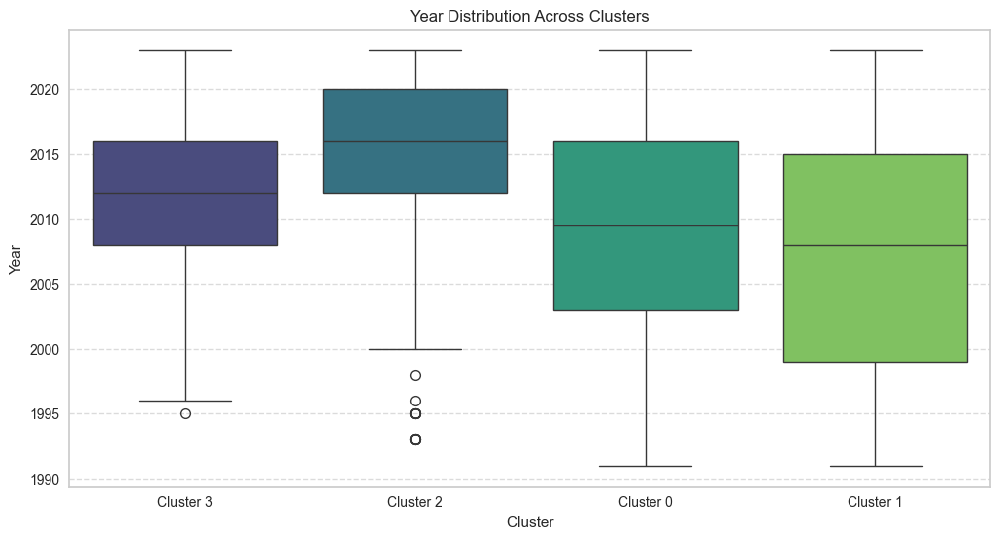

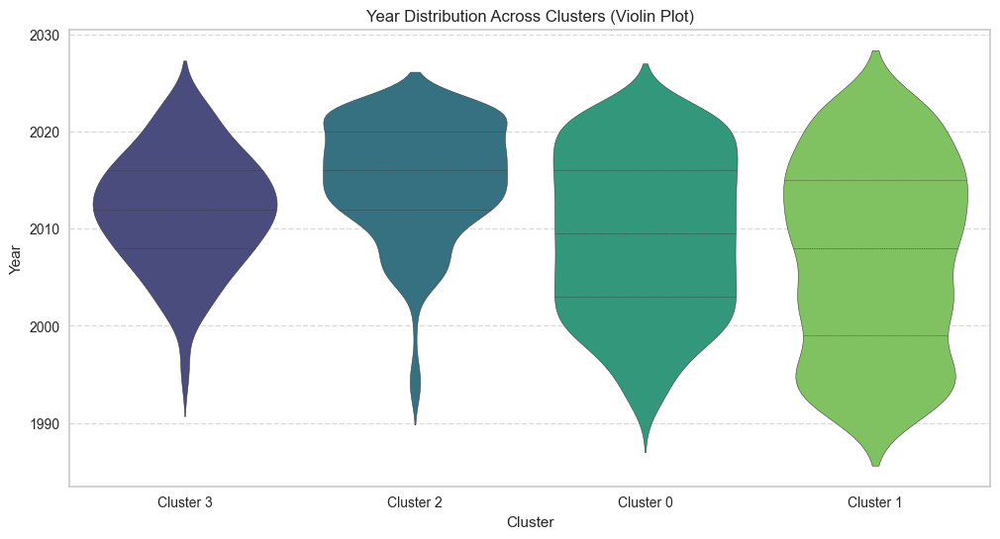

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of 'year' within each cluster
plt.figure(figsize=(12, 6))
sns.boxplot(x='cluster', y='year', data=d, palette='viridis')
plt.title('Year Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Year')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Optional: Plot a violin plot for a more detailed view of the distribution
plt.figure(figsize=(12, 6))
sns.violinplot(x='cluster', y='year', data=d, palette='viridis', inner='quartile')
plt.title('Year Distribution Across Clusters (Violin Plot)')
plt.xlabel('Cluster')
plt.ylabel('Year')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

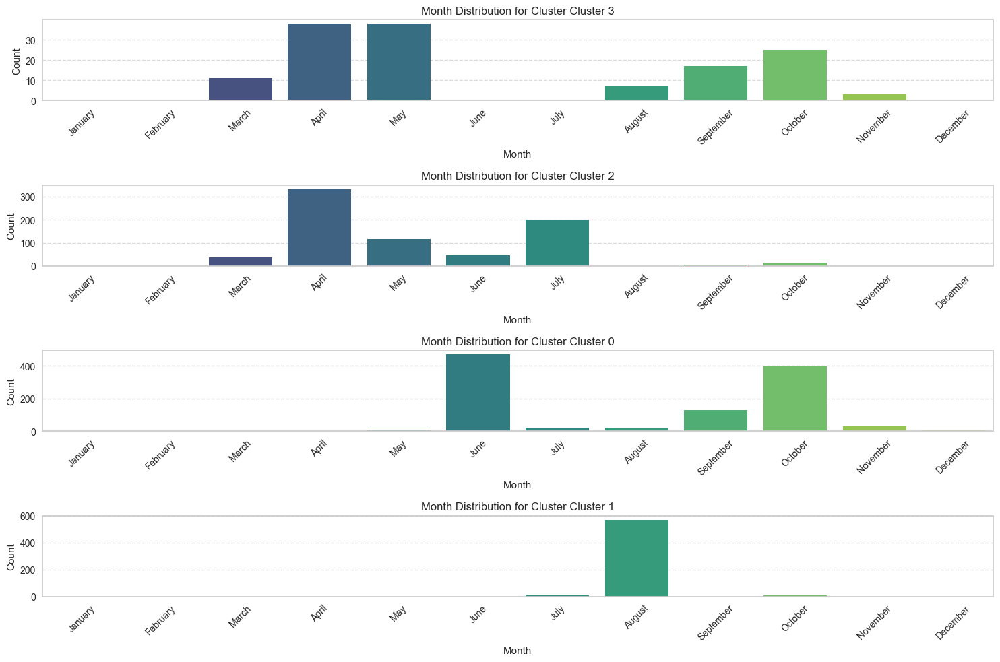

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 'month_sine', 'month_cosine', and 'cluster' columns exist in the DataFrame
required_columns = {'month_sine', 'month_cosine', 'cluster'}
if not required_columns.issubset(d.columns):
    raise ValueError(f"The DataFrame must contain these columns: {required_columns}")

# Convert sine and cosine to an angle in radians and then to months
d['angle_radians'] = np.arctan2(d['month_sine'], d['month_cosine'])
d['month'] = (np.round((d['angle_radians'] / (2 * np.pi)) * 12) % 12 + 1).astype(int)

# Map month numbers to names (optional for better interpretation)
month_map = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
d['month_name'] = d['month'].map(month_map)

# Plot month distributions for each cluster
clusters = d['cluster'].unique()
plt.figure(figsize=(15, 10))

# Enumerate over clusters to use an index for subplot placement
for idx, cluster in enumerate(clusters, start=1):
    plt.subplot(len(clusters), 1, idx)
    cluster_data = d[d['cluster'] == cluster]
    sns.countplot(
        x='month_name',
        data=cluster_data,
        order=month_map.values(),
        palette='viridis'
    )
    plt.title(f'Month Distribution for Cluster {cluster}')
    plt.xlabel('Month')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


In [39]:
anova_df

,column,f_stat,p_value
0,points,2871.854619,0.000000e+00
14,month_sine,532.511619,3.235741e-269
5,cyclist_age_mean,251.287649,5.072537e-143
3,total_racers,225.996068,3.797937e-130
15,month_cosine,209.644389,1.155719e-121
6,cyclist_age_var,202.976630,3.623720e-118
11,BSA_mean,199.492263,2.482503e-116
2,year,134.441632,6.471635e-81
12,BSA_var,75.420472,9.351171e-47
1,length,55.057848,1.724108e-34


ANOVA Results:
              column       f_stat        p_value
0             points  2871.854619   0.000000e+00
14        month_sine   532.511619  3.235741e-269
5   cyclist_age_mean   251.287649  5.072537e-143
3       total_racers   225.996068  3.797937e-130
15      month_cosine   209.644389  1.155719e-121
6    cyclist_age_var   202.976630  3.623720e-118
11          BSA_mean   199.492263  2.482503e-116
2               year   134.441632   6.471635e-81
12           BSA_var    75.420472   9.351171e-47
1             length    55.057848   1.724108e-34
7   cyclist_age_skew    35.859576   1.065114e-22
8         delta_mean    32.072121   2.387437e-20
13          BSA_skew    23.822113   3.325473e-15
9          delta_var    16.414274   1.447766e-10
10        delta_skew     3.066932   2.691525e-02
4        aug_profile     0.208768   8.903744e-01


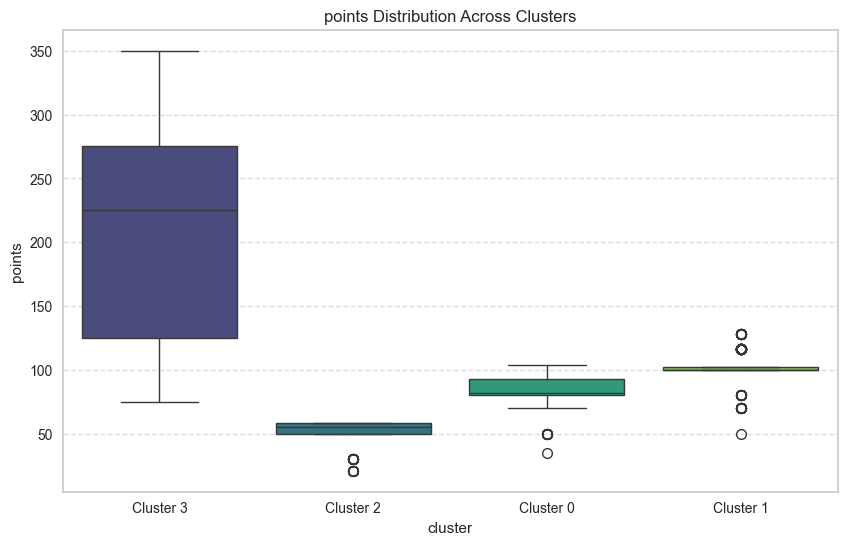

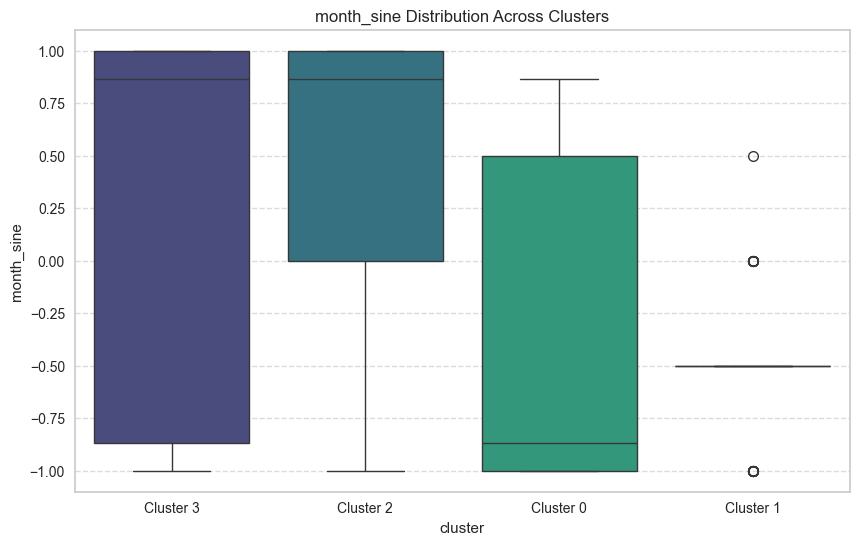

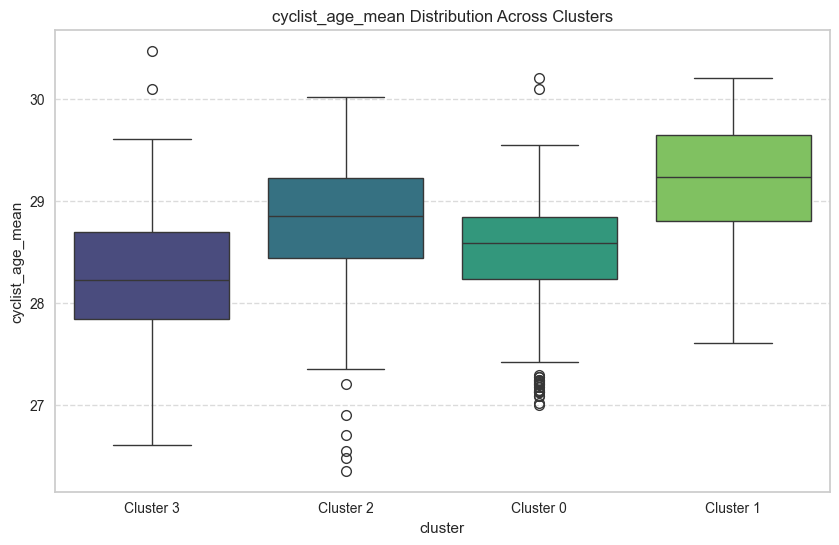

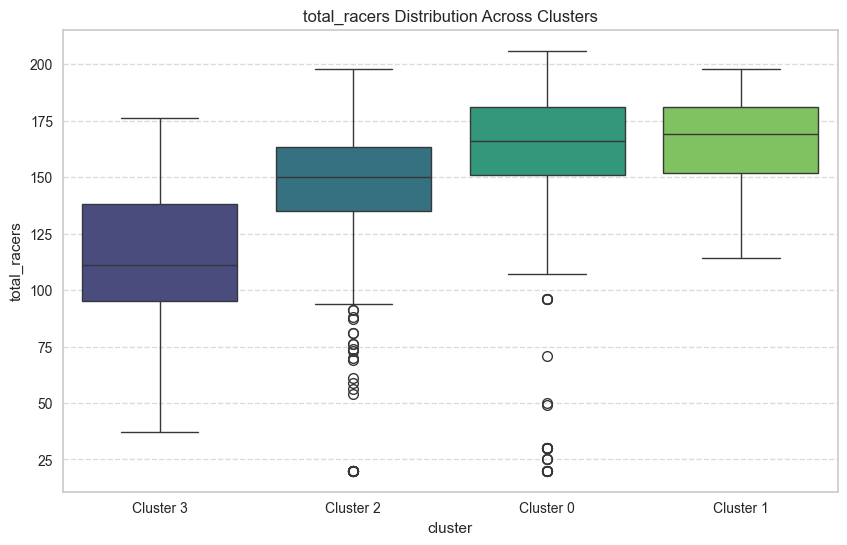

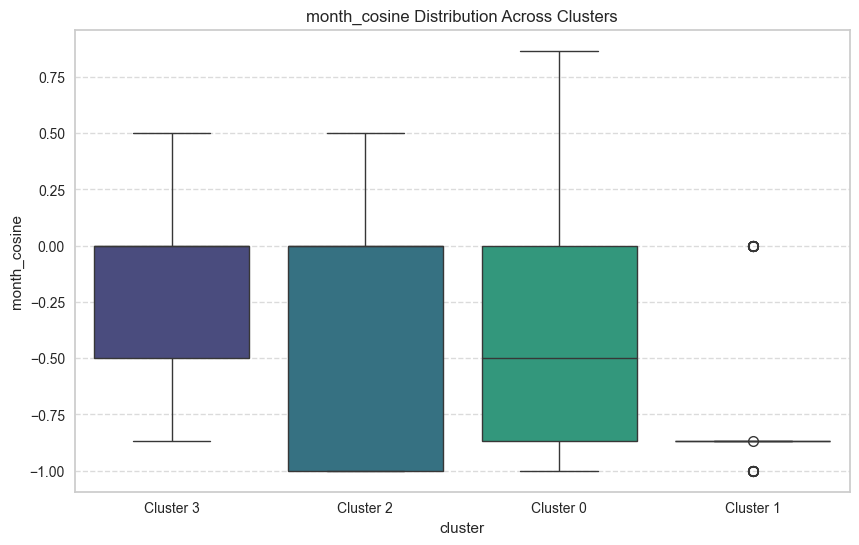

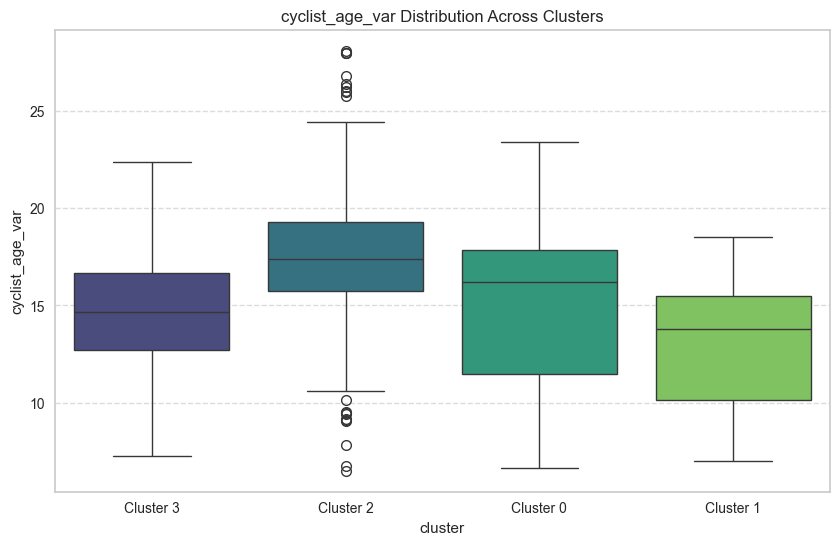

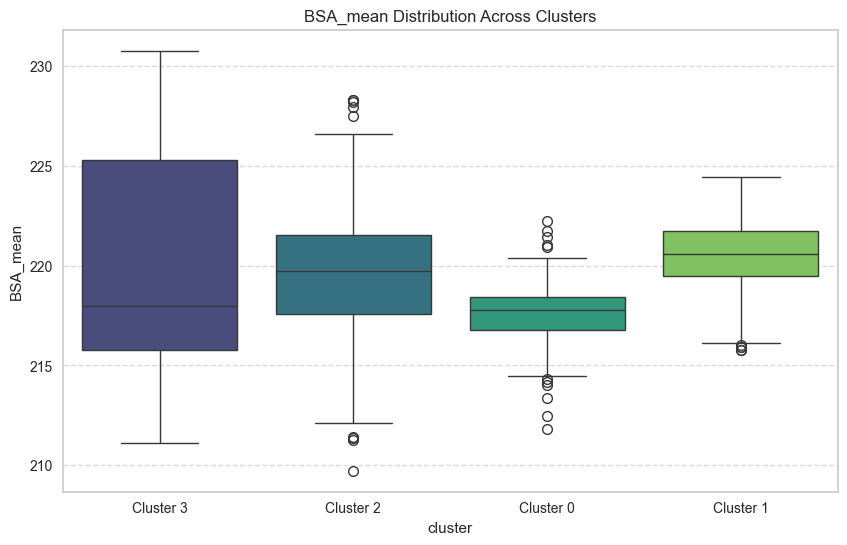

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway

# Define columns to check
columns = [
     'points', 'length',  'year',
     'total_racers', 'aug_profile', 'cyclist_age_mean',
    'cyclist_age_var', 'cyclist_age_skew', 'delta_mean', 'delta_var',
    'delta_skew', 'BSA_mean', 'BSA_var', 'BSA_skew',
    'month_sine', 'month_cosine'
]

# Check if all columns exist in the DataFrame
df_columns = set(d.columns)
missing_columns = [col for col in columns if col not in df_columns]
if missing_columns:
    raise ValueError(f"The following columns are missing from the DataFrame: {missing_columns}")

# Calculate ANOVA for each column
anova_results = []
for col in columns:
    cluster_groups = [group[col].values for name, group in d.groupby('cluster')]
    f_stat, p_value = f_oneway(*cluster_groups)
    anova_results.append({'column': col, 'f_stat': f_stat, 'p_value': p_value})

anova_df = pd.DataFrame(anova_results).sort_values(by='f_stat', ascending=False)

# Display the results
print("ANOVA Results:")
print(anova_df)

# Plot the top differing columns
top_columns = anova_df.nlargest(7, 'f_stat')['column']
for col in top_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='cluster', y=col, data=d, palette='viridis')
    plt.title(f'{col} Distribution Across Clusters')
    plt.xlabel('cluster')
    plt.ylabel(col)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

In [ ]:
# CLuster 0: high variance grand tour
# Cluster 1: tour d france
# Cluster 2: 7 stages
# Cluster 3: single stage events, no tarmac
# Cluster 4: grio ditalia, vuelta espagna

### Pt 2


In [ ]:
	
#num_cluster 6, kmeans, features = ['aug_profile', 'total_stages', 'delta_var', 'is_tarmac', 'startlist_quality', 'month_sine', 'month_cosine']

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4504,917.0519,0.9270,0,0,0


<Figure size 1200x600 with 0 Axes>

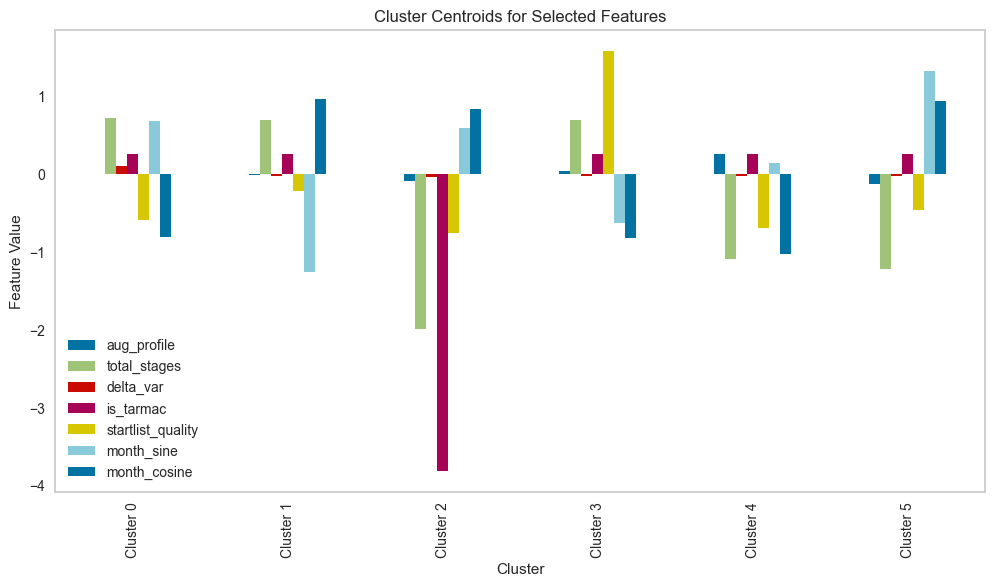

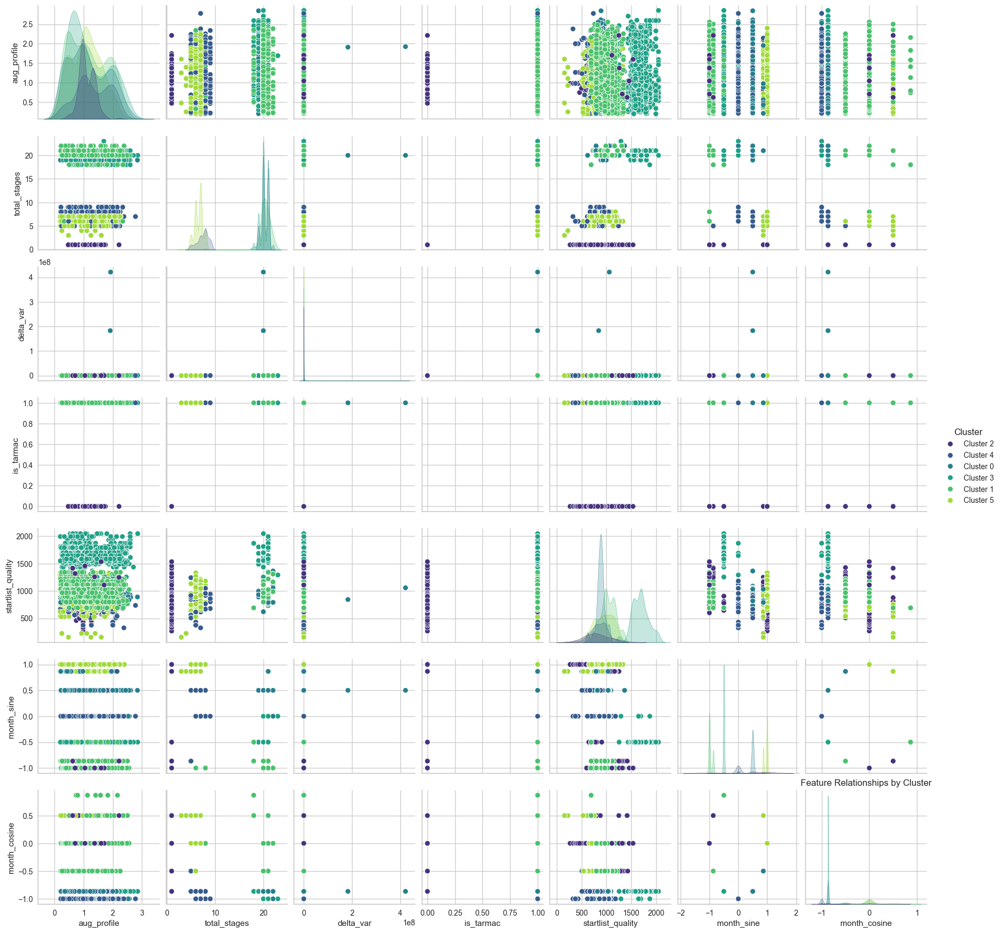

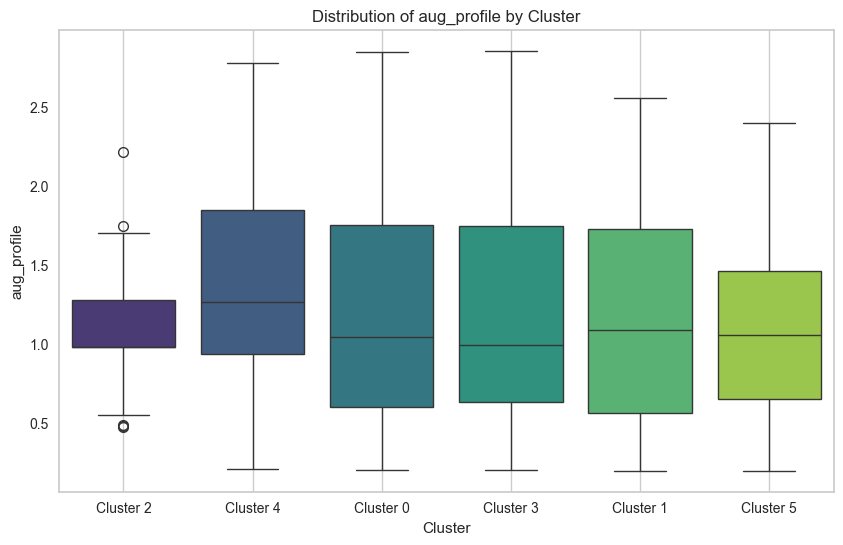

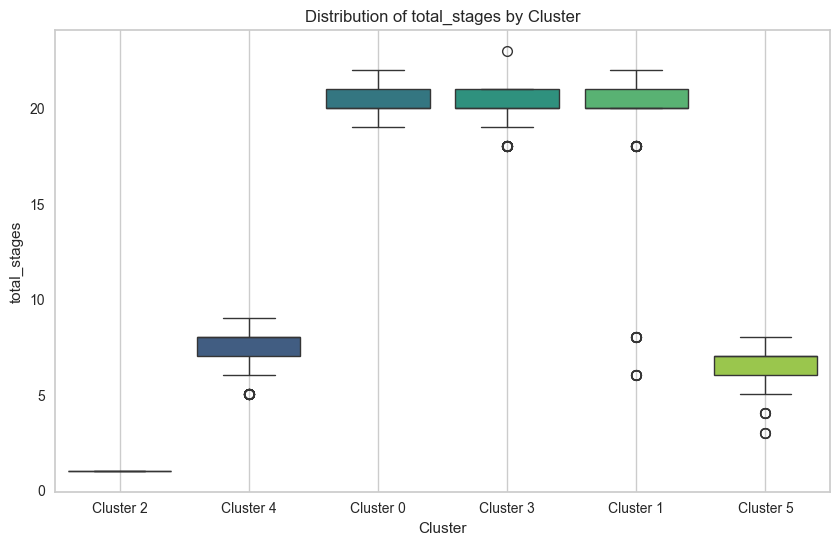

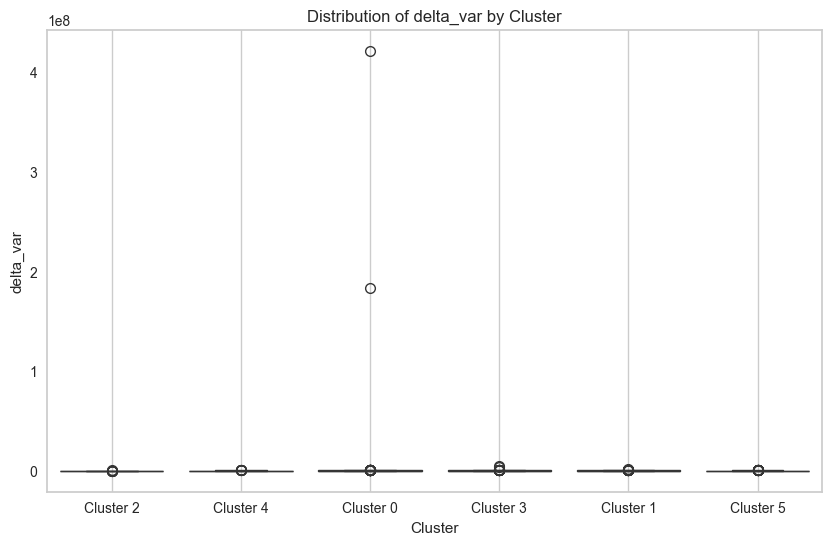

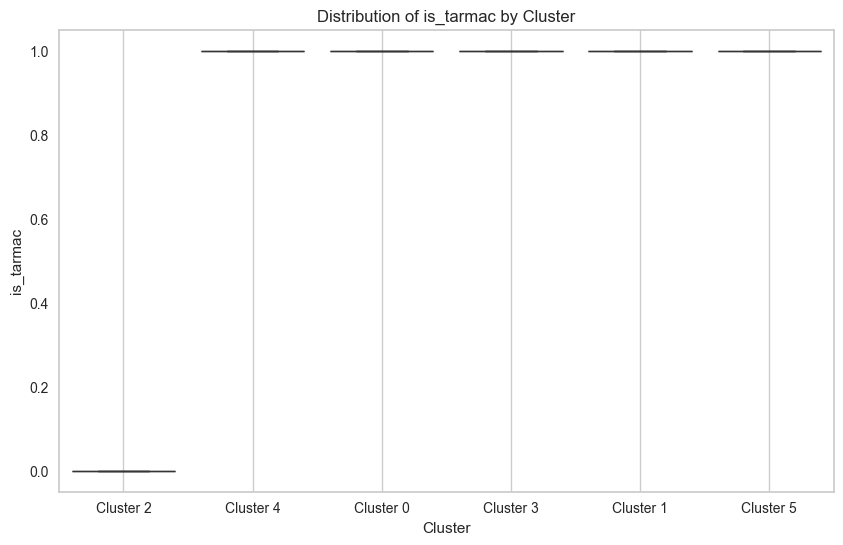

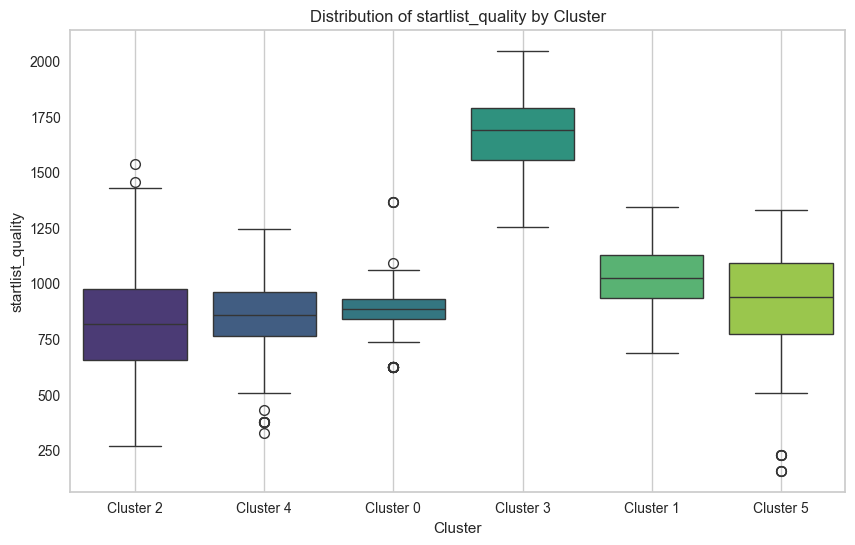

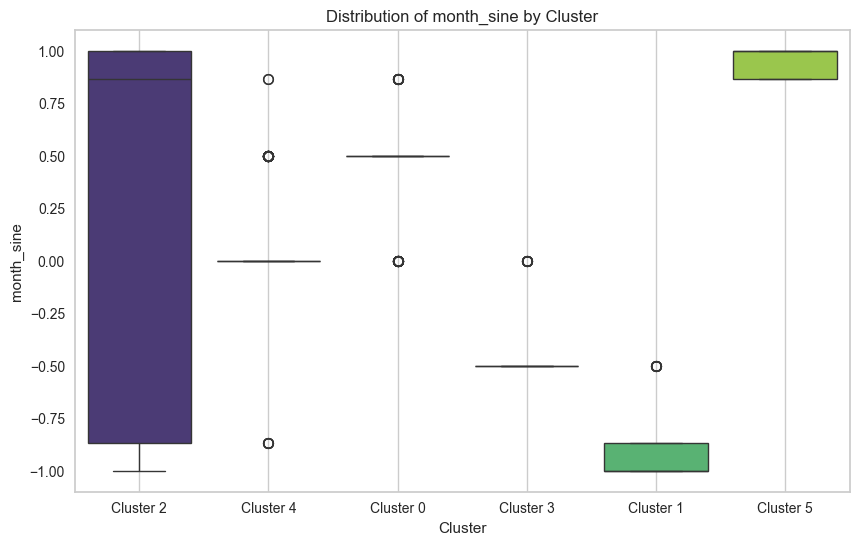

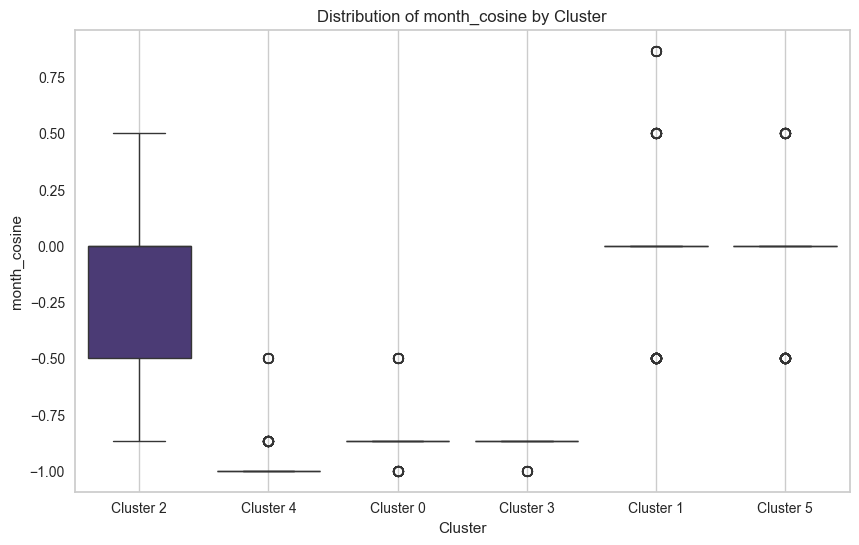

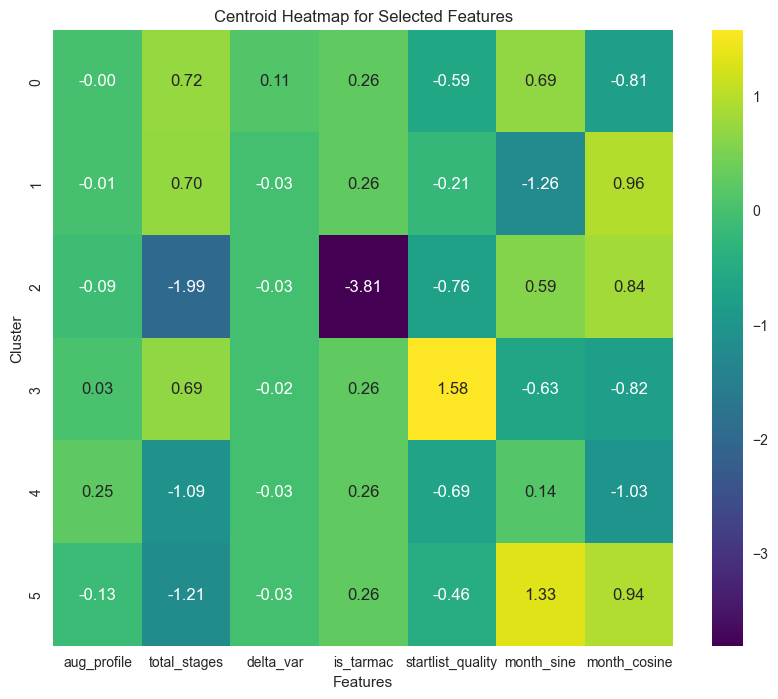

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Data and selected features
selected_features = ['aug_profile', 'total_stages', 'delta_var', 'is_tarmac', 'startlist_quality', 'month_sine', 'month_cosine']

X=df[selected_features]
s = setup(X, 
              session_id=13, 
              normalize=True, 
              # silent=True, 
              verbose=False)


X_t = get_config('X_transformed')

model = create_model('kmeans', num_clusters=6)
res = assign_model(model)

            # Calculate silhouette score
silhouette_score(X_t, res['Cluster'])

# Extract centroids
centroids = model.cluster_centers_

# Plot centroids for selected features
centroids_df = pd.DataFrame(centroids, columns=selected_features)

# 1. Centroid visualization
plt.figure(figsize=(12, 6))
centroids_df.plot(kind='bar', figsize=(12, 6), legend=True)
plt.title('Cluster Centroids for Selected Features')
plt.xlabel('Cluster')
plt.ylabel('Feature Value')
plt.xticks(ticks=range(len(centroids_df)), labels=[f'Cluster {i}' for i in range(len(centroids_df))])
plt.legend(loc='best')
plt.grid()
plt.show()


df["Cluster"] = res['Cluster']
# 2. Pairplot to visualize feature relationships in clusters
sns.pairplot(df[selected_features + ['Cluster']], hue='Cluster', palette='viridis', diag_kind='kde')
plt.title('Feature Relationships by Cluster')
plt.show()


# 4. Boxplots for feature distribution across clusters
for feature in selected_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Cluster', y=feature, data=df, palette='viridis')
    plt.title(f'Distribution of {feature} by Cluster')
    plt.grid()
    plt.show()

# 5. Centroid heatmap for all features
plt.figure(figsize=(10, 8))
sns.heatmap(centroids_df, annot=True, fmt='.2f', cmap='viridis', cbar=True)
plt.title('Centroid Heatmap for Selected Features')
plt.xlabel('Features')
plt.ylabel('Cluster')
plt.show()


In [55]:
pd.crosstab(res["Cluster"],df['race_name'])

race_name,amstel-gold-race,dauphine,dwars-door-vlaanderen,e3-harelbeke,giro-d-italia,gp-montreal,gp-quebec,gran-camino,itzulia-basque-country,la-fleche-wallone,liege-bastogne-liege,milano-sanremo,omloop-het-nieuwsblad,paris-nice,paris-roubaix,ronde-van-vlaanderen,san-sebastian,strade-bianche,tirreno-adriatico,tour-de-france,tour-de-romandie,tour-de-suisse,uae-tour,volta-a-catalunya,vuelta-a-espana,world-championship
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,
Cluster 0,0,0,0,0,477,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31,0
Cluster 1,0,0,0,0,21,0,0,0,0,0,0,0,0,0,0,0,0,0,8,0,0,0,0,6,558,0
Cluster 2,6,0,22,22,0,9,11,0,0,24,3,2,23,0,2,3,20,14,0,0,0,0,0,0,0,7
Cluster 3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,602,0,0,0,0,0,0
Cluster 4,0,97,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,92,0,46,0,0
Cluster 5,0,0,0,0,0,0,0,7,72,0,0,0,0,132,0,0,0,0,123,0,43,0,31,76,0,0


In [56]:
pd.crosstab(res["Cluster"],df['race_category'])

race_category,classic,grand_tour,monument,regional_stage_race,world_championship,world_tour_stage_race
Cluster,,,,,,
Cluster 0,0,508,0,0,0,0
Cluster 1,0,579,0,0,0,14
Cluster 2,151,0,10,0,7,0
Cluster 3,0,603,0,0,0,0
Cluster 4,0,0,0,0,0,254
Cluster 5,0,0,0,7,0,477
